In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
from scipy import stats

In [2]:
!pip install wordcloud

In [2]:
from wordcloud import WordCloud

In [34]:
userdata=pd.read_csv(r"C:\Users\vamsh\Downloads\UserData (2) - UserData (2).csv")
opportunities=pd.read_csv(r"C:\Users\vamsh\Downloads\Opportunity Wise Data - Opportunity Wise Data.csv")


In [25]:
userdata.columns


Index(['PreferredSponsors', 'Gender', 'Country', 'Degree', 'Sign Up Date',
       'city', 'zip', 'isFromSocialMedia'],
      dtype='object')

In [26]:
opportunities.columns

Index(['Profile Id', 'Opportunity Id', 'Opportunity Name',
       'Opportunity Category', 'Opportunity End Date', 'Gender', 'City',
       'State', 'Country', 'Zip Code', 'Graduation Date(YYYY MM)',
       'Current Student Status', 'Current/Intended Major',
       'Status Description', 'Apply Date', 'Opportunity Start Date',
       'Reward Amount', 'Badge Id', 'Badge Name', 'Skill Points Earned',
       'Skills Earned'],
      dtype='object')

In [37]:
userdata.isnull().sum()

PreferredSponsors        0
Gender                9535
Country                 62
Degree               10812
Sign Up Date             0
city                  9534
zip                   9544
isFromSocialMedia        9
dtype: int64

In [38]:
opportunities.isnull().sum()

Profile Id                      0
Opportunity Id                  0
Opportunity Name                0
Opportunity Category            0
Opportunity End Date            0
Gender                          1
City                            1
State                          14
Country                         0
Zip Code                       13
Graduation Date(YYYY MM)        1
Current Student Status          1
Current/Intended Major         44
Status Description              0
Apply Date                      0
Opportunity Start Date        804
Reward Amount               17801
Badge Id                    17801
Badge Name                  17801
Skill Points Earned         17801
Skills Earned               17801
dtype: int64

In [35]:
userdata = userdata.dropna(subset=['Country'])

userdata['Degree']=userdata['Degree'].fillna('Not mentioned').replace('null','Not mentioned')

userdata['Gender']=userdata['Gender'].fillna('Not mentioned')

userdata['isFromSocialMedia']=userdata['isFromSocialMedia'].replace('null', np.nan).fillna(userdata['isFromSocialMedia'].mode()[0])

userdata['city'] = userdata.groupby('Country')['city'].transform(lambda x: x.fillna(x.mode()[0] if not x.mode().empty else 'Not mentioned'))
userdata['zip'] = userdata.groupby('Country')['zip'].transform(lambda x: x.fillna(x.mode()[0] if not x.mode().empty else 'Not mentioned'))

C:\Users\vamsh\AppData\Local\Temp\ipykernel_4652\2509716133.py:7: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  userdata['isFromSocialMedia']=userdata['isFromSocialMedia'].replace('null', np.nan).fillna(userdata['isFromSocialMedia'].mode()[0])


In [36]:
userdata['Sign Up Date'] = pd.to_datetime(userdata['Sign Up Date'])

userdata['Sign Up Date'] = userdata['Sign Up Date'].dt.date


In [37]:
# 2. Handle Missing Values
opportunities['Skill Points Earned'].fillna(0, inplace=True)
opportunities['Reward Amount'].fillna(0, inplace=True)
opportunities['Badge Id'].fillna('NaN', inplace=True)
opportunities['Badge Name'].fillna('NaN', inplace=True)
opportunities['Skills Earned'].fillna('NaN', inplace=True)

opportunities = opportunities[opportunities['Gender'].notna()]
opportunities = opportunities.dropna(subset=['State', 'Zip Code', 'Current/Intended Major'])

opportunities['Opportunity Start Date'] = pd.to_datetime(opportunities['Opportunity Start Date'], errors='coerce')
opportunities['Opportunity End Date'] = pd.to_datetime(opportunities['Opportunity End Date'], errors='coerce')

date_diff = (opportunities['Opportunity End Date'] - opportunities['Opportunity Start Date']).dt.days

median_diff = date_diff.mean() #median()

print(f"Median Difference between End Date and Start Date: {median_diff} days")
opportunities.loc[opportunities['Opportunity Start Date'].isna(), 'Opportunity Start Date'] = \
opportunities['Opportunity End Date'] - pd.to_timedelta(median_diff, unit='D')

opportunities['Skill Points Earned'] = opportunities['Skill Points Earned'].astype(int)

Median Difference between End Date and Start Date: 156.27823181701362 days


C:\Users\vamsh\AppData\Local\Temp\ipykernel_4652\109969571.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  opportunities['Skill Points Earned'].fillna(0, inplace=True)
C:\Users\vamsh\AppData\Local\Temp\ipykernel_4652\109969571.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.


In [38]:
opportunities['Opportunity Start Date'] = opportunities['Opportunity Start Date'].dt.date
opportunities['Opportunity End Date'] = opportunities['Opportunity End Date'].dt.date


In [39]:
# Step 1: Clean the 'Apply Date' column to remove unwanted parts
# Using regex to clean the unwanted string
opportunities['Apply Date'] = opportunities['Apply Date'].str.replace(r', \d+:\d+:\d+$', '', regex=True)

# Step 2: Convert cleaned 'Apply Date' to datetime
opportunities['Apply Date'] = pd.to_datetime(opportunities['Apply Date'], errors='coerce')

# Step 3: Check for remaining missing values
print(f"Number of missing values after conversion: {opportunities['Apply Date'].isna().sum()}")

# Step 4: Fill NaT values with the default date (current date)
default_date = datetime.today().date()
opportunities['Apply Date'].fillna(default_date, inplace=True)

# Step 5: Convert to just date (optional)
opportunities['Apply Date'] = opportunities['Apply Date'].dt.date

# Verify the results
print(opportunities[['Apply Date']].head(10))  # Check the first few values


Number of missing values after conversion: 1


C:\Users\vamsh\AppData\Local\Temp\ipykernel_4652\2026770517.py:13: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  opportunities['Apply Date'].fillna(default_date, inplace=True)
C:\Users\vamsh\AppData\Local\Temp\ipykernel_4652\2026770517.py:13: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '2024-10-24' has dtype incompatible with datetime64[ns], please explicitly cast to a compatible dtype first.
  opportunities['Apply Date'].fillna(default_date, i

AttributeError: Can only use .dt accessor with datetimelike values

In [40]:
# Define the dictionary with all preferred names and their corresponding variations
replacement_dict = {
    "St Louis": ["St Louis","saintlouis","Saintlouis", "St. Louis","saint louis","Saint louis","st louis","ST LOUIS","SAINT LOUIS","saint Louis","St louis", "Saint Louis","Saintt Louis","SAIT LOUIS","Saint louid","St Louise", "St.louis", "Stlouis","saint louis","saint lousis","Saint Louis","Saintloui","SaintLouis","Saint Louis","Saint Louis", "Saint Louis c", "Saint Louis city","Saint Louis I","Saint louis university","StLouis","St lious"],
    "Hyderabad": ["Hyderabad", "Hydrabad", "hyd","HYDERABAD","Hyderabad City","hyderabad i","Hyderabadv","Hyderadad","Hyderavad","Hyderbad","Hydrabad"],
    "Kolkata": ["Kolkata", "Calcutta", "Kolkata City"],
    "Mumbai": ["Mumbai", "Bombay", "Mumbai City","Mumbai", "Mumbai City", "Mumbai City", "Mumbai East", 
        "Mumbai suburban", "Mumhai", "Navi", "Navi mumbai", 
        "NaviMumbai","Mumba","Mumbai","Mumbai City","Mumbai East","Mumbai suburban","Mumhai"],
    "Delhi": ["New Delhi","newdelhi", "New dehi", "Delhi", "Delhi City","New Delhi","South Delhi","South East Delhi","South West Delhi","North Delhi","North East Delhi","North West Delhi","Northwest Delhi"],
    "Bengalore": ["Bengaluru", "Bangalore", "Bengaluru City","Bangalore","Bangalore East","Bangalore Rural","BANGALORE URBAN","Bangaluru","Banglore"],
    "Chennai": ["Chennai", "Madras", "Chennai City","Chenn","Chennai","Chennai Region"],
    "Pune": ["Pune", "Pun","pune", "Pune City"],
    "Jaipur": ["Jaipur", "Jaypur"],
    "Ahmedabad": ["Ahmedabad", "Ahemdabad","Ahamdabad","Ahamdabad"],
    "Lucknow": ["Lucknow", "Lucknow City"],
    "Chandigarh": ["Chandigarh", "Chandigarh City"],
    "Gurugram": ["Gurugram", "Gurgaon"],
    "Thiruvananthapuram": ["Thiruvananthapuram", "Trivandrum"],
    "Coimbatore": ["Coimbatore", "Kovai"],
    "Visakhapatnam": ["Visakhapatnam", "Vizag"],
    "Bhopal": ["Bhopal", "Bhopal City"],
    "Patna": ["Patna", "Patna City"],
    "Surat": ["Surat", "Surat City"],
    "Nagpur": ["Nagpur", "Nagpur City"],
    "Vadodara": ["Vadodara", "Baroda"],
    "Kochi": ["Kochi", "Cochin"],
    "Indore": ["Indore", "Indore City"],
    "Nashik": ["Nashik", "Nashik City"],
    "Agra": ["Agra", "Agra City"],
    "Mysore": ["Mysore", "Mysuru"],
    "Jodhpur": ["Jodhpur", "Jodhpur City"],
    "Dehradun": ["Dehradun", "Dehra Dun"],
    "Raipur": ["Raipur", "Raipur City"],
    "Noida": ["Noida", "Noida City"],
    "Amritsar": ["Amritsar", "Amritsar City"],
    "Varanasi": ["Varanasi", "Benares","Varanasi","Varanasi", "Varnasi", "Vanarasi"],
    "Ranchi": ["Ranchi", "Ranchi City"],
    "Agartala": ["Agartala", "Agartalla"],
    "Guwahati": ["Guwahati", "Guwahati City"],
    "Shillong": ["Shillong", "Shilong"],
    "Dispur": ["Dispur", "Dispur City"],
    "Gangtok": ["Gangtok", "Gangtok City"],
    "Imphal": ["Imphal", "Imphal City"],
    "Kohima": ["Kohima", "Kohima City"],
    "Itanagar": ["Itanagar", "Itanagar City"],
    "Aizawl": ["Aizawl", "Aizwal"],
    "Dimapur": ["Dimapur", "Dimapur City"],
    "Agraharam": ["Agraharam", "Agraharam City"],
    "Abak":["Abak town"],
    "Zaheerabad":["zahirabad"],
    "Yaound": ["Yaound", "Yaounde"],
    "Yamuna nagar": ["Yamuna nagar", "Yamunanagar"],
    "Washington": ["Washington DC", "Washington"],
    "warangal": ["warangal", "waranagal", "WARANGAL URBAN"],
    "wah cantt": ["wah cantt", "Wahcantt"],
    "Visakhapatnam": [
        "Visakhapatnam", "Visakhapatnam", "Vishakapatnam", 
        "Vishakapatnam", "Vishkapatnam"
    ],
    "Vijayapura": ["Vijayapura", "Vijayapur a", "Vijayapur","Vijaya"],
    "VASAI VIRAR": ["VASAI VIRAR", "vasai"],
    
    "Tiruppur": ["Tiruppur", "Tirupur"],
    "Tirupathi": ["Tirupathi", "Tirupati"],
    "Tiruchirapalli": ["Tiruchirapalli", "Tiruchirappalli"],
    "Thu Duc": ["Thu Duc city", "Thu Duc"],
    "Thiruvananthapuram": [
        "Thiruvananthapuram", "thiruvanthapuram"
    ],
     "Srinagar": ["Srinagar", "Srinager"],
    "Siricilla": ["Siricilla", "Sircilla"],
    "Sheikupura": ["Sheikupura", "sheikhupura"],
    "Shebin Elkom": ["Shebin Elkom", "Shebin el kom", "Shebin"],
    "Shagam": ["Shagam", "Shagamu"],
    "Secunderabad": ["secunderabad", "Secunderab","Secundrebad"],
    "Sattenapalli": ["Sattenapalli", "Sattenalalle", "Sattenpalli"],
    "Sathupalli": ["Sathupalli", "Sathupally"],
    "Satellite": ["Satellite", "satellite town"],
    "Sango otta": ["Sango otta", "Sango ota", "Sango"],
    "Sangareddy": ["Sangareddy", "Sangareddi", "Sagareddy"],
    "Rangpur": ["Rangpur", "Rangpur City Corporation"],
    "Rajampeta": ["Rajampeta", "Rajampet"],
    "Rajahmundry": ["Rajahmundry", "Rajahymundry"],
    "Ranga Reddy":["Rangareddy"],
    "Rangpur":["Rangpur city Corporation"],
    "Preston": ["Preston", "Preston I"],
    "Prakasham District": ["Prakasham District", "prakasham"],
    "Porthacourt city": ["Porthacourt city", "Porthacourt", "Porthaco", "Porthacourt"],
    "Port Hacourt": ["Port Hacourt", "Port Harcourt"],
    "Pithoragarh": ["Pithoragarh", "Pithoragarh"],
    "Nizamabad": ["Nizamabad District", "Nizamabab", "Nizamabad","nizamaad","Nizamabad District","Nizmabad"],
    "New York": ["New York", "New York m"],
    "Narasaraopeta": ["Narasaraopeta", "Narasraopeta", "Narasaraopet","narasaroapet","Narasraopeta"],
    "Nandyala": ["Nandyala", "Nandyal"],
    "Nairobi city": ["Nairobi city", "Nairobi c", "Nairobi", "Nairobi Municipality"],
    "Mysore": ["Mysore", "Mysuru","MYSORE"],
    "Missouri": ["Missouri", "Missouri City","MISSOURI CITY"],
    "Medchal Malkajgiri": [
        "Medchal Malkajgiri", "MEDCHALMALKAJGIRI", "Medchal","Medchal"
    ],
    "Marrakesh": ["Marrakesh", "Marrakech"],
    "Manuguru": ["Manuguru", "Manugur"],
    "Mangalore": ["Mangalore", "Mangaluru","Manglore"],
    "Mahendragarh": ["Mahendragarh", "Mahendergarh"],
    "Madurai": ["Madurai", "Madurai I"],
    "Westlake Village":["westlake"],
    "Virar":["Virar East"],
    "Vissanapet":["Vissannapeta"],
    "Vadodara":["Vadodara"],
    "Tracy City":["Tracy"],
    "Thu Duc city":["Thu Duc"],
    "Tenkasi City":["Tenkasi"],
    "Sylhet":["Sylhet"],
    "Surulere":["Surulere Lagos"],
    "Sterling":["Stering"],
    "Station Ghanpur":["Station Ghanapur"],
    "Sivaganga":["Sivagangai"],
    "Sixth Of  October":["Six October","Sixth of October City"],
    "Skardu":["Skardu Baltistan"],
    "Siddharth Nagar":["Siddharthnagar"],
    "Shomolu":["Shomolu onipanu"],
    "Shoubra":["Shoubra Alkheima"],
    "Shebin Elkom":["Shebin el kom","Shebin"],
    "Sheikhupura":["Sheikupura"],
    "Saint Charles":["saint charles","Saint charles","st charles","St charles"],
    "Rawalpindi":["Rawalpindi Pak","Rawalpindi pnjab"],
    "Rayachoti":["Rayachoty"],
    "Rajahmundry":["Rajahymundry"],
    "Rajanna Siricilla":["Rajanna sircilla"],
    "Queens Town":["Queens","queens village","Queenstown"],
    "Pindi":["Pindi Bhattian"],
    "Pithoragarh":["Pithoragrah"],
    "Palmgroove":["Palmgrove"],
    "pakistan":["Pakistam"],
    "Oyingbo":["Oyigbo"],
    "Overland":["Overland Park"],
    "Owerri":["Owerr","Owerri municipal"],
    "Otta":["Ota"],
    "Oshodi":["Oshodi Isolo"],
    "Oklahoma City":["Oklahoma"],
    "Ogbomosho":["Ogbomoso"],
    "Ojo":["Ojo cit"],
    "Obour City":["Obour"],
    "Obuase":["Obousi"],
    "October City":["October"],
    "Nnewi City":["Nnewi"],
    "Newtown center":["Newton"],
    "Nashik":["Nasik"],
    "Nasr city":["Nasr s"],
    "Nandyal":["Nandyala","NANDYALA KURNOOL"],
    "Nallasopara":["nallasopara east"],
    "Muzaffarabaad":["Muzaffarabad"],
    "Morocco":["Morocco Casablanca"],
    "Mombasa":["mombasa","Mombasa county"],
    "mohali":["Mohali n"],
    "Mirpur":["Mirpur Azad kashmir"],
    "Miryalguda":["Miryalaguda"],
    "Mayiladuthurai":["Mayiladuturai"],
    "Mancherial":["Mancherial Adilabad"],
    "Malegaon":["malegoan"],
    "Mahabub Nagar":["Mahabubnagar"],
    "Mahendergarh":["Mahendragarh"],
    "Madanapalle":["Madanapalli"],
    "Lilongwe":["Lilongw"],
    "Lincoln":["Linclon"],
    "Lahore":["Lhore","Lahore Pak","Lahore Pakistan"],
    "Lagos city":["Lagos","Lag","Lagos island","Lagos I","Lagos Mainland","Lagos st","Lagos State"],
    "Kurnool":["Kurnool city","Kurnool"],
    "Kigali city":["Kigali"],
    "khairpur":["Khairpur Mirs"],
    "Khanewal":["Khanewal","Khaneawl"],
    "kathmandu":["Kathmand"],
    "Katsina city":["Katsina","katsina state"],
    "Karachi":["Karach","Karachi","Karachi Pak","Karachi Sindh","Karachu"],
    "Kano city":["Kano","KANO STATE"],
    "Kanpur":["Kanpur Dehat","Kanpur Dehat District","Kanpur Nagar"],
    "Kandukuru":["KANDUKURU"],
    "Kampala":["Kampala city","Kampal","Kampala Ug"],
    "Kakinada":["Kakinada District"],
    "Kamboli":["Kamboli Node"],
    "Kadapa":["Kadapa District","Kadapa distrit"],
    "Kaduna":["Kaduna north","Kaduna st"],
    "Jimete":["Jimeta Yola"],
    "Johannesburg":["Johannesbhrg"],
    "Jhang city":["Jhang"],
    "Jhelum":["Jhelum Punjab"],
    "Jayashankar Bhupalapally":["Jayashankar bhupalapally","Jayashankar Bhupallally","Jayashankar Bhupalpally"],
    "Jangareddiguddem":["Jangareddi gudem","Jangareddygudem"],
    "jalgaon":["Jalgaon Jamod","jalgaon","jalgoan","Jalingo"],
    "jamesville":["jamesville"],
    "Jagityal":["Jagitial"],
    "Jackson":["Jackson Heights"],
    "Jacksonville":["Jacksonville I"],
    "Isolo":["isolo okota","Isolo road"],
    "Isheri":["Isheri Oke"],
    "Islamabad":["Islambad"],
    "indore":["Indore mp"],
    "irbid":["Irbd"],
    "Ile Ife":["IleIfe"],
    "Ikeja":["Ikeja city"],
    "Ikere":["ikire"],
    "Ikorodu":["Ikorodu Lagos"],
    "Ijebu Oe":["IIjebu Ode","Ijebu","Ijebuode"],
    "Ijoko":["Ijoko Ota"],
    "Ifako Ijaiye":["Ifako Ijaye"],
    "Ibadan city":["Iba","Ibadan","Ibadan N","Ibadan Nigeria","Ibadan north","Ibadn"],
    "Ibeju":["Ibeju lekki"],
    "Abak town":["Abak"],
    "Abakailiki":["Abakailiki Ebonyi"],
    "Abeokuta city":["Abeokuta"],
    "Abu Dhabi":["AbuDhabi"],
    
    "Abia State": ["Abia State", "Abia"],
    "Abuja Federal Capital Territory": [
        "Abuja Federal Capital Territory", "Abuja Federal Capital Territor", 
        "Abuja FCT", "Abuja Capital Territory", "Abuja","Abhuja Municipal","FCT","FCT Abuja","Federal ca","Federal capital territory"],
    "Accra":["Accra Ghana","Accra Tema"],
    "Addis Ababa": ["Addis Abeba", "addis ababa","Addisababa","Addisabeba","Addsis Ababa","Adis ababa"],
    "Ado Ekiti":["Ado Ekiti","Ado","Ado Ekiti Nigeria","Adoekiti" ],
    "Akoka":["Akokq"],
    "Akure City":["AKURE","Akure Ondo State","Akure south","Akuse"],
    "Al Omrania":["Al Omranyia"],
    "Alapuzha":["Alappuzha"],
    "Alipuruduar":["Alipurduar"],
    "Ambarnath":["AMBERNATH"],
    "Amuwo":["Amuwo Odofin"],
    "Ankapalle":["Anakapalli"],
    "Antipolo City":["Antipolo"],
    "Arambagh":["Arambag"],
    "Ariyalur":["Ariyalur District"],
    "Arlington":["Arlington Heights","Arlington Height"],
    "Attock city":["Attock"],
    "Awka North":["Awkanorth"],
    "Ayobo":["Ayoboo"],
    "Badwel":["Badvel"],
    "Bahawal nagar":["Bahawalnagar","Bahawalngar"],
    "Bahawalpur":["Bahawalpur punjabi"],
    "Bamenda":["Bamenda I"],
    "Banswada":["Banswara"],
     "Bauchi": ["Baluchi state", "Bauchi","Bauchi bauchi","Bauchi city"],
    "Benin City":["Benin C","Benincity","Benin"],
    "Bhayandar":["Bhayander"],
    "Bhimber":["Bhimber AJK"],
    "BHONGHIR":["bhongir"],
    "Bhubaneshwar":["Bhubaneswar"],
    "Bokaro":["Bokaro Steel City"],
    "Boralesgamuwa":["Borelasgamuwa"],
    "Borivali":["Borivali West"],
    "Brooklyn":["Brookline","Brooklyn New York City"],
 
    "Buffalo":["Buffalo Grove"],
    "Bulandshaer":["Bulandshahr"],
    "Cario":["Cario Egypt"],
    "Calabar":["Calabar municipality","Calabar South"],
    "Capital Territory": ["Capital Territory", "Capial territory", "Capital"],
    "Can Tho City": ["Cantho", "Can Tho","Canton"],
    "Chicago":["Chi","Chiago","Chicago","Chicago Ridge","chicago","CHICAGO","Chicag"],

    "Chilakaluripet":["Chilakaluri pet","chilakaluripeta"],
    "Chittagong":["Chittagon"],
    "Chittoor":["Chitto","Chittoor District","CHITTOR"],
    "Cuddalore":["Cuddalore Dist"],
    "Dakahliya":["Dakalia"],
    "Damanhur":["Damanhour"],
    "Damaturu":["Damaturur"],
    "Dhaka": [
        "dhaka", "Dhaka City", "Dhaka Division", "Dhaka North","Dhaka","Dhaka Bangladesh","DHAKA CITY","Dhaka urror"],
    "Dodoma town":["Dodoma"],
    "Dombivli":["Dombivali","Dombivli east"],
    "Dormaa":["Dormaa municipal"],
    "Draksharama":["Draksharamam"],
    "Eluru city":["Eluru"],
    "Enugu City":["Enugu","Enugu south","Enugu State"],
    "Ernakulam":["Ernakukam"],
    "Faisalabad":["faisal abad","faisalabad","Fasalabad","Fasalabad","Fasilabad"],
    "Festac Town":["FestacTown,Festac","fes"],
    "Frisco":["Frisco Isd"],
    "Gautam Buddha Nagar":["Gautam Buddh Nagar"],
    "Gazipur":["Gazipr","Gazipur jorun","Ghazipur"],
    "Gbagada":["Gbagada Lagos"],
    "Gbawe":["Gbewa"],
    "Gondar":["Gonder","Gonda"],
    "Greater Accra":["Greater Accra Tema"],
    "Gudiwada":["Gudivada"],
    "Gurugram":["gurugram"],
    "Gwarimpa":["Gwarimpa A"],
    "Hamirpur":["Hamirpur District"],
    "Hanmakonda":["Hanamkonda","Hanmakonda"],
    "Hangu":["Hangu kpk"],
    "Ho Chi Minh City":["Ho","Ho Chi Minh","Ho Chi Minh C"],   

}

# Apply the replacement using the dictionary
userdata['city'] = userdata['city'].replace(
    {variation: preferred for preferred, variations in replacement_dict.items() for variation in variations}
)


In [41]:
# Define the dictionary with all preferred names and their corresponding variations
replacement_dict = {
    "Zamfara State": ["Zamfara", "Zamfara state"],
    "West Bengal": ["West Bengal", "Westbengal"],
    "Vietnam": ["Viet Nam", "Vietnam"],
    "Uttar Pradesh": ["Uttar Prades", "Uttar Pradesh", "Uttarpradesh", "Uttarptadesh", "Uttrrpradesh"],
    "Uttarakhand": ["utrakhand", "Uttarakhand", "uttrakhand"],
    "United States": ["United state", "united state"],
    "Teshie": ["Teshie", "Tesjie"],
    "Tamil Nadu": [
        "Tamilnadu TN", "Tamilnadu", "Tamilnad", "Tamil Nady", "Tamil Nadu State", 
        "Tamil Nadu state", "Tamil Nadu h", "Tamil Nade", "Tamil Nad", "Tamil"
    ],
    "Souss Massa": ["Souss Massa", "sousse"],
    "Sokoto State": ["Sokoto State", "Sokoto", "Sokcho"],
    "Rivers State": ["River State", "Rivers", "Rivers state", "Rivers state Nigeria", "River", "RiversState"],
    "Rajasthan": ["Rajasthan", "rajsthan"],
    "Pune": ["Pune", "Pun"],
    "Puducherry": ["Pu", "Puducherry", "Pondicherry"],
    "Punjab": ["Punjab", "Pnjab"],
    "Plateau State": ["Plateau", "Plateau State", "Plateau State we"],
    "Pakistan": ["Pakistan k", "Pakistan Punjab", "pakistan", "Pakista", "Pakist", "Pak"],
    "Oyo State": ["Oyo", "Oyo N", "Oyo St", "Oyo State"],
    "Osun State": ["Osun", "Osun State"],
    "Oromia": ["Oromia", "Oromiya"],
    "Ondo State": ["Ondo State", "Ondo"],
    "Ogun State": ["Ogun", "Ogun Stat", "Ogun State", "Ogunstate"],
    "Not Applicable": ["not app", "Not applic", "Not Applicable"],
    "Northwest": ["Northwest Region", "Northwest"],
    "Northern": ["Northern R", "Northern"],
    "North West Region": ["North West", "North West Region"],
    "None": ["Non", "None"],
    "Ninh Kieu": ["Ninh Kieu", "Ninh Kieu district"],
    "Niger State": ["Niger", "Niger start", "Niger state"],
    "New Delhi": ["New Delhi", "New dehi"],
    "Nassarawa State": ["Nassarawa", "Nassarawa State", "Nasar city", "Nasarawa state", "Nasarawa"],
    "Nairobi": ["Nairobi", "Nairobi Area"],
    "NA": ["NA", "N A", "N"],
    "Maharashtra": [
        "Maharastra", "Mumbai", "Msharashtra", "mahrashtra", 
        "maharshtra", "maharastra", "Maharasthra", "Maharashtra", 
        "Maharashtr", "Maharashta", "Maharahtra"
    ],
    "Madhya Pradesh": [
        "Mp", "Mp b", "Madhya Pradesh", "Madhyapradesh", 
        "Madhya pradesh", "Madhya", "M P"
    ],
    "Missouri": ["Missouri", "Missori", "Missouri State"],
    "Marrakesh Safi": ["Marrakesh Safi", "Marrakesh safi"],
    "Madhesh Province": ["Madhesh", "Madhesh pardesh", "Madhesh Pardesh", "Madhesh Province"],
    "Lukasa Province": ["Lukasa Province", "Lukasa"],
    "Louisiana": ["Louisiana", "Louis"],
    "Littoral": ["Littoral", "Litoral"],
    "Lagos": ["Lagos City", "Lago", "Lagos", "Lagos I", "Lagos st", "Lagos Sta"],
    "Kwara State": ["Kwara state", "Kwara"],
    "Kogi State": ["Kogi state", "Kogi"],
    "Kigali": ["Kigali city", "Kigali"],
    "Khyber Pakhtunkhwa": ["Khyber Pukhtonkhwa", "Khyber pukhton khwa", "Khyber Pakhtunkhwa"],
    "Telangana": [
        "Telagana", "TELANGAN", "TELANGANA", "telangan", "telangana", 
        "Telangana", "Telangana State", "Telangans", "Telegana", 
        "Telengana", "Tela", "Tel", "Khammam"
    ],
    "Kerala": ["Kerala", "Keral"],
    "Kenya": ["Kenya state", "Kenya"],
    "Kebbi State": ["Kebbi State", "Kebbi", "ke"],
    "Katsina State": ["Katsina state", "Katsina"],
    "Karnataka": ["Karnataka", "Karantaka", "karnatak", "Karnataka State", "karnatka"],
    "Kano State": ["Kano state", "Kano"],
    "Kampala": ["Kampala", "Kampala city", "Kampala state", "Kampala Ug"],
    "Kaduna State": ["Kaduna state", "Kaduna st", "Kaduna"],
    "Jubbaland": ["jubbaland state", "jubbaland", "jubaland"],
    "Jigawa State": ["igawa State", "Jigawa"],
    "Jammu and Kashmir": ["Jammu ana kashmir", "Jammu and Kashmir", "Jammu und Kashmir", "Jammu"],
    "Islamic Republic of Pakistan": ["Islamic Republic of Pakistan", "Islamic republic", "Islamic"],
    "Islamabad": ["Islamabad Capital Territory", "islamabad", "Islam"],
    "Imo": ["Imo", "Imo s"],
    "Illinois": ["Illinois", "ill", "Illinios", "illionis", "Illnois"],
    "Hyderabad": ["Hyderabad", "Hydrabad", "hyd"],
    "Hoang Mai": ["Hoang Mai", "Hoangmai"],
    "Ho Chi Minh City": ["Ho Chi Minh", "Ho Chi Minh City"],
    "Haryana": ["Harayana", "Haryan", "Haryana", "Haryans"],
    "Hai Phong": ["Hai Phong", "Haiphong"],
    "Hai Ba Trung": ["Hai Ba Trung", "Hai Ba Trung District"],
    "Gujarat": ["GUJARAT", "Gujrat"],
    "Guangdong": ["Guangdong Province", "Guangdong"],
    "Greater Accra": [
        "Greater Accra Region", "Greater Accra state", "Greater", 
        "Greater Acc", "Greater Accra", "Greater Accra Ablekuma"
    ],
    "Gombe State": ["Gombe", "Gombe State"],
    "Giza Governorate": ["Giza", "Giza Governorate"],
    "Gilgit Baltistan": ["Gilgit", "Gilgit Baltistan"],
    "Free State": ["Free State", "FreeState"],
    "Federal Capital Territory": [
        "Federal capital territory", "Federal Capital Territory", 
        "Federal", "Federal State", "Fedral"
    ],
    "Fayioum": ["Fayioum", "fayoum"],
    "Faisalabad": ["faisalabad", "faisal"],
    "England": ["England", "England u"],
    "Ekiti State": ["EKITI State", "Ekiti State"],
    "Edo State": ["Edo State", "Edo st", "Edo S", "Edo"],
    "Eastern Province": ["Eastern province", "Easter Province"],
    "Dhaka": ["dhaka", "Dhaka City", "Dhaka Division", "Dhaka North"],
    "Delta State": ["Delta State", "Delta state Nigeria", "Delta"],
    "Delhi": ["Delhi", "DelhuDel"],
    "Damietta": ["Damietta", "dameitta"],
    "Dakahliya": ["Dakahliya", "Dakahlia"],
    "Cross River State": ["Cross River State", "Cross River"],
    "Chhattisgarh": ["Chhattisgarh", "Chattisghar", "Chattisgarh"],
    "Central Province": ["Central province", "Central", "Center", "Central region"],
    "Capital Territory": ["Capital Territory", "Capial territory", "Capital"],
    "Can Tho": ["Cantho", "Can Tho"],
    "Cairo Governorate": ["Cario Governorate", "cario"],
    "Borno State": ["Borno state", "Borno"],
    "Bono": ["Bono", "Bono East", "Bono Region", "BonoEast"],
    "Benue State": ["Benue state", "Benue"],
    "Bauchi": ["Baluchi state", "Bauchi"],
    "Bangalore": ["Bangalore", "Bengaluru"],
    "Bahawalpur": ["Bahawalpur", "Bahawal pur", "Bahwalpur", "bahawalnagr"],
    "Bagmati Province": ["Bagmati State", "Bagmati", "Bagmati Province", "Bagamati Province"],
    "Assiut": ["Assuit", "Assiut"],
    "Ashanti Region": ["Ashante Region", "Ashanti", "Ashanti Region"],
    "Andhra Pradesh": [
        "Andrapradesh", "Andra Pradesh", "ANDHRAPRADESH", 
        "Andhra pradesh", "Andhra Pradesh state", "Andhra Pradesh", 
        "Andhra", "Andhrapradesh"
    ],
    "Andaman and Nicobar Islands": ["Andaman and Nicobar Islands", "Andaman"],
    "Anambra State": ["Anambra state", "Anambra"],
    "Amhara Region": ["Amhara Region", "Amhara"],
    "Alexandria": ["Alexanderia", "Alexandria", "Alexandr", "Alex"],
    "Al Gharbia": ["Al Gharbia", "Al Gharbiya"],
    "Akwa Ibom State": ["Akwa Ibom state", "Akwaiborn", "Akwa Ibom state"],
    "Ain Shams": ["Ain shams", "Ain"],
    "Addis Ababa": ["Addis Abeba", "addis ababa"],
    "Adamawa State": ["Adamawa state", "Adamawa"],
    "Abuja": [
        "Abuja Federal Capital Territory", "Abuja Federal Capital Territor", 
        "Abuja FCT", "Abuja Capital Territory", "Abuja"
    ],
    "Abia State": ["Abia State", "Abia"]
}

# Apply the replacement using the dictionary
opportunities['State'] = opportunities['State'].replace(
    {variation: preferred for preferred, variations in replacement_dict.items() for variation in variations}
)


In [42]:

   
# Define the dictionary with all preferred names and their corresponding variations
replacement_dict = {
    "St Louis": ["St Louis","saintlouis","Saintlouis", "St. Louis","saint louis","Saint louis","st louis","ST LOUIS","SAINT LOUIS","saint Louis","St louis", "Saint Louis","Saintt Louis","SAIT LOUIS","Saint louid","St Louise", "St.louis", "Stlouis","saint louis","saint lousis","Saint Louis","Saintloui","SaintLouis","Saint Louis","Saint Louis", "Saint Louis c", "Saint Louis city","Saint Louis I","Saint louis university","StLouis","St lious",
                "St Louis","saintlouis","Saintlouis", "St. Louis","saint louis","Saint louis","st louis","ST LOUIS","SAINT LOUIS","saint Louis","St louis", "Saint Louis","Saintt Louis","SAIT LOUIS","Saint louid","St Louise", "St.louis", "Stlouis","saint louis","saint lousis","Saint Louis","Saintloui","SaintLouis","Saint Louis","Saint Louis", "Saint Louis c", "Saint Louis city","Saint Louis I","Saint louis university","StLouis","St lious"],
    "Hyderabad": ["Hyderabad", "Hydrabad", "hyd","HYDERABAD","Hyderabad City","hyderabad i","Hyderabadv","Hyderadad","Hyderavad","Hyderbad","Hydrabad"],
    "Kolkata": ["Kolkata", "Calcutta", "Kolkata City"],
    "Mumbai": ["Mumbai", "Bombay", "Mumbai City","Mumbai", "Mumbai City", "Mumbai City", "Mumbai East", 
        "Mumbai suburban", "Mumhai", "Navi", "Navi mumbai", 
        "NaviMumbai","Mumba","Mumbai","Mumbai City","Mumbai East","Mumbai suburban","Mumhai"],
    "Delhi": ["New Delhi","newdelhi", "New dehi", "Delhi", "Delhi City","New Delhi","South Delhi","South East Delhi","South West Delhi","North Delhi","North East Delhi","North West Delhi","Northwest Delhi"],
    "Bangalore": ["Bengalore","Bangalore", "Bengaluru","Bengaluru", "Bangalore", "Bengaluru City","Bangalore","Bangalore East","Bangalore Rural","BANGALORE URBAN","Bangaluru","Banglore"],
      "Bangalore": ["Bangalore", "Bengaluru"],
    "Chennai": ["Chennai", "Madras", "Chennai City","Chenn","Chennai","Chennai Region"],
    "Pune": ["Pune", "Pun","pune", "Pune City"],
    "Jaipur": ["Jaipur", "Jaypur"],
    "Ahmedabad": ["Ahmedabad", "Ahemdabad","Ahamdabad","Ahamdabad"],
    "Lucknow": ["Lucknow", "Lucknow City"],
    "Chandigarh": ["Chandigarh", "Chandigarh City"],
    "Gurugram": ["Gurugram", "Gurgaon"],
    "Thiruvananthapuram": ["Thiruvananthapuram", "Trivandrum"],
    "Coimbatore": ["Coimbatore", "Kovai"],
    "Visakhapatnam": ["Visakhapatnam", "Vizag"],
    "Bhopal": ["Bhopal", "Bhopal City"],
    "Patna": ["Patna", "Patna City"],
    "Surat": ["Surat", "Surat City"],
    "Nagpur": ["Nagpur", "Nagpur City"],
    "Vadodara": ["Vadodara", "Baroda"],
    "Kochi": ["Kochi", "Cochin"],
    "Indore": ["Indore", "Indore City"],
    "Nashik": ["Nashik", "Nashik City"],
    "Agra": ["Agra", "Agra City"],
    "Mysore": ["Mysore", "Mysuru"],
    "Jodhpur": ["Jodhpur", "Jodhpur City"],
    "Dehradun": ["Dehradun", "Dehra Dun"],
    "Raipur": ["Raipur", "Raipur City"],
    "Noida": ["Noida", "Noida City"],
    "Amritsar": ["Amritsar", "Amritsar City"],
    "Varanasi": ["Varanasi", "Benares","Varanasi","Varanasi", "Varnasi", "Vanarasi"],
    "Ranchi": ["Ranchi", "Ranchi City"],
    "Agartala": ["Agartala", "Agartalla"],
    "Guwahati": ["Guwahati", "Guwahati City"],
    "Shillong": ["Shillong", "Shilong"],
    "Dispur": ["Dispur", "Dispur City"],
    "Gangtok": ["Gangtok", "Gangtok City"],
    "Imphal": ["Imphal", "Imphal City"],
    "Kohima": ["Kohima", "Kohima City"],
    "Itanagar": ["Itanagar", "Itanagar City"],
    "Aizawl": ["Aizawl", "Aizwal"],
    "Dimapur": ["Dimapur", "Dimapur City"],
    "Agraharam": ["Agraharam", "Agraharam City"],
    "Abak":["Abak town"],
    "Zaheerabad":["zahirabad"],
    "Yaound": ["Yaound", "Yaounde"],
    "Yamuna nagar": ["Yamuna nagar", "Yamunanagar"],
    "Washington": ["Washington DC", "Washington"],
    "warangal": ["warangal", "waranagal", "WARANGAL URBAN"],
    "wah cantt": ["wah cantt", "Wahcantt"],
    "Visakhapatnam": [
        "Visakhapatnam", "Visakhapatnam", "Vishakapatnam", 
        "Vishakapatnam", "Vishkapatnam"
    ],
    "Vijayapura": ["Vijayapura", "Vijayapur a", "Vijayapur","Vijaya"],
    "VASAI VIRAR": ["VASAI VIRAR", "vasai"],
    
    "Tiruppur": ["Tiruppur", "Tirupur"],
    "Tirupathi": ["Tirupathi", "Tirupati"],
    "Tiruchirapalli": ["Tiruchirapalli", "Tiruchirappalli"],
    "Thu Duc": ["Thu Duc city", "Thu Duc"],
    "Thiruvananthapuram": [
        "Thiruvananthapuram", "thiruvanthapuram"
    ],
     "Srinagar": ["Srinagar", "Srinager"],
    "Siricilla": ["Siricilla", "Sircilla"],
    "Sheikupura": ["Sheikupura", "sheikhupura"],
    "Shebin Elkom": ["Shebin Elkom", "Shebin el kom", "Shebin"],
    "Shagam": ["Shagam", "Shagamu"],
    "Secunderabad": ["secunderabad", "Secunderab","Secundrebad"],
    "Sattenapalli": ["Sattenapalli", "Sattenalalle", "Sattenpalli"],
    "Sathupalli": ["Sathupalli", "Sathupally"],
    "Satellite": ["Satellite", "satellite town"],
    "Sango otta": ["Sango otta", "Sango ota", "Sango"],
    "Sangareddy": ["Sangareddy", "Sangareddi", "Sagareddy"],
    "Rangpur": ["Rangpur", "Rangpur City Corporation"],
    "Rajampeta": ["Rajampeta", "Rajampet"],
    "Rajahmundry": ["Rajahmundry", "Rajahymundry"],
    "Ranga Reddy":["Rangareddy"],
    "Rangpur":["Rangpur city Corporation"],
    "Preston": ["Preston", "Preston I"],
    "Prakasham District": ["Prakasham District", "prakasham"],
    "Porthacourt city": ["Porthacourt city", "Porthacourt", "Porthaco", "Porthacourt"],
    "Port Hacourt": ["Port Hacourt", "Port Harcourt"],
    "Pithoragarh": ["Pithoragarh", "Pithoragarh"],
    "Nizamabad": ["Nizamabad District", "Nizamabab", "Nizamabad","nizamaad","Nizamabad District","Nizmabad"],
    "New York": ["New York", "New York m"],
    "Narasaraopeta": ["Narasaraopeta", "Narasraopeta", "Narasaraopet","narasaroapet","Narasraopeta"],
    "Nandyala": ["Nandyala", "Nandyal"],
    "Nairobi city": ["Nairobi city", "Nairobi c", "Nairobi", "Nairobi Municipality"],
    "Mysore": ["Mysore", "Mysuru","MYSORE"],
    "Missouri": ["Missouri", "Missouri City","MISSOURI CITY"],
    "Medchal Malkajgiri": [
        "Medchal Malkajgiri", "MEDCHALMALKAJGIRI", "Medchal","Medchal"
    ],
    "Marrakesh": ["Marrakesh", "Marrakech"],
    "Manuguru": ["Manuguru", "Manugur"],
    "Mangalore": ["Mangalore", "Mangaluru","Manglore"],
    "Mahendragarh": ["Mahendragarh", "Mahendergarh"],
    "Madurai": ["Madurai", "Madurai I"],
    "Westlake Village":["westlake"],
    "Virar":["Virar East"],
    "Vissanapet":["Vissannapeta"],
    "Vadodara":["Vadodara"],
    "Tracy City":["Tracy"],
    "Thu Duc city":["Thu Duc"],
    "Tenkasi City":["Tenkasi"],
    "Sylhet":["Sylhet"],
    "Surulere":["Surulere Lagos"],
    "Sterling":["Stering"],
    "Station Ghanpur":["Station Ghanapur"],
    "Sivaganga":["Sivagangai"],
    "Sixth Of  October":["Six October","Sixth of October City"],
    "Skardu":["Skardu Baltistan"],
    "Siddharth Nagar":["Siddharthnagar"],
    "Shomolu":["Shomolu onipanu"],
    "Shoubra":["Shoubra Alkheima"],
    "Shebin Elkom":["Shebin el kom","Shebin"],
    "Sheikhupura":["Sheikupura"],
    "Rawalpindi":["Rawalpindi Pak","Rawalpindi pnjab"],
    "Rayachoti":["Rayachoty"],
    "Rajahmundry":["Rajahymundry"],
    "Rajanna Siricilla":["Rajanna sircilla"],
    "Queens Town":["Queens","queens village","Queenstown"],
    "Pindi":["Pindi Bhattian"],
    "Pithoragarh":["Pithoragrah"],
    "Palmgroove":["Palmgrove"],
    "pakistan":["Pakistam"],
    "Oyingbo":["Oyigbo"],
    "Overland":["Overland Park"],
    "Owerri":["Owerr","Owerri municipal"],
    "Otta":["Ota"],
    "Oshodi":["Oshodi Isolo"],
    "Oklahoma City":["Oklahoma"],
    "Ogbomosho":["Ogbomoso"],
    "Ojo":["Ojo cit"],
    "Obour City":["Obour"],
    "Obuase":["Obousi"],
    "October City":["October"],
    "Nnewi City":["Nnewi"],
    "Newtown center":["Newton"],
    "Nashik":["Nasik"],
    "Nasr city":["Nasr s"],
    "Nandyal":["Nandyala","NANDYALA KURNOOL"],
    "Nallasopara":["nallasopara east"],
    "Muzaffarabaad":["Muzaffarabad"],
    "Morocco":["Morocco Casablanca"],
    "Mombasa":["mombasa","Mombasa county"],
    "mohali":["Mohali n"],
    "Mirpur":["Mirpur Azad kashmir"],
    "Miryalguda":["Miryalaguda"],
    "Mayiladuthurai":["Mayiladuturai"],
    "Mancherial":["Mancherial Adilabad"],
    "Malegaon":["malegoan"],
    "Mahabub Nagar":["Mahabubnagar"],
    "Mahendergarh":["Mahendragarh"],
    "Madanapalle":["Madanapalli"],
    "Lilongwe":["Lilongw"],
    "Lincoln":["Linclon"],
    "Lahore":["Lhore","Lahore Pak","Lahore Pakistan"],
    "Lagos city":["Lagos","Lag","Lagos island","Lagos I","Lagos Mainland","Lagos st","Lagos State"],
    "Kurnool":["Kurnool city","Kurnool"],
    "Kigali city":["Kigali"],
    "khairpur":["Khairpur Mirs"],
    "Khanewal":["Khanewal","Khaneawl"],
    "kathmandu":["Kathmand"],
    "Katsina city":["Katsina","katsina state"],
    "Karachi":["Karach","Karachi","Karachi Pak","Karachi Sindh","Karachu"],
    "Kano city":["Kano","KANO STATE"],
    "Kanpur":["Kanpur Dehat","Kanpur Dehat District","Kanpur Nagar"],
    "Kandukuru":["KANDUKURU"],
    "Kampala":["Kampala city","Kampal","Kampala Ug"],
    "Kakinada":["Kakinada District"],
    "Kamboli":["Kamboli Node"],
    "Kadapa":["Kadapa District","Kadapa distrit"],
    "Kaduna":["Kaduna north","Kaduna st"],
    "Jimete":["Jimeta Yola"],
    "Johannesburg":["Johannesbhrg"],
    "Jhang city":["Jhang"],
    "Jhelum":["Jhelum Punjab"],
    "Jayashankar Bhupalapally":["Jayashankar bhupalapally","Jayashankar Bhupallally","Jayashankar Bhupalpally"],
    "Jangareddiguddem":["Jangareddi gudem","Jangareddygudem"],
    "jalgaon":["Jalgaon Jamod","jalgaon","jalgoan","Jalingo"],
    "jamesville":["jamesville"],
    "Jagityal":["Jagitial"],
    "Jackson":["Jackson Heights"],
    "Jacksonville":["Jacksonville I"],
    "Isolo":["isolo okota","Isolo road"],
    "Isheri":["Isheri Oke"],
    "Islamabad":["Islambad"],
    "indore":["Indore mp"],
    "irbid":["Irbd"],
    "Ile Ife":["IleIfe"],
    "Ikeja":["Ikeja city"],
    "Ikere":["ikire"],
    "Ikorodu":["Ikorodu Lagos"],
    "Ijebu Oe":["IIjebu Ode","Ijebu","Ijebuode"],
    "Ijoko":["Ijoko Ota"],
    "Ifako Ijaiye":["Ifako Ijaye"],
    "Ibadan city":["Iba","Ibadan","Ibadan N","Ibadan Nigeria","Ibadan north","Ibadn"],
    "Ibeju":["Ibeju lekki"],
    "Abak town":["Abak"],
    "Abakailiki":["Abakailiki Ebonyi"],
    "Abeokuta city":["Abeokuta"],
    "Abu Dhabi":["AbuDhabi"],
    
    "Abia State": ["Abia State", "Abia"],
    "Abuja Federal Capital Territory": [
        "Abuja Federal Capital Territory", "Abuja Federal Capital Territor", 
        "Abuja FCT", "Abuja Capital Territory", "Abuja","Abhuja Municipal","FCT","FCT Abuja","Federal ca","Federal capital territory"],
    "Accra":["Accra Ghana","Accra Tema"],
    "Addis Ababa": ["Addis Abeba", "addis ababa","Addisababa","Addisabeba","Addsis Ababa","Adis ababa"],
    "Ado Ekiti":["Ado Ekiti","Ado","Ado Ekiti Nigeria","Adoekiti" ],
    "Akoka":["Akokq"],
    "Akure City":["AKURE","Akure Ondo State","Akure south","Akuse"],
    "Al Omrania":["Al Omranyia"],
    "Alapuzha":["Alappuzha"],
    "Alipuruduar":["Alipurduar"],
    "Ambarnath":["AMBERNATH"],
    "Amuwo":["Amuwo Odofin"],
    "Ankapalle":["Anakapalli"],
    "Antipolo City":["Antipolo"],
    "Arambagh":["Arambag"],
    "Ariyalur":["Ariyalur District"],
    "Arlington":["Arlington Heights","Arlington Height"],
    "Attock city":["Attock"],
    "Awka North":["Awkanorth"],
    "Ayobo":["Ayoboo"],
    "Badwel":["Badvel"],
    "Bahawal nagar":["Bahawalnagar","Bahawalngar"],
    "Bahawalpur":["Bahawalpur punjabi"],
    "Bamenda":["Bamenda I"],
    "Banswada":["Banswara"],
     "Bauchi": ["Baluchi state", "Bauchi","Bauchi bauchi","Bauchi city"],
    "Benin City":["Benin C","Benincity","Benin"],
    "Bhayandar":["Bhayander"],
    "Bhimber":["Bhimber AJK"],
    "BHONGHIR":["bhongir"],
    "Bhubaneshwar":["Bhubaneswar"],
    "Bokaro":["Bokaro Steel City"],
    "Boralesgamuwa":["Borelasgamuwa"],
    "Borivali":["Borivali West"],
    "Brooklyn":["Brookline","Brooklyn New York City"],
    "Buffalo":["Buffalo Grove"],
    "Bulandshaer":["Bulandshahr"],
    "Cario":["Cario Egypt"],
    "Calabar":["Calabar municipality","Calabar South"],
    "Capital Territory": ["Capital Territory", "Capial territory", "Capital"],
    "Can Tho City": ["Cantho", "Can Tho","Canton"],
    "Chicago":["Chi","Chiago","Chicago","Chicago Ridge"],
    "Chilakaluripet":["Chilakaluri pet","chilakaluripeta"],
    "Chittagong":["Chittagon"],
    "Chittoor":["Chitto","Chittoor District","CHITTOR"],
    "Cuddalore":["Cuddalore Dist"],
    "Dakahliya":["Dakalia"],
    "Damanhur":["Damanhour"],
    "Damaturu":["Damaturur"],
    "Dhaka": [
        "dhaka", "Dhaka City", "Dhaka Division", "Dhaka North","Dhaka","Dhaka Bangladesh","DHAKA CITY","Dhaka urror"],
    "Dodoma town":["Dodoma"],
    "Dombivli":["Dombivali","Dombivli east"],
    "Dormaa":["Dormaa municipal"],
    "Draksharama":["Draksharamam"],
    "Eluru city":["Eluru"],
    "Enugu City":["Enugu","Enugu south","Enugu State"],
    "Ernakulam":["Ernakukam"],
    "Faisalabad":["faisal abad","faisalabad","Fasalabad","Fasalabad","Fasilabad"],
    "Festac Town":["FestacTown,Festac","fes"],
    "Frisco":["Frisco Isd"],
    "Gautam Buddha Nagar":["Gautam Buddh Nagar"],
    "Gazipur":["Gazipr","Gazipur jorun","Ghazipur"],
    "Gbagada":["Gbagada Lagos"],
    "Gbawe":["Gbewa"],
    "Gondar":["Gonder","Gonda"],
    "Greater Accra":["Greater Accra Tema"],
    "Gudiwada":["Gudivada"],
    "Gurugram":["gurugram"],
    "Gwarimpa":["Gwarimpa A"],
    "Hamirpur":["Hamirpur District"],
    "Hanmakonda":["Hanamkonda","Hanmakonda"],
    "Hangu":["Hangu kpk"],
    "Ho Chi Minh City":["Ho","Ho Chi Minh","Ho Chi Minh C"],   
    "Brooklyn":["Brooklyn New York City"],

    }

# Apply the replacement using the dictionary
opportunities['City'] = opportunities['City'].replace(
    {variation: preferred for preferred, variations in replacement_dict.items() for variation in variations}
)


In [43]:
# Define the dictionary with all preferred names and their corresponding variations
replacement_dict = {
    "Yaound": ["Yaound", "Yaounde"],
    "Yamuna nagar": ["Yamuna nagar", "Yamunanagar"],
    "Washington": ["Washington DC", "Washington"],
    "warangal": ["warangal", "waranagal", "WARANGAL URBAN"],
    "wah cantt": ["wah cantt", "Wahcantt"],
    "Visakhapatnam": [
        "Visakhapatnam", "Visakhapatnam", "Vishakapatnam", 
        "Vishakapatnam", "Vishkapatnam"
    ],
    "Vijayapura": ["Vijayapura", "Vijayapur a", "Vijayapur"],
    "VASAI VIRAR": ["VASAI VIRAR", "vasai"],
    "Varanasi": ["Varanasi", "Varnasi", "Vanarasi"],
    "Tiruppur": ["Tiruppur", "Tirupur"],
    "Tirupathi": ["Tirupathi", "Tirupati"],
    "Tiruchirapalli": ["Tiruchirapalli", "Tiruchirappalli"],
    "Thu Duc": ["Thu Duc city", "Thu Duc"],
    "Thiruvananthapuram": ["Thiruvananthapuram", "thiruvanthapuram"],
    "St Louis": ["St Louis","Saint Louis I","Saint Louis l","sanit louis","saint louis university","Saint louis city","saint","stlouis","Saint Louis City","STLOUIS","saintlouis","Saintlouis", "St. Louis","saint louis","Saint louis","st louis","ST LOUIS","SAINT LOUIS","saint Louis","St louis", "Saint Louis","Saintt Louis","SAIT LOUIS","Saint louid","St Louise", "St.louis", "Stlouis","saint louis","saint lousis","Saint Louis","Saintloui","SaintLouis","Saint Louis","Saint Louis", "Saint Louis c", "Saint Louis city","Saint Louis I","Saint louis university","StLouis","St lious"],
    "Saint Charles":["saint charles","Saint charles","st charles","St charles"],
    "Srinagar": ["Srinagar", "Srinager"],
    "Siricilla": ["Siricilla", "Sircilla"],
    "Sheikupura": ["Sheikupura", "sheikhupura"],
    "Shebin Elkom": ["Shebin Elkom", "Shebin el kom", "Shebin"],
    "Shagam": ["Shagam", "Shagamu"],
    "secunderabad": ["secunderabad", "Secunderab"],
    "Sattenapalli": ["Sattenapalli", "Sattenalalle", "Sattenpalli"],
    "Sathupalli": ["Sathupalli", "Sathupally"],
    "Satellite": ["Satellite", "satellite town"],
    "Sango otta": ["Sango otta", "Sango ota", "Sango"],
    "Sangareddy": ["Sangareddy", "Sangareddi", "Sagareddy"],
    "Rangpur": ["Rangpur", "Rangpur City Corporation"],
    "Rajampeta": ["Rajampeta", "Rajampet"],
    "Rajahmundry": ["Rajahmundry", "Rajahymundry"],
    "Pune": ["Pune", "Pune City"],
    "Preston": ["Preston", "Preston I"],
    "Prakasham District": ["Prakasham District", "prakasham"],
    "Porthacourt city": ["Porthacourt city", "Porthacourt", "Porthaco", "Porthacourt"],
    "Port Hacourt": ["Port Hacourt", "Port Harcourt"],
    "Pithoragarh": ["Pithoragarh", "Pithoragarh"],
    "Nizamabad District": ["Nizamabad District", "Nizamabab", "Nizamabad"],
    "New York": ["New York", "New York m"],
    "New delhi": ["New delhi", "New dehi"],
    "Mumbai": [
        "Mumbai", "Mumbai City", "Mumbai City", "Mumbai East", 
        "Mumbai suburban", "Mumhai", "Navi", "Navi mumbai", 
        "NaviMumbai"
    ],
    "Narasaraopeta": ["Narasaraopeta", "Narasraopeta", "Narasaraopet"],
    "Nandyala": ["Nandyala", "Nandyal"],
    "Nairobi city": ["Nairobi city", "Nairobi c", "Nairobi", "Nairobi Municipality"],
    "Mysore": ["Mysore", "Mysuru"],
    "Missouri": ["Missouri", "Missouri City","MISSOURI CITY","missouri"],
    "Medchal Malkajgiri": [
        "Medchal Malkajgiri", "MEDCHALMALKAJGIRI", "Medchal"
    ],
    "Marrakesh": ["Marrakesh", "Marrakech"],
    "Manuguru": ["Manuguru", "Manugur"],
    "Mangalore": ["Mangalore", "Mangaluru"],
    "Mahendragarh": ["Mahendragarh", "Mahendergarh"],
    "Madurai": ["Madurai", "Madurai I"],
    "Madhya Pradesh": [
        "Mp", "Mp b", "Madhya Pradesh", "Madhyapradesh", 
        "Madhya pradesh", "Madhya", "M P"
    ],
    "Islamabad": ["Islamabad", "Islamabad Capital Territory", "islamabad", "Islam"],
    "Imo": ["Imo", "Imo s"],
    "Illinois": ["Illinois", "ill", "Illinios", "illionis", "Illnois"],
    "Hyderabad": ["Hyderabad", "Hydrabad", "hyd"],
    "Hoang Mai": ["Hoang Mai", "Hoangmai"],
    "Ho Chi Minh City": ["Ho Chi Minh", "Ho Chi Minh City"],
    "Haryana": ["Harayana", "Haryan", "Haryana", "Haryans"],
    "Gujarat": ["GUJARAT", "Gujrat"],
    "Giza Governorate": ["Giza", "Giza Governorate"],
    "Gilgit Baltistan": ["Gilgit", "Gilgit Baltistan"],
    "Free State": ["Free State", "FreeState"],
    "Federal Capital Territory": [
        "Federal capital territory", "Federal Capital Territory", 
        "Federal", "Federal State", "Fedral"
    ],
    "Dhaka": [
        "dhaka", "Dhaka City", "Dhaka Division", "Dhaka North"
    ],
    "Delta State": ["Delta State", "Delta state Nigeria", "Delta"],
    "Delhi": ["Delhi", "DelhuDel"],
    "Damietta": ["Damietta", "dameitta"],
    "Dakahliya": ["Dakahliya", "Dakahlia"],
    "Chicago":["chicago","CHICAGO","Chicag"],
    "Cross River State": ["Cross River State", "Cross River"],
    "Chhattisgarh": ["Chhattisgarh", "Chattisghar", "Chattisgarh"],
    "Central Province": [
        "Central province", "Central", "Center", "Central region"
    ],
    "Capital Territory": ["Capital Territory", "Capial territory", "Capital"],
    "Can Tho": ["Cantho", "Can Tho"],
    "Borno State": ["Borno state", "Borno"],
    "Benue State": ["Benue state", "Benue"],
    "Bauchi": ["Baluchi state", "Bauchi"],
  
    "Bahawalpur": [
        "Bahawalpur", "Bahawal pur", "Bahwalpur", "bahawalnagr"
    ],
    "Bagmati Province": [
        "Bagmati State", "Bagmati", "Bagmati Province", "Bagamati Province"
    ],
    "Assiut": ["Assuit", "Assiut"],
    "Ashanti Region": ["Ashante Region", "Ashanti", "Ashanti Region"],
    "Andhra Pradesh": [
        "Andrapradesh", "Andra Pradesh", "ANDHRAPRADESH", 
        "Andhra pradesh", "Andhra Pradesh state", "Andhra Pradesh", 
        "Andhra", "Andhrapradesh"
    ],
    "Andaman and Nicobar Islands": ["Andaman and Nicobar Islands", "Andaman"],
    "Anambra State": ["Anambra state", "Anambra"],
    "Amhara Region": ["Amhara Region", "Amhara"],
    "Alexandria": ["Alexanderia", "Alexandria", "Alexandr", "Alex"],
    "Al Gharbia": ["Al Gharbia", "Al Gharbiya"],
    "Akwa Ibom State": ["Akwa Ibom state", "Akwaiborn", "Akwa Ibom state"],
    "Ain Shams": ["Ain shams", "Ain"],
    "Addis Ababa": ["Addis Abeba", "addis ababa"],
    "Adamawa State": ["Adamawa state", "Adamawa"],
    "Abuja": [
        "Abuja Federal Capital Territory", "Abuja Federal Capital Territor", 
        "Abuja FCT", "Abuja Capital Territory", "Abuja"
    ],
    "Abia State": ["Abia State", "Abia"]
}

# Apply the replacement using the dictionary
opportunities['City'] = opportunities['City'].replace({v: k for k, vs in replacement_dict.items() for v in vs})


In [48]:
for column in userdata.columns:
    print(f"\nColumn: {column}")
    print(f"Data type: {userdata[column].dtype}")
    print(f"Number of unique values: {userdata[column].nunique()}")
    print(f"Number of missing values: {userdata[column].isnull().sum()}")
    if userdata[column].dtype == 'object':
        print("Top 5 most common values:")
        print(userdata[column].value_counts().head())
    else:
        print("Descriptive statistics:")
        print(userdata[column].describe())
    print("-" * 50)


Column: PreferredSponsors
Data type: object
Number of unique values: 94
Number of missing values: 0
Top 5 most common values:
PreferredSponsors
["GlobalShala","Grant Thornton China","Saint Louis University","Illinois Institute of Technology","Excelerate"]    22011
["GlobalShala","Illinois Institute of Technology","Saint Louis University","Grant Thornton China","Excelerate"]     1807
["Illinois Institute of Technology","Grant Thornton China","Excelerate"]                                            1230
["Saint Louis University"]                                                                                           607
["GlobalShala","Saint Louis University","Illinois Institute of Technology","Grant Thornton China","Excelerate"]      389
Name: count, dtype: int64
--------------------------------------------------

Column: Gender
Data type: object
Number of unique values: 5
Number of missing values: 0
Top 5 most common values:
Gender
Male                     11027
Not mentioned       

In [49]:
for column in opportunities.columns:
    print(f"\nColumn: {column}")
    print(f"Data type: {opportunities[column].dtype}")
    print(f"Number of unique values: {opportunities[column].nunique()}")
    print(f"Number of missing values: {opportunities[column].isnull().sum()}")
    if opportunities[column].dtype == 'object':
        print("Top 5 most common values:")
        print(opportunities[column].value_counts().head())
    else:
        print("Descriptive statistics:")
        print(opportunities[column].describe())
    print("-" * 50)


Column: Profile Id
Data type: object
Number of unique values: 11435
Number of missing values: 0
Top 5 most common values:
Profile Id
18e1e6bc-fada-4b09-bf52-ab45daf318f4    22
c2245f7e-2e9d-42c9-b5af-550be9eae1c8    22
d01a98bd-90af-4314-91fc-f31e0a0b6b5d    21
f8ee2854-73b4-4e75-9a11-62e4e9e52a5a    21
19ce6f4c-215c-412e-9e29-f09d6f5a4422    21
Name: count, dtype: int64
--------------------------------------------------

Column: Opportunity Id
Data type: object
Number of unique values: 33
Number of missing values: 0
Top 5 most common values:
Opportunity Id
00000000-0GWQ-AXC5-X45C-2MHJ28    5668
00000000-0GHB-4N83-QX9K-JM48K2    3896
00000000-0GNT-FT74-MZT8-93VC0G    2469
00000000-0GRA-BD28-CXVV-EYEX21    1541
00000000-0GZY-NNHV-FJWW-PTA9VX    1311
Name: count, dtype: int64
--------------------------------------------------

Column: Opportunity Name
Data type: object
Number of unique values: 33
Number of missing values: 0
Top 5 most common values:
Opportunity Name
Data Visualization  

In [50]:
userdata.isnull().sum()


PreferredSponsors    0
Gender               0
Country              0
Degree               0
Sign Up Date         0
city                 0
zip                  0
isFromSocialMedia    0
dtype: int64

In [51]:

opportunities.isnull().sum()

Profile Id                  0
Opportunity Id              0
Opportunity Name            0
Opportunity Category        0
Opportunity End Date        0
Gender                      0
City                        0
State                       0
Country                     0
Zip Code                    0
Graduation Date(YYYY MM)    0
Current Student Status      0
Current/Intended Major      0
Status Description          0
Apply Date                  0
Opportunity Start Date      0
Reward Amount               0
Badge Id                    0
Badge Name                  0
Skill Points Earned         0
Skills Earned               0
dtype: int64

In [44]:
import re

# Step 1: Function to clean ZIP codes
def clean_zip(zip_code):
    zip_code = str(zip_code).strip()
    
    # Case 1: If it's a valid numeric code (including '0', '233'), keep as is
    if re.match(r'^\d+$', zip_code):
        return zip_code
    
    # Case 2: Extract the first 5 digits from ZIPs like "12345-6789"
    if re.match(r'^\d{5}-\d{4}$', zip_code):
        return zip_code[:5]
    
    # Case 3: Remove spaces for ZIPs like "609 102"
    if re.match(r'^\d{3}\s\d{3}$', zip_code):
        return zip_code.replace(' ', '')
    
    # Case 4: If it doesn't fit valid patterns, mark as 'Invalid'
    return 'Invalid'

# Apply the cleaning function to the ZIP column
userdata['zip'] = userdata['zip'].apply(clean_zip)

# Step 2: Replace 'Invalid' ZIP codes with the most frequent ZIP per city, then country
def impute_invalid_zip(row):
    if row['zip'] == 'Invalid':
        # Get the most frequent valid ZIP for the city
        city_zip = userdata[
            (userdata['city'] == row['city']) & (userdata['zip'] != 'Invalid')
        ]['zip'].mode()
        
        if not city_zip.empty:
            return city_zip[0]
        
        # If no valid ZIP for city, get the most frequent ZIP for the country
        country_zip = userdata[
            (userdata['Country'] == row['Country']) & (userdata['zip'] != 'Invalid')
        ]['zip'].mode()
        
        if not country_zip.empty:
            return country_zip[0]
        
        # If no valid ZIP for country either, mark as 'Unknown'
        return 'Unknown'
    
    # If already valid, return the ZIP code
    return row['zip']

# Apply the imputation function directly on the 'zip' column
userdata['zip'] = userdata.apply(impute_invalid_zip, axis=1)

# Display the cleaned data
print(userdata)


                                       PreferredSponsors         Gender  \
0      ["GlobalShala","Grant Thornton China","Saint L...           Male   
1      ["GlobalShala","Grant Thornton China","Saint L...           Male   
2      ["GlobalShala","Illinois Institute of Technolo...  Not mentioned   
3      ["GlobalShala","Grant Thornton China","Saint L...  Not mentioned   
4      ["GlobalShala","Grant Thornton China","Saint L...         Female   
...                                                  ...            ...   
27557  ["GlobalShala","Grant Thornton China","Saint L...         Female   
27558  ["GlobalShala","Saint Louis University","Illin...           Male   
27559  ["GlobalShala","Illinois Institute of Technolo...           Male   
27560  ["GlobalShala","Grant Thornton China","Saint L...           Male   
27561  ["GlobalShala","Grant Thornton China","Saint L...           Male   

             Country                 Degree Sign Up Date           city  \
0            Nigeria  Un

In [53]:
#userdata_cleaned=userdata.to_csv(r"C:\Users\vamsh\Downloads\UserData_cleaned.csv",index=False)
userdata.to_csv(r"C:\Users\vamsh\Downloads\UserData_cleaned.csv",index=False)


In [ ]:
#opportunities_cleaned=opportunities.tp_csv(r"C:\Users|vmsh\Downloads\Opportunities_cleaned",index=False)
opportunities.to_csv(r"C:\Users\vamsh\Downloads\Opportunities_cleaned.csv",index=False)

In [135]:
opportunities.head()

,Profile Id,Opportunity Id,Opportunity Name,Opportunity Category,Opportunity End Date,Gender,City,State,Country,Zip Code,...,Current Student Status,Current/Intended Major,Status Description,Apply Date,Opportunity Start Date,Reward Amount,Badge Id,Badge Name,Skill Points Earned,Skills Earned
0,31ce84c2-2bd1-40ba-b2d8-f164fe125306,00000000-0G4F-19XB-EXPW-KS8F3N,Statement of Purpose (SOP) Writing Workshop,Event,2023-01-05,Male,Dhaka,Savar,Bangladesh,1342,...,High School Student,Data Science,Not Started,2022-10-03 00:00:00,2023-01-05,0.0,NaN,NaN,0,NaN
1,36814990-f854-4f76-8c63-91f27567d080,00000000-0G4F-19XB-EXPW-KS8F3N,Statement of Purpose (SOP) Writing Workshop,Event,2023-01-05,Female,Amritsar,Punjab,Afghanistan,123242,...,Undergraduate Student,Otheraassss,Rewards Award,2023-01-05 00:00:00,2023-01-05,200.0,00000000-0GSP-A3RB-BT5G-1ECTG9,Statement of Purpose (SOP) Writing Workshop,10,"[""Critical Thinking"",""Creative Thinking"",""Comm..."
2,8154328c-f8fe-4bd1-af05-783e140f68b5,00000000-0G4F-19XB-EXPW-KS8F3N,Statement of Purpose (SOP) Writing Workshop,Event,2023-01-05,Female,Satna,Madhya pradesh,India,485001,...,High School Student,Computer Science and Engineering,Not Started,2022-10-04 00:00:00,2023-01-05,0.0,NaN,NaN,0,NaN
3,a83abad6-db1e-44c4-a8f4-9e397e282d73,00000000-0G4F-19XB-EXPW-KS8F3N,Statement of Purpose (SOP) Writing Workshop,Event,2023-01-05,Male,Hyderabad,Telangana,India,500039,...,Graduate Program Student,Computer Science,Not Started,2022-10-05 00:00:00,2023-01-05,0.0,NaN,NaN,0,NaN
4,c2b8a15f-2ba3-41e4-a553-7ca68b0d4a54,00000000-0G4F-19XB-EXPW-KS8F3N,Statement of Purpose (SOP) Writing Workshop,Event,2023-01-05,Male,Bangalore,Karnataka,India,560105,...,Undergraduate Student,jknhk,Not Started,2022-10-05 00:00:00,2023-01-05,0.0,NaN,NaN,0,NaN


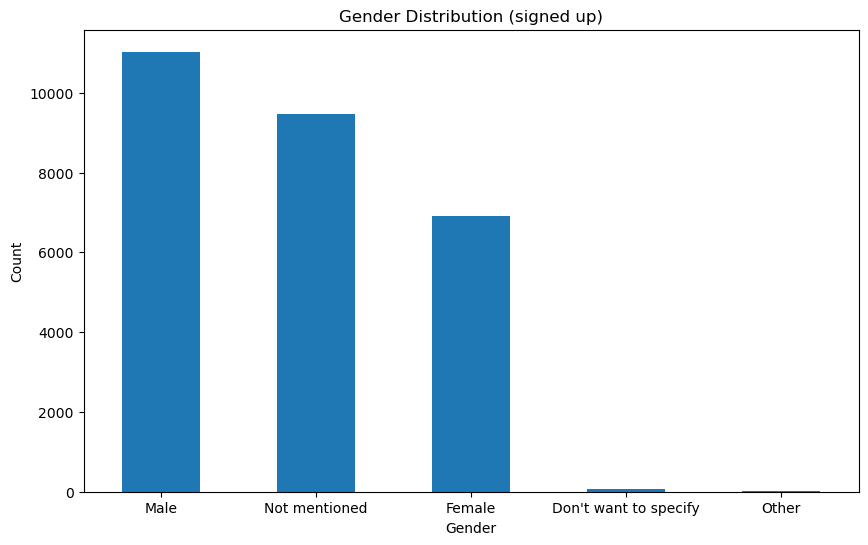

Gender Distribution Counts:
Gender
Male                     11027
Not mentioned             9473
Female                    6910
Don't want to specify       75
Other                       15
Name: count, dtype: int64


In [137]:
plt.figure(figsize=(10, 6))
gender_counts = userdata['Gender'].value_counts()
gender_counts.plot(kind='bar')

plt.title('Gender Distribution (signed up)')
plt.xlabel('Gender')
plt.ylabel('Count')
plt.xticks(rotation=0)  # Rotate x-axis labels if needed
plt.show()

# Print the counts below the plot
print("Gender Distribution Counts:")
print(gender_counts)


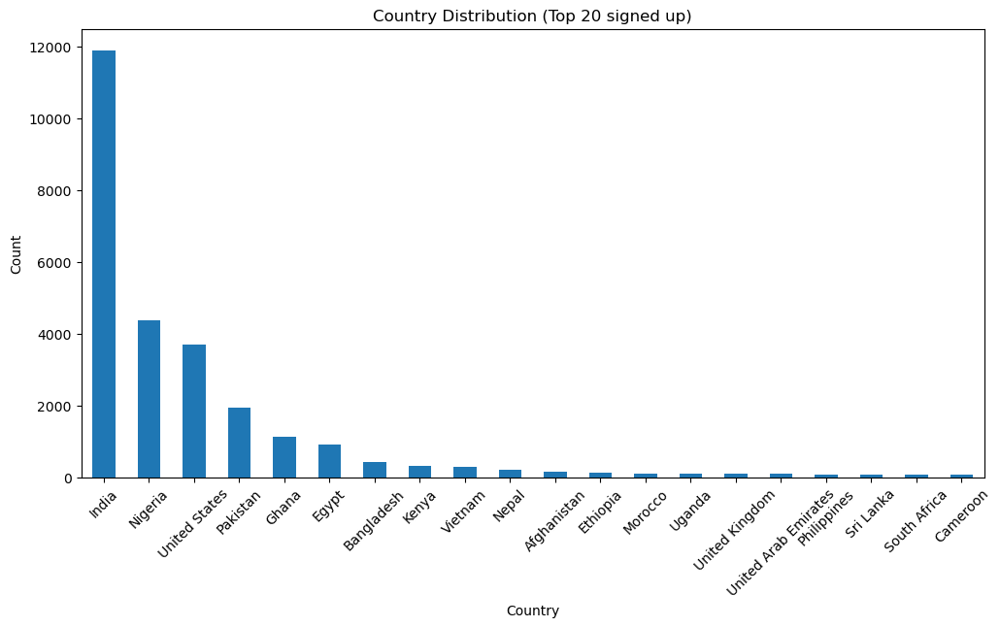

Top 20 Country Distribution Counts:
Country
India                   11893
Nigeria                  4357
United States            3691
Pakistan                 1928
Ghana                    1124
Egypt                     897
Bangladesh                422
Kenya                     302
Vietnam                   290
Nepal                     193
Afghanistan               147
Ethiopia                  123
Morocco                   107
Uganda                    101
United Kingdom             83
United Arab Emirates       83
Philippines                80
Sri Lanka                  78
South Africa               75
Cameroon                   69
Name: count, dtype: int64


In [139]:
plt.figure(figsize=(12, 6))
country_counts = userdata['Country'].value_counts().head(20)  # Get the top 20 countries
country_counts.plot(kind='bar')

plt.title('Country Distribution (Top 20 signed up)')
plt.xlabel('Country')
plt.ylabel('Count')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()

# Print the counts below the plot
print("Top 20 Country Distribution Counts:")
print(country_counts)

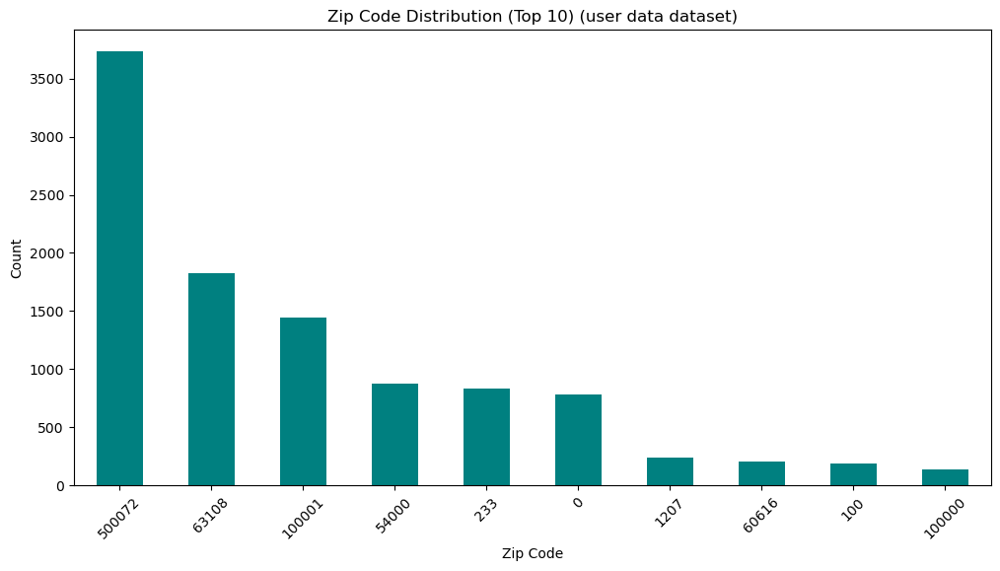

Top 20 Zip Code Distribution Counts (user data dataset):
zip
500072    3733
63108     1827
100001    1440
54000      877
233        832
0          783
1207       243
60616      206
100        185
100000     139
Name: count, dtype: int64


In [141]:
# Plotting the Zip Code Distribution
plt.figure(figsize=(12, 6))
zip_counts = userdata['zip'].value_counts().head(10)  # Get the top 20 zip codes
zip_counts.plot(kind='bar', color='teal')

plt.title('Zip Code Distribution (Top 10) (user data dataset)')
plt.xlabel('Zip Code')
plt.ylabel('Count')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()

# Print the counts below the plot
print("Top 20 Zip Code Distribution Counts (user data dataset):")
print(zip_counts)

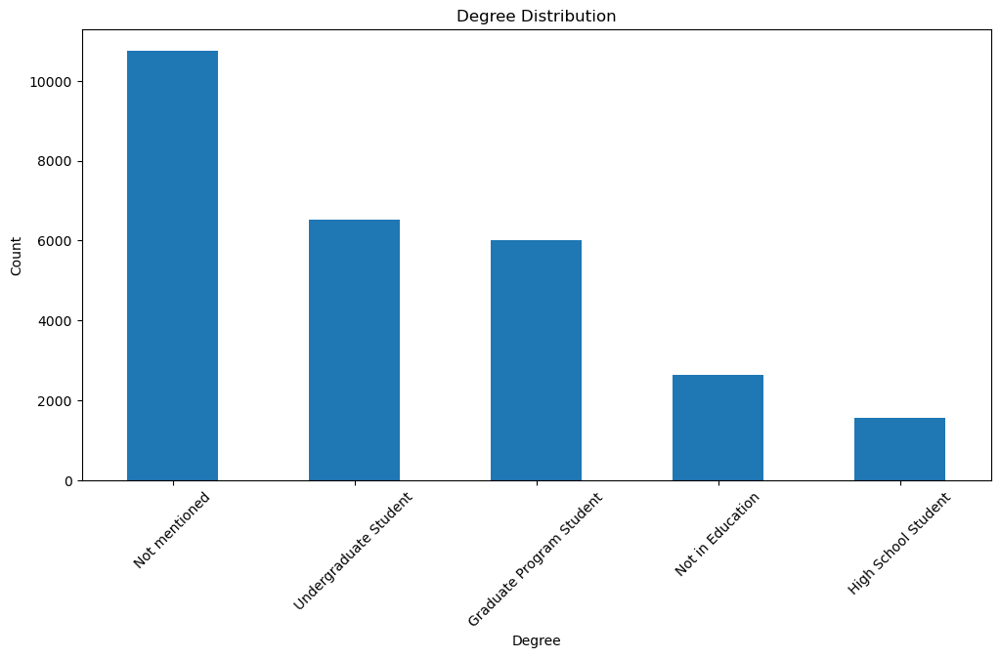

Degree Distribution Counts:
Degree
Not mentioned               10750
Undergraduate Student        6527
Graduate Program Student     6015
Not in Education             2646
High School Student          1562
Name: count, dtype: int64


In [142]:
plt.figure(figsize=(12, 6))
degree_counts = userdata['Degree'].value_counts()  # Get counts of all degrees
degree_counts.plot(kind='bar')

plt.title('Degree Distribution')
plt.xlabel('Degree')
plt.ylabel('Count')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()

# Print the counts below the plot
print("Degree Distribution Counts:")
print(degree_counts)

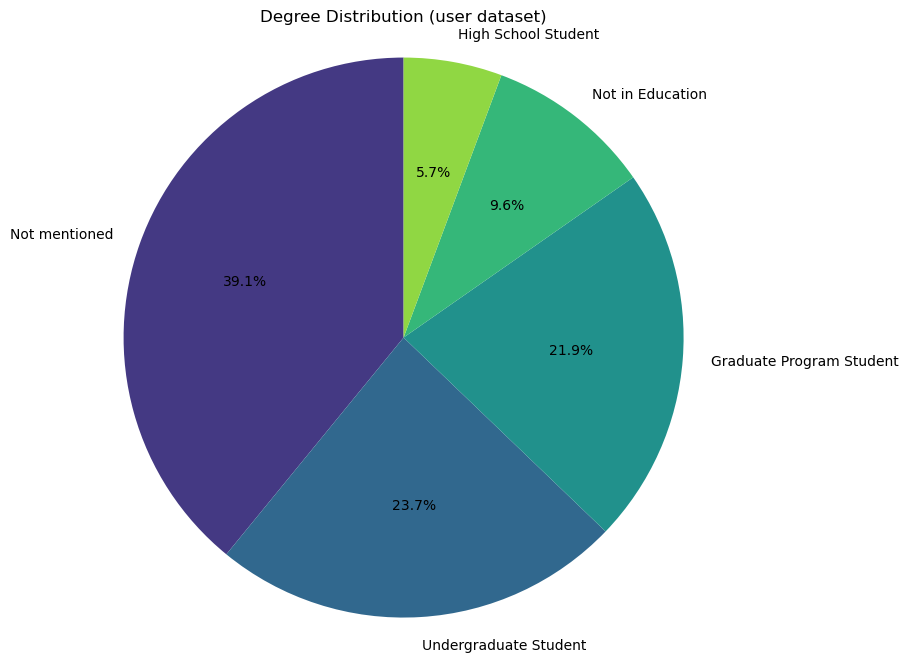

Degree Counts:
Degree
Not mentioned               10750
Undergraduate Student        6527
Graduate Program Student     6015
Not in Education             2646
High School Student          1562
Name: count, dtype: int64


In [144]:
# Degree Distribution Pie Chart
plt.figure(figsize=(10, 8))
degree_counts = userdata['Degree'].value_counts()
degree_counts.plot(kind='pie', autopct='%1.1f%%', startangle=90, colors=sns.color_palette('viridis', len(degree_counts)))
plt.title('Degree Distribution (user dataset)')
plt.ylabel('')  # Hides the y-label
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()

# Optional: Print the counts for each degree
print("Degree Counts:")
print(degree_counts)

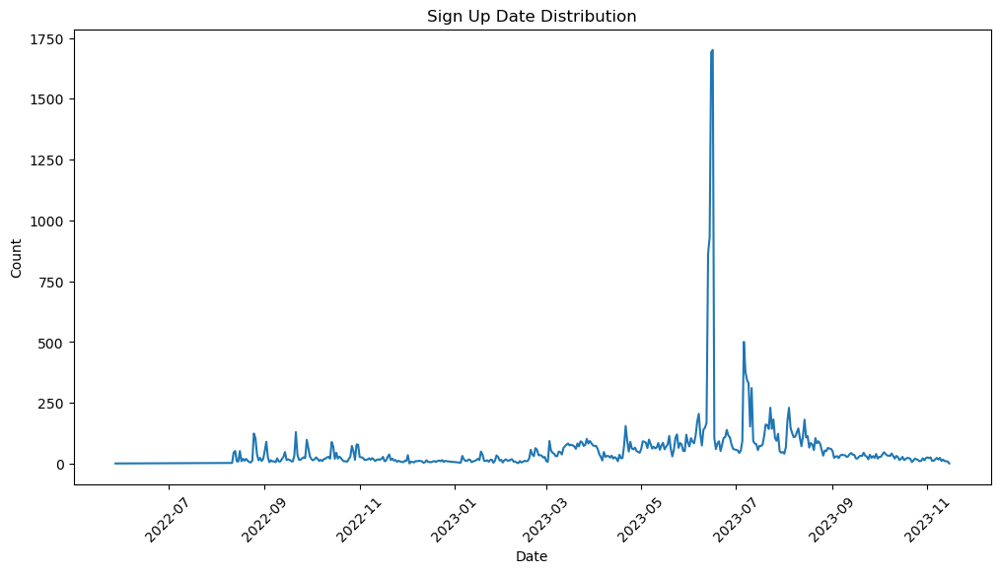

Sign Up Date Counts:
Sign Up Date
2022-05-28     1
2022-05-31     1
2022-08-10     3
2022-08-11     3
2022-08-12    46
              ..
2023-11-11    17
2023-11-12    11
2023-11-13    10
2023-11-14     9
2023-11-15     1
Name: count, Length: 457, dtype: int64


In [145]:
# Sign Up Date Analysis
# Ensure the Sign Up Date is in datetime format
userdata['Sign Up Date'] = pd.to_datetime(userdata['Sign Up Date'])

# Count the occurrences of each sign-up date and sort them
signup_counts = userdata['Sign Up Date'].dt.date.value_counts().sort_index()

# Plotting the sign-up date distribution
plt.figure(figsize=(12, 6))
signup_counts.plot(kind='line')
plt.title('Sign Up Date Distribution')
plt.xlabel('Date')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

# Print the counts below the plot
print("Sign Up Date Counts:")
print(signup_counts)


                                       PreferredSponsors         Gender  \
0      ["GlobalShala","Grant Thornton China","Saint L...           Male   
1      ["GlobalShala","Grant Thornton China","Saint L...           Male   
2      ["GlobalShala","Illinois Institute of Technolo...  Not mentioned   
3      ["GlobalShala","Grant Thornton China","Saint L...  Not mentioned   
4      ["GlobalShala","Grant Thornton China","Saint L...         Female   
...                                                  ...            ...   
27557  ["GlobalShala","Grant Thornton China","Saint L...         Female   
27558  ["GlobalShala","Saint Louis University","Illin...           Male   
27559  ["GlobalShala","Illinois Institute of Technolo...           Male   
27560  ["GlobalShala","Grant Thornton China","Saint L...           Male   
27561  ["GlobalShala","Grant Thornton China","Saint L...           Male   

             Country                 Degree Sign Up Date           city  \
0            Nigeria  Un

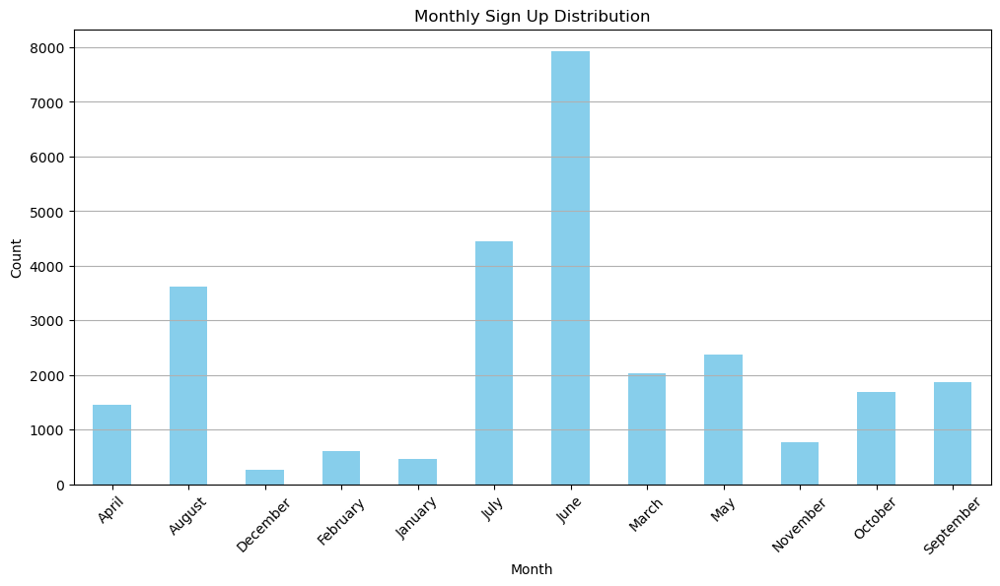

Monthly Sign Up Counts:
Month
April        1444
August       3621
December      270
February      602
January       459
July         4453
June         7933
March        2026
May          2375
November      764
October      1687
September    1866
Name: count, dtype: int64


In [147]:
userdata['Month'] = userdata['Sign Up Date'].dt.strftime('%B')  # Full month name
# Alternatively, you can use dt.month to get month numbers: userdata['Month'] = userdata['Sign Up Date'].dt.month

# Display the updated DataFrame
print(userdata)

# Optional: Count the occurrences of each month
month_counts = userdata['Month'].value_counts().sort_index()

# Plotting the monthly sign-up distribution based on the new column
plt.figure(figsize=(12, 6))
month_counts.plot(kind='bar', color='skyblue')
plt.title('Monthly Sign Up Distribution')
plt.xlabel('Month')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

# Print the counts for further reference
print("Monthly Sign Up Counts:")
print(month_counts)

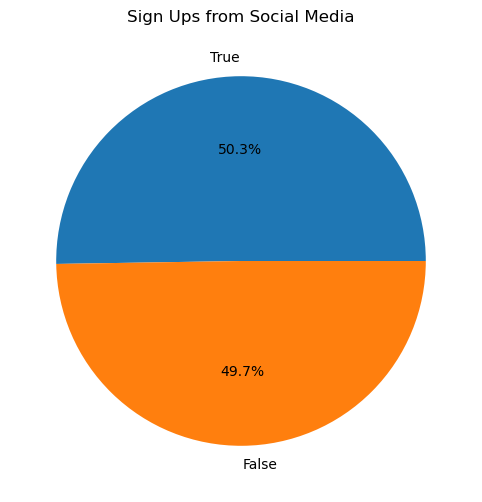

In [148]:
# Social Media Distribution
plt.figure(figsize=(8, 6))
userdata['isFromSocialMedia'].value_counts().plot(kind='pie', autopct='%1.1f%%')
plt.title('Sign Ups from Social Media')
plt.ylabel('')
plt.show()

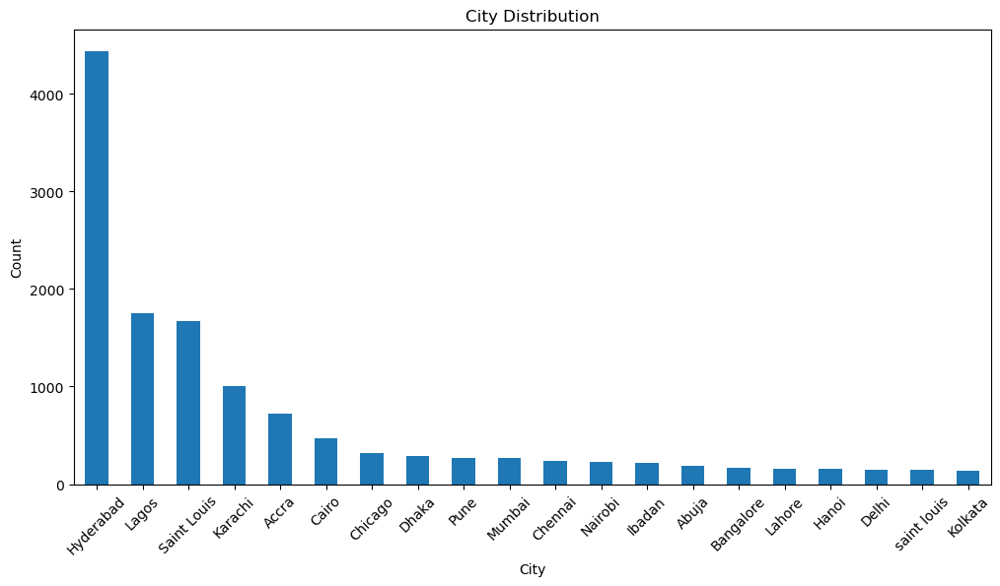

Top 20 City Counts:
city
Hyderabad      4441
Lagos          1747
Saint Louis    1667
Karachi        1002
Accra           723
Cairo           474
Chicago         318
Dhaka           292
Pune            268
Mumbai          265
Chennai         241
Nairobi         231
Ibadan          219
Abuja           191
Bangalore       168
Lahore          154
Hanoi           154
Delhi           148
saint louis     146
Kolkata         136
Name: count, dtype: int64


In [151]:
# Country Distribution
# Count the occurrences of each city and get the top 20
city_counts = userdata['city'].value_counts().head(20)

# Plotting the city distribution
plt.figure(figsize=(12, 6))
city_counts.plot(kind='bar')
plt.title('City Distribution')
plt.xlabel('City')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

# Print the counts below the plot
print("Top 20 City Counts:")
print(city_counts)


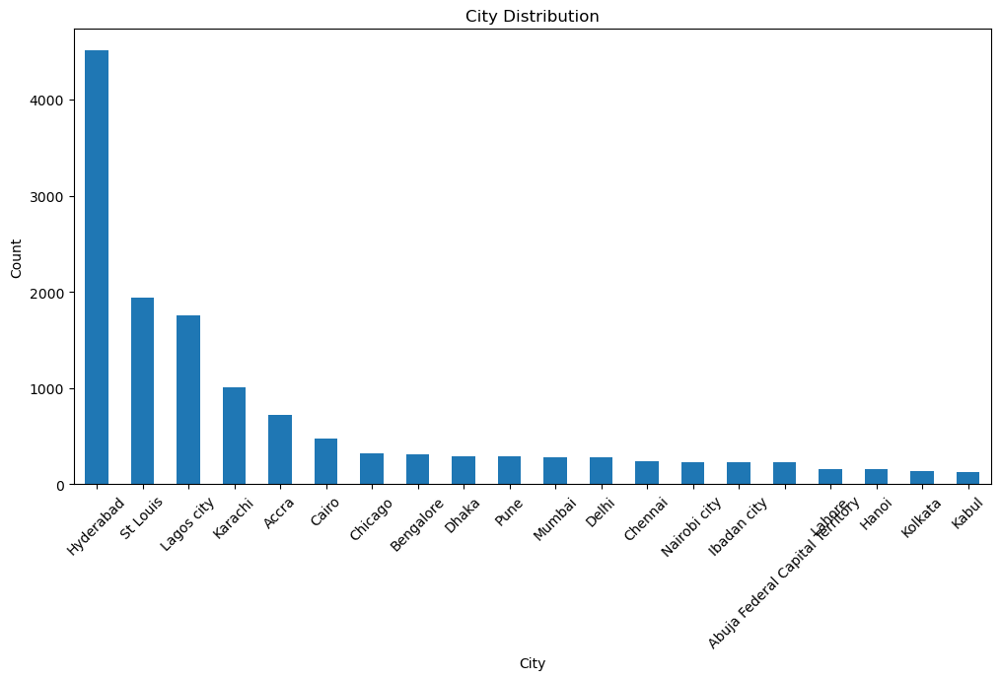

Top 20 City Counts:
city
Hyderabad                          4507
St Louis                           1940
Lagos city                         1761
Karachi                            1007
Accra                               725
Cairo                               474
Chicago                             322
Bengalore                           313
Dhaka                               296
Pune                                294
Mumbai                              284
Delhi                               277
Chennai                             243
Nairobi city                        234
Ibadan city                         227
Abuja Federal Capital Territory     226
Lahore                              157
Hanoi                               154
Kolkata                             136
Kabul                               128
Name: count, dtype: int64


In [161]:
# Country Distribution
# Count the occurrences of each city and get the top 20
city_counts = userdata['city'].value_counts().head(20)

# Plotting the city distribution
plt.figure(figsize=(12, 6))
city_counts.plot(kind='bar')
plt.title('City Distribution')
plt.xlabel('City')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

# Print the counts below the plot
print("Top 20 City Counts:")
print(city_counts)

In [162]:
userdata['city'].nunique()

4382

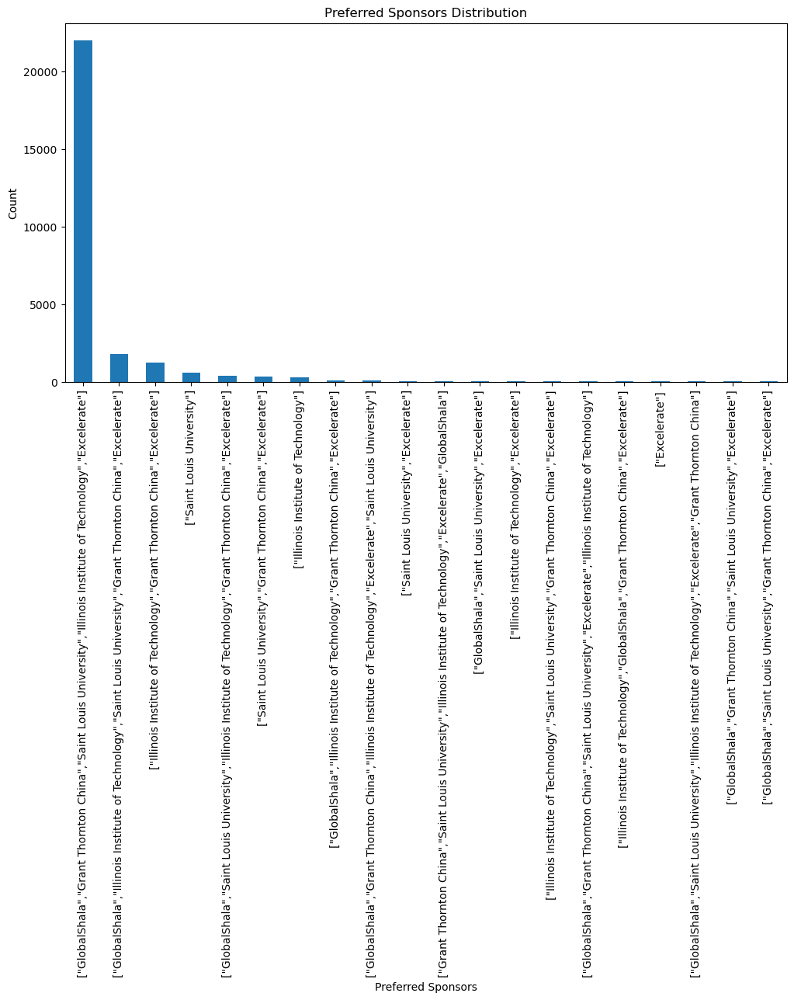

Top 20 Preferred Sponsors Counts:
PreferredSponsors
["GlobalShala","Grant Thornton China","Saint Louis University","Illinois Institute of Technology","Excelerate"]    22011
["GlobalShala","Illinois Institute of Technology","Saint Louis University","Grant Thornton China","Excelerate"]     1807
["Illinois Institute of Technology","Grant Thornton China","Excelerate"]                                            1230
["Saint Louis University"]                                                                                           607
["GlobalShala","Saint Louis University","Illinois Institute of Technology","Grant Thornton China","Excelerate"]      389
["Saint Louis University","Grant Thornton China","Excelerate"]                                                       321
["Illinois Institute of Technology"]                                                                                 297
["GlobalShala","Illinois Institute of Technology","Grant Thornton China","Excelerate"]               

In [165]:
# Count the occurrences of each preferred sponsor and get the top 20
preferred_sponsor_counts = userdata['PreferredSponsors'].value_counts().head(20)

# Plotting the preferred sponsors distribution
plt.figure(figsize=(12, 6))
preferred_sponsor_counts.plot(kind='bar')
plt.title('Preferred Sponsors Distribution')
plt.xlabel('Preferred Sponsors')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()

# Print the counts below the plot
print("Top 20 Preferred Sponsors Counts:")
print(preferred_sponsor_counts)


In [16]:
# Convert the column values from strings to actual lists
df_cleaned=userdata
df_cleaned['PreferredSponsors'] = userdata['PreferredSponsors'].apply(lambda x: eval(x) if isinstance(x, str) else [])

# Flatten the list of sponsors
all_sponsors = df_cleaned['PreferredSponsors'].explode()

# Count the occurrences of each sponsor
top_20_sponsors = all_sponsors.value_counts().head(20)

# Display the all sponsors
print(top_20_sponsors)


PreferredSponsors
Excelerate                          26571
Illinois Institute of Technology    26321
Grant Thornton China                26320
Saint Louis University              25709
GlobalShala                         24817
Name: count, dtype: int64


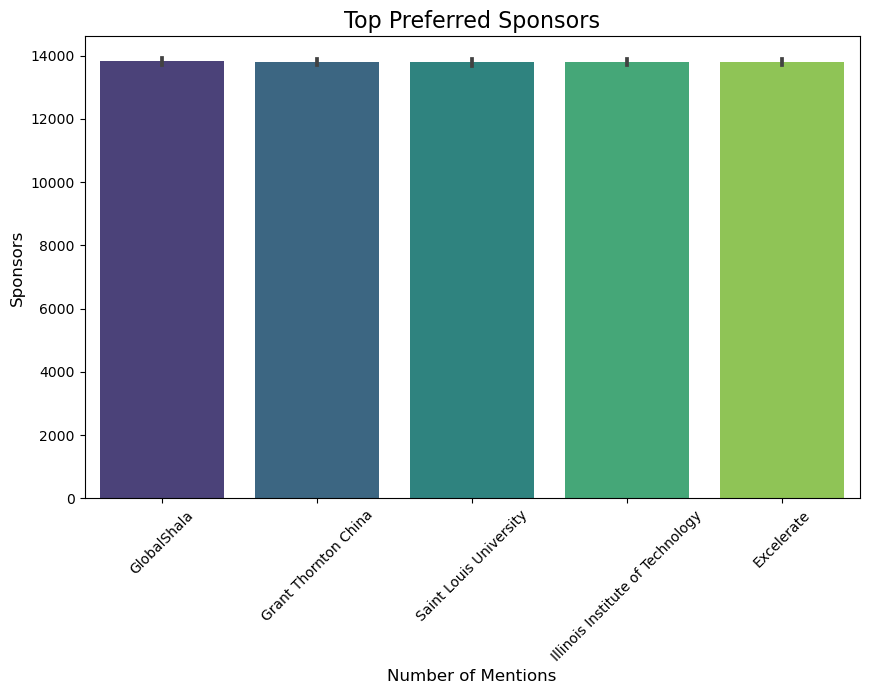

In [168]:
# Plotting the top 20 sponsors
plt.figure(figsize=(10, 6))
sns.barplot(x=all_sponsors.values, y=all_sponsors.index, palette='viridis')
plt.title('Top Preferred Sponsors', fontsize=16)
plt.xlabel('Number of Mentions', fontsize=12)
plt.ylabel('Sponsors', fontsize=12)
plt.xticks(rotation=45)
plt.show()

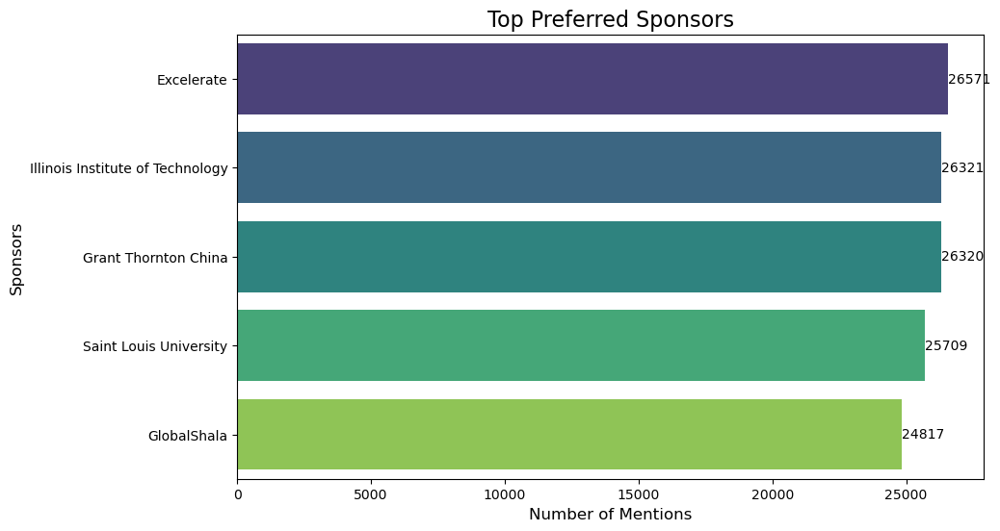

In [169]:
# Plotting the top 20 sponsors
plt.figure(figsize=(10, 6))
sns_bar = sns.barplot(x=top_20_sponsors.values, y=top_20_sponsors.index, palette='viridis')

# Add counts on top of the bars
for index, value in enumerate(top_20_sponsors.values):
    plt.text(value + 1, index, str(value), va='center')

# Set the labels and title
plt.title('Top Preferred Sponsors', fontsize=16)
plt.xlabel('Number of Mentions', fontsize=12)
plt.ylabel('Sponsors', fontsize=12)

# Rotate x-axis labels for better readability
#plt.xticks(rotation=45)

# Show the plot
plt.show()

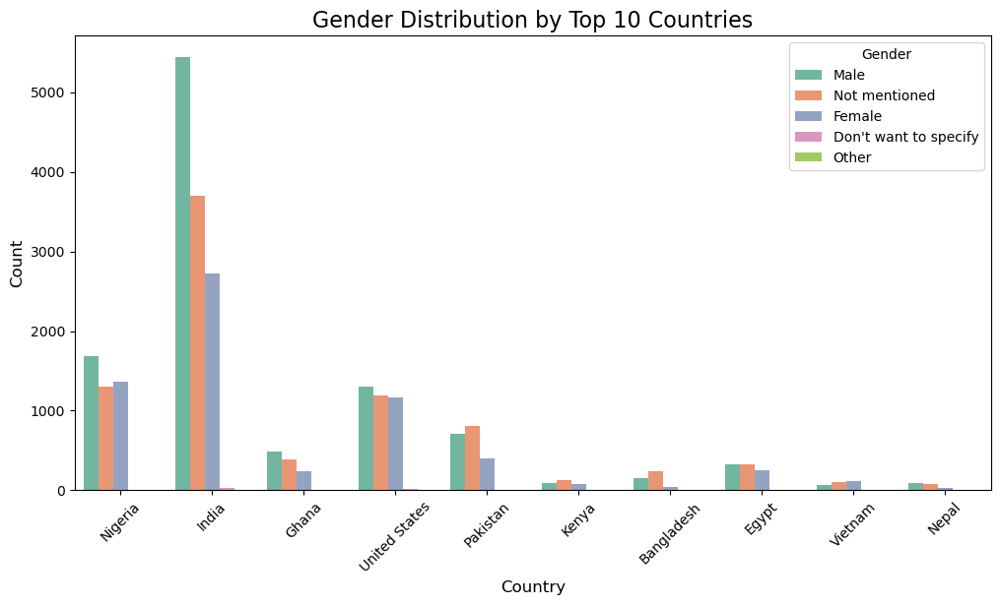

Country
India            11893
Nigeria           4357
United States     3691
Pakistan          1928
Ghana             1124
Egypt              897
Bangladesh         422
Kenya              302
Vietnam            290
Nepal              193
Name: count, dtype: int64


In [171]:
# Find the top 10 countries by total count
top_10_countries = userdata['Country'].value_counts().head(10).index

# Filter the dataframe for only the top 10 countries
df_top_10 = userdata[userdata['Country'].isin(top_10_countries)]

# Plot Gender Distribution by Country (for top 10 countries)
plt.figure(figsize=(12, 6))
sns.countplot(x='Country', hue='Gender', data=df_top_10, palette='Set2')
plt.title('Gender Distribution by Top 10 Countries', fontsize=16)
plt.xlabel('Country', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45)
plt.legend(title='Gender')
plt.show()

print(df_top_10['Country'].value_counts())

AttributeError: 'numpy.bool_' object has no attribute 'startswith'

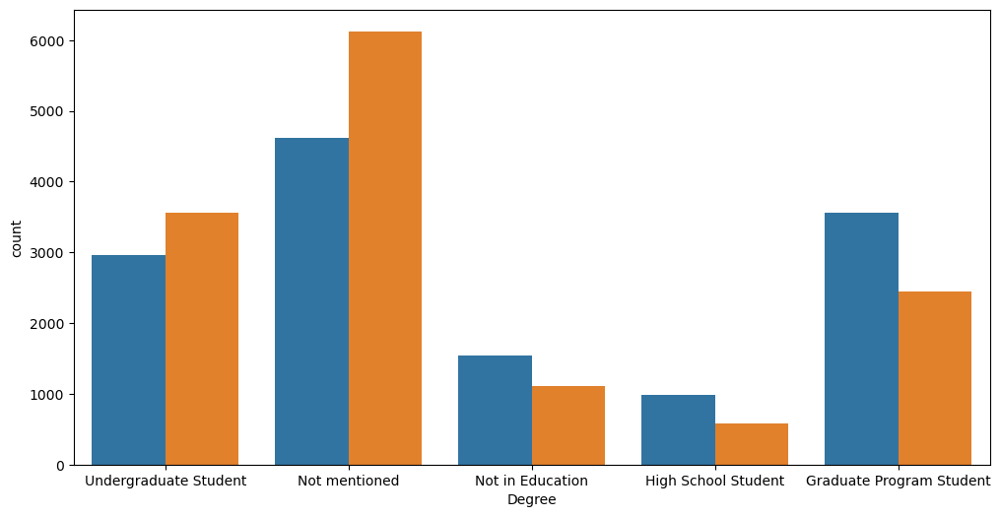

In [173]:
# Degree vs isFromSocialMedia
plt.figure(figsize=(12, 6))
sns.countplot(x='Degree', hue='isFromSocialMedia', data=userdata)
plt.title('Degree Distribution by Social Media Sign Up')
plt.xlabel('Degree')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='From Social Media')
plt.show()

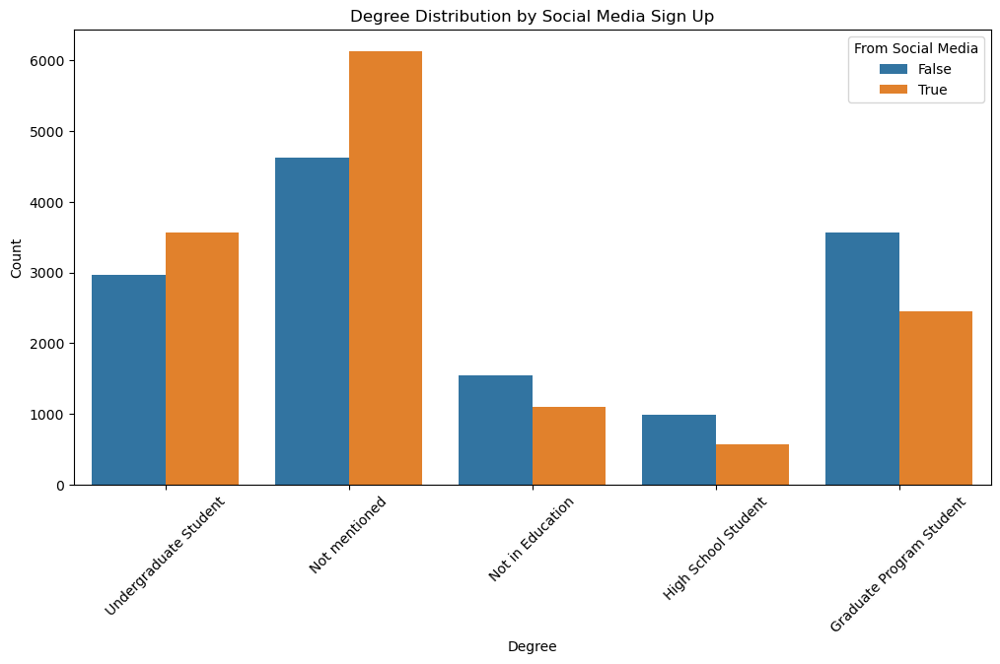

In [174]:
# Convert isFromSocialMedia to string if necessary
userdata['isFromSocialMedia'] = userdata['isFromSocialMedia'].astype(str)

# Degree vs isFromSocialMedia count plot
plt.figure(figsize=(12, 6))
sns.countplot(x='Degree', hue='isFromSocialMedia', data=userdata)
plt.title('Degree Distribution by Social Media Sign Up')
plt.xlabel('Degree')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='From Social Media')  # This should add the legend correctly
plt.show()


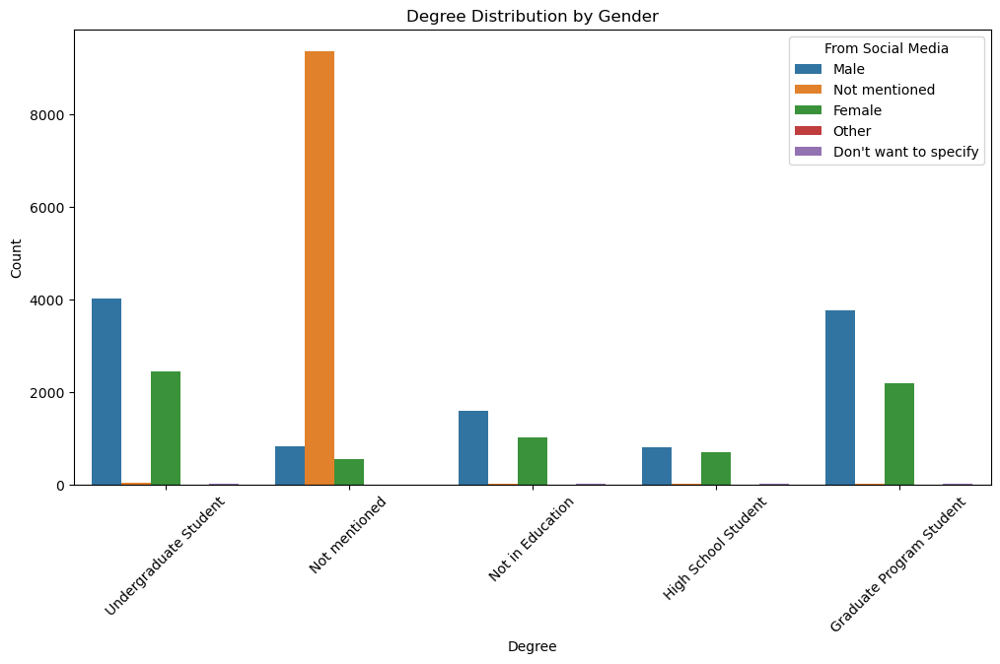

In [176]:
# Degree vs Gender
plt.figure(figsize=(12, 6))
sns.countplot(x='Degree', hue='Gender', data=userdata)
plt.title('Degree Distribution by Gender')
plt.xlabel('Degree')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='From Social Media')
plt.show()

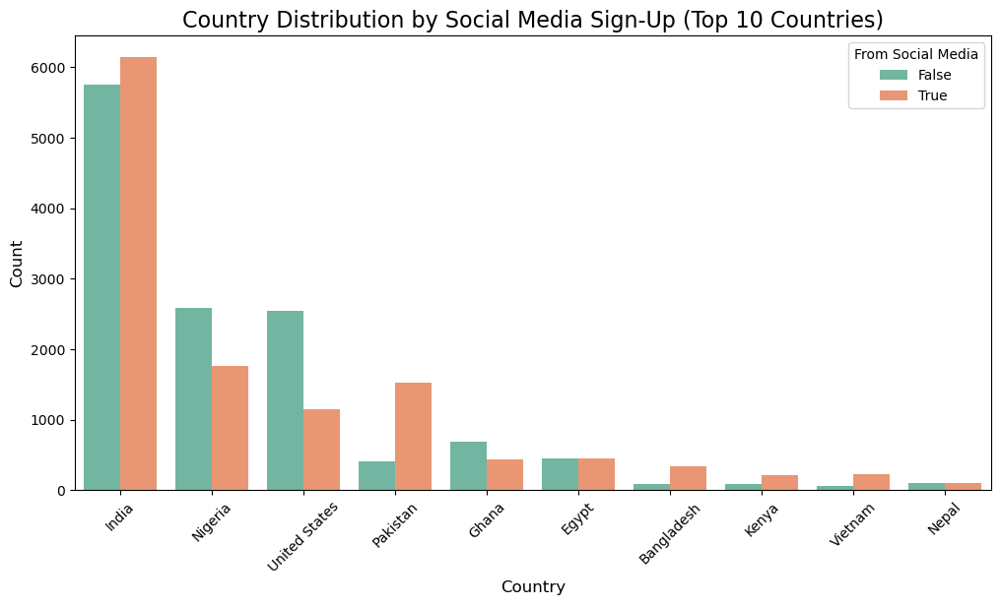

In [177]:
# Country vs isFromSocialMedia
# Find the top 10 countries by total count
top_10_countries = userdata['Country'].value_counts().head(10)

# Filter the dataframe for only the top 10 countries
df_top_10 = userdata[userdata['Country'].isin(top_10_countries.index)]

# Plot Country Distribution by Social Media Sign-Up (for top 10 countries)
plt.figure(figsize=(12, 6))
sns.countplot(x='Country', hue='isFromSocialMedia', data=df_top_10, palette='Set2', 
              order=top_10_countries.index)  # Ensure top 10 countries are ordered by count
plt.title('Country Distribution by Social Media Sign-Up (Top 10 Countries)', fontsize=16)
plt.xlabel('Country', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45)
plt.legend(title='From Social Media')
plt.show()

<Figure size 1000x600 with 0 Axes>

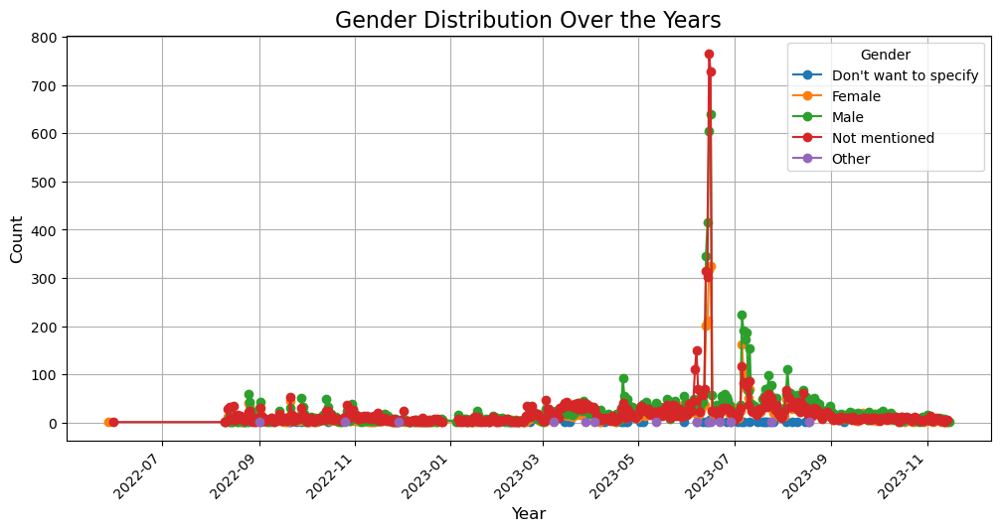

In [178]:
# Ensure the date column is in datetime format
df_cleaned['Sign Up Date'] = pd.to_datetime(df_cleaned['Sign Up Date'], errors='coerce')

# Extract the year from the date column
df_cleaned['Year'] = df_cleaned['Sign Up Date'].dt.year

# Group by year and gender and count occurrences
gender_over_years = df_cleaned.groupby(['Sign Up Date', 'Gender']).size().unstack()

# Plot the line plot
plt.figure(figsize=(10, 6))
gender_over_years.plot(kind='line', marker='o', figsize=(12, 6))

# Add labels and title
plt.title('Gender Distribution Over the Years', fontsize=16)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.grid(True)
plt.xticks(rotation=45)

# Display the plot
plt.show()


C:\Users\vamsh\AppData\Local\Temp\ipykernel_17620\3018045872.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top_10['Sign Up Date'] = pd.to_datetime(df_top_10['Sign Up Date'], errors='coerce')
C:\Users\vamsh\AppData\Local\Temp\ipykernel_17620\3018045872.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top_10['Year'] = df_top_10['Sign Up Date'].dt.year


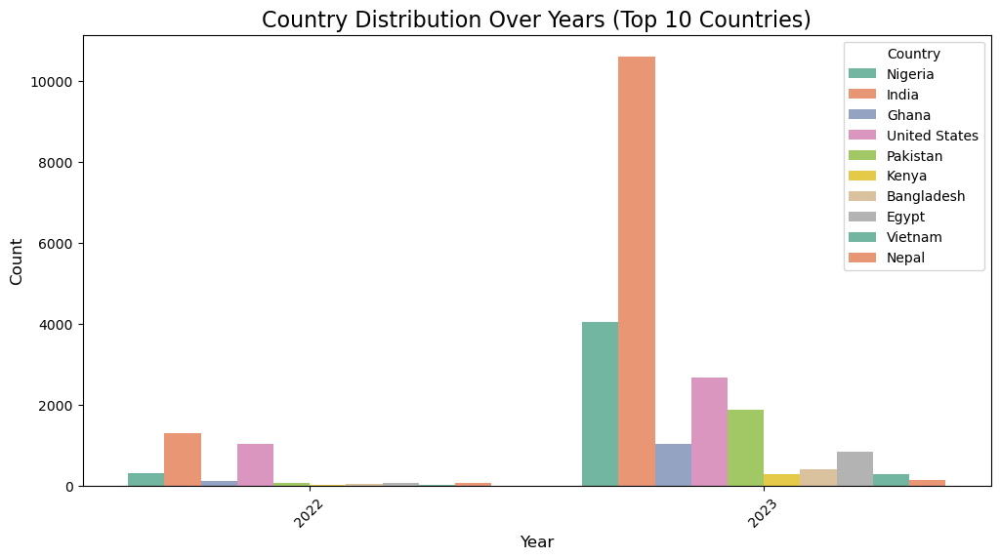

In [179]:

# Identify the top 10 countries by frequency
top_10_countries = df_cleaned['Country'].value_counts().head(10).index

# Filter the dataframe to only include rows from the top 10 countries
df_top_10 = df_cleaned[df_cleaned['Country'].isin(top_10_countries)]

# Convert 'Sign Up Date' to datetime if not already done
df_top_10['Sign Up Date'] = pd.to_datetime(df_top_10['Sign Up Date'], errors='coerce')

# Extract the year from the 'Sign Up Date' column
df_top_10['Year'] = df_top_10['Sign Up Date'].dt.year

# Create a countplot for the top 10 countries by year
plt.figure(figsize=(12, 6))
sns.countplot(x='Year', hue='Country', data=df_top_10, palette='Set2')
plt.title('Country Distribution Over Years (Top 10 Countries)', fontsize=16)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45)
plt.legend(title='Country')
plt.show()


C:\Users\vamsh\AppData\Local\Temp\ipykernel_17620\781269395.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top_10['Sign Up Date'] = pd.to_datetime(df_top_10['Sign Up Date'], errors='coerce')
C:\Users\vamsh\AppData\Local\Temp\ipykernel_17620\781269395.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_top_10['Year'] = df_top_10['Sign Up Date'].dt.year


AttributeError: 'numpy.int32' object has no attribute 'startswith'

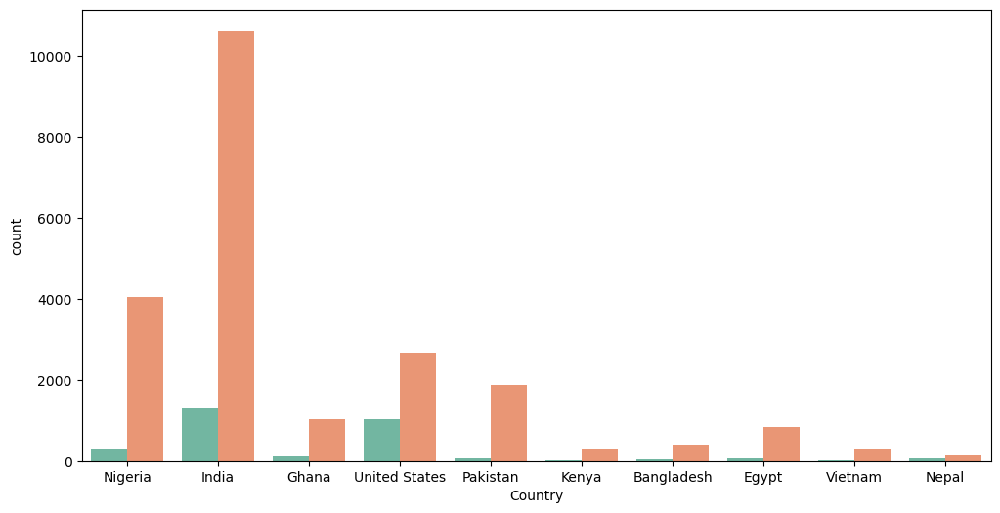

In [180]:

# Identify the top 10 countries by frequency
top_10_countries = df_cleaned['Country'].value_counts().head(10).index

# Filter the dataframe to only include rows from the top 10 countries
df_top_10 = df_cleaned[df_cleaned['Country'].isin(top_10_countries)]

# Convert 'Sign Up Date' to datetime if not already done
df_top_10['Sign Up Date'] = pd.to_datetime(df_top_10['Sign Up Date'], errors='coerce')

# Extract the year from the 'Sign Up Date' column
df_top_10['Year'] = df_top_10['Sign Up Date'].dt.year

# Create a countplot for the top 10 countries by year
plt.figure(figsize=(12, 6))
sns.countplot(x='Country', hue='Year', data=df_top_10, palette='Set2')
plt.title('Country Distribution Over Years (Top 10 Countries)', fontsize=16)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45)
plt.legend(title='Country')
plt.show()


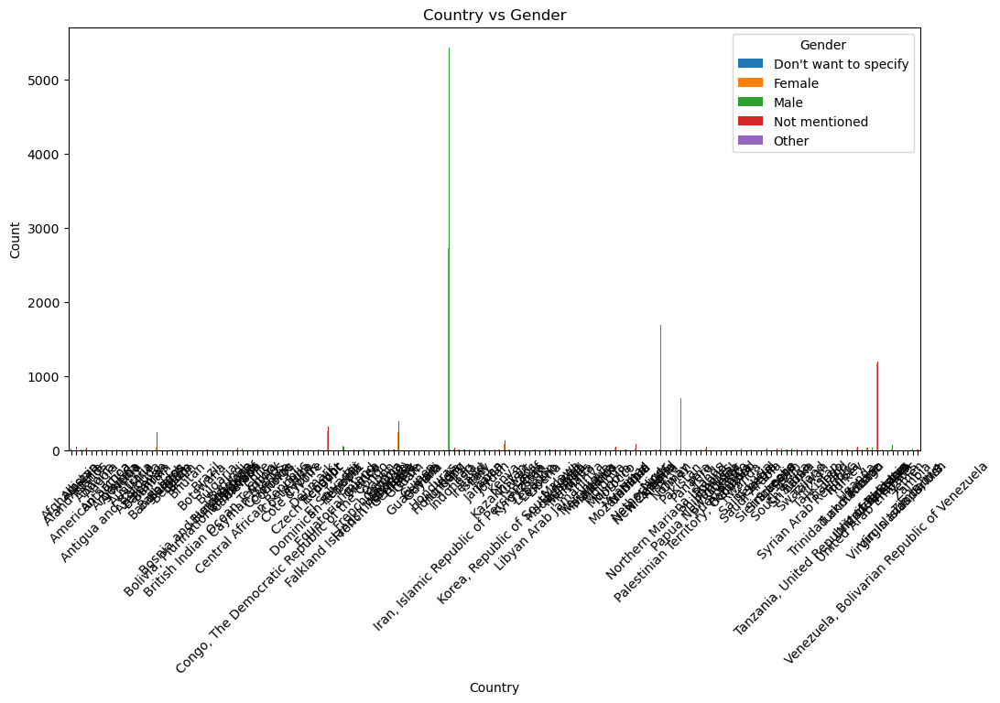

In [181]:
# Crosstab for categorical variables
crosstab_result = pd.crosstab(df_cleaned['Country'], df_cleaned['Gender'])

# Plot grouped bar plot
crosstab_result.plot(kind='bar', stacked=False, figsize=(12, 6))
plt.title('Country vs Gender')
plt.xlabel('Country')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()


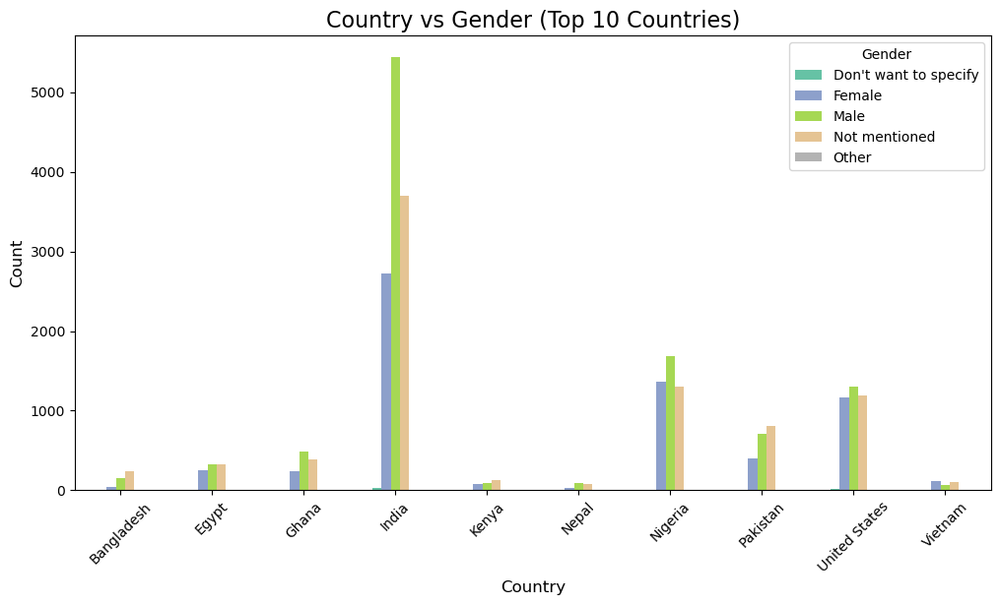

In [182]:
import pandas as pd
import matplotlib.pyplot as plt

# Find the top 10 countries by frequency
top_10_countries = df_cleaned['Country'].value_counts().head(10).index

# Create a crosstab for only the top 10 countries
crosstab_result = pd.crosstab(df_cleaned[df_cleaned['Country'].isin(top_10_countries)]['Country'],
                              df_cleaned['Gender'])

# Plot grouped bar plot
crosstab_result.plot(kind='bar', stacked=False, figsize=(12, 6), colormap='Set2')
plt.title('Country vs Gender (Top 10 Countries)', fontsize=16)
plt.xlabel('Country', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45)
plt.show()


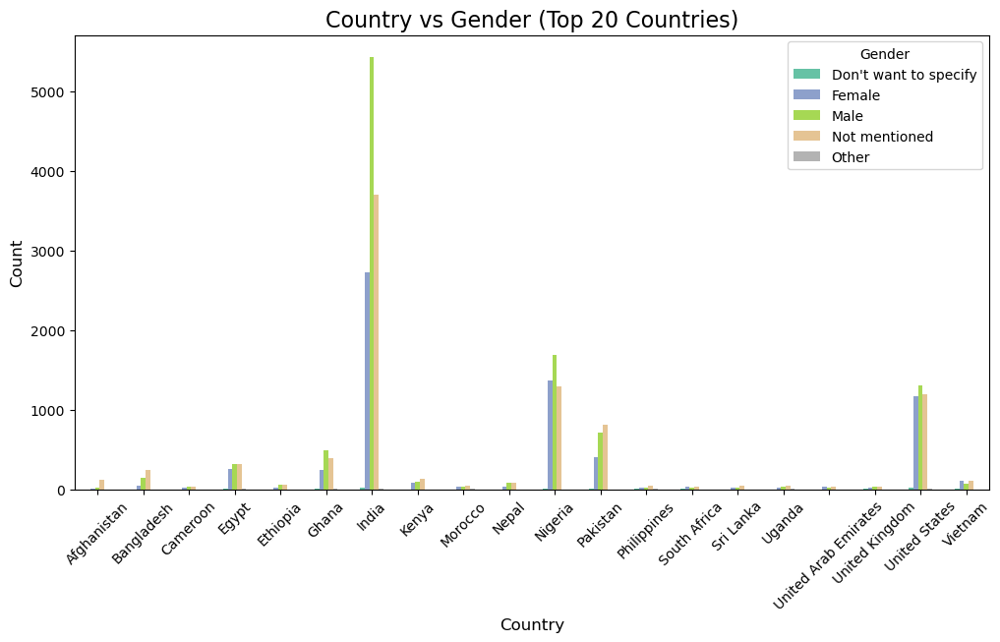

In [183]:
# Find the top 20 countries by frequency
top_10_countries = df_cleaned['Country'].value_counts().head(20).index

# Create a crosstab for only the top 10 countries
crosstab_result = pd.crosstab(df_cleaned[df_cleaned['Country'].isin(top_10_countries)]['Country'],
                              df_cleaned['Gender'])

# Plot grouped bar plot
crosstab_result.plot(kind='bar', stacked=False, figsize=(12, 6), colormap='Set2')
plt.title('Country vs Gender (Top 20 Countries)', fontsize=16)
plt.xlabel('Country', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45)
plt.show()

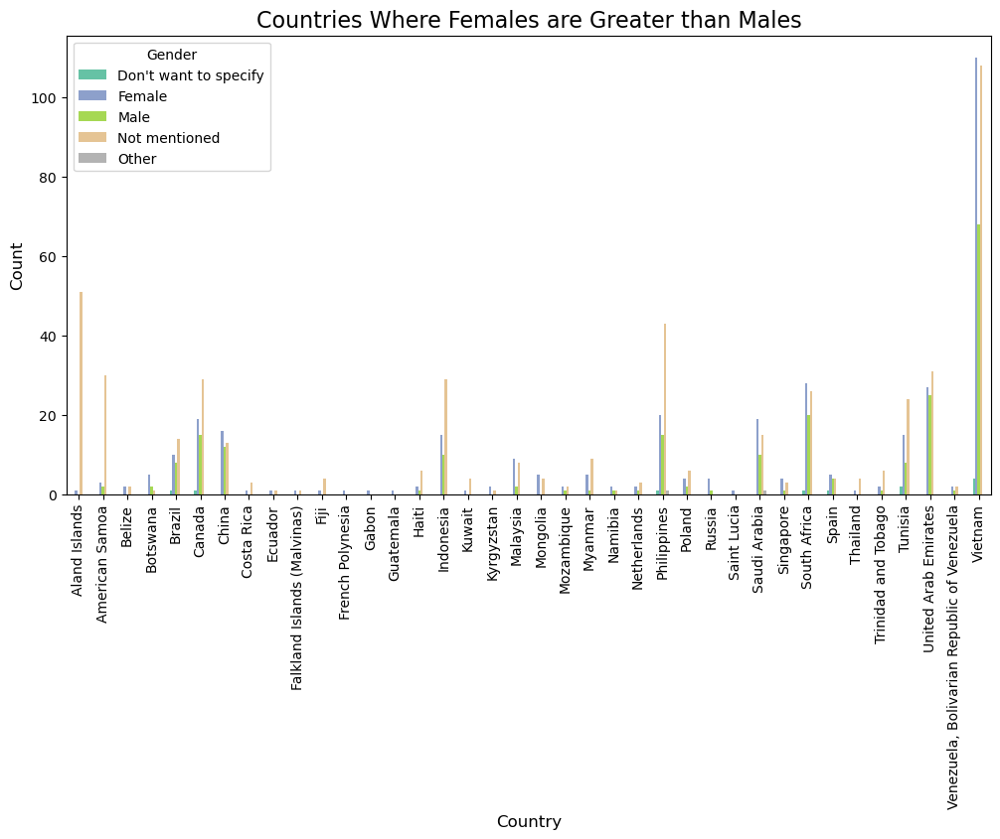

In [184]:
# Create a crosstab for Country vs Gender
crosstab_result = pd.crosstab(df_cleaned['Country'], df_cleaned['Gender'])

# Filter the crosstab to only include rows where females are greater than males
filtered_crosstab = crosstab_result[crosstab_result['Female'] > crosstab_result['Male']]

# Plot grouped bar plot for filtered data
filtered_crosstab.plot(kind='bar', stacked=False, figsize=(12, 6), colormap='Set2')
plt.title('Countries Where Females are Greater than Males', fontsize=16)
plt.xlabel('Country', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=90)
plt.show()


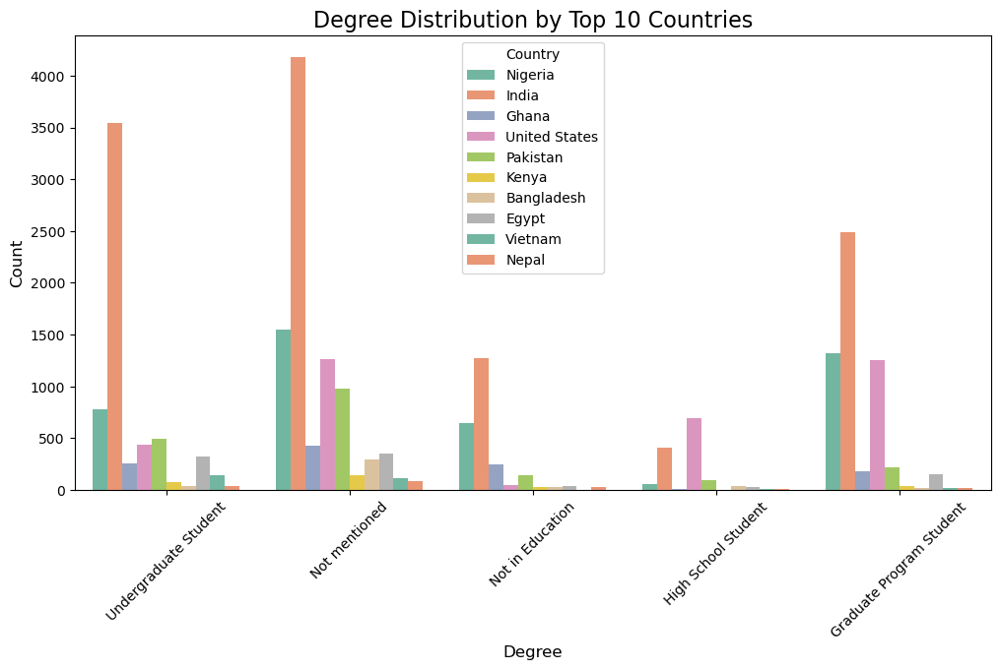

In [185]:
# Find the top 10 countries by frequency
top_10_countries = df_cleaned['Country'].value_counts().head(10).index

# Filter the dataframe to only include rows from the top 10 countries
df_top_10 = df_cleaned[df_cleaned['Country'].isin(top_10_countries)]

# Create a countplot for Degree distribution by top 10 countries
plt.figure(figsize=(12, 6))
sns.countplot(x='Degree', hue='Country', data=df_top_10, palette='Set2')
plt.title('Degree Distribution by Top 10 Countries', fontsize=16)
plt.xlabel('Degree', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45)
plt.legend(title='Country')
plt.show()

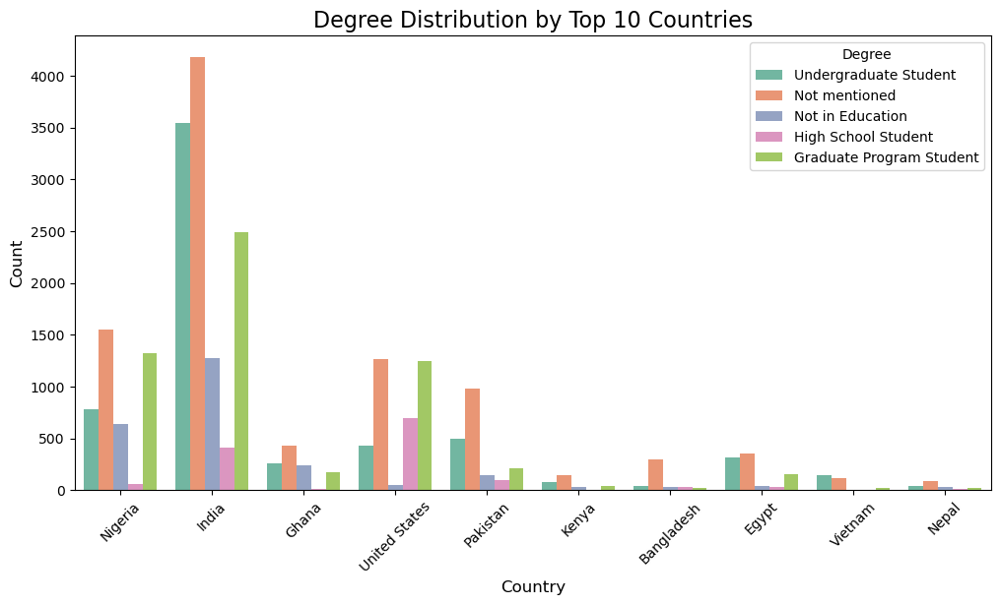

In [186]:
# Find the top 10 countries by frequency
top_10_countries = df_cleaned['Country'].value_counts().head(10).index

# Filter the dataframe to only include rows from the top 10 countries
df_top_10 = df_cleaned[df_cleaned['Country'].isin(top_10_countries)]

# Create a countplot for Degree distribution by top 10 countries
plt.figure(figsize=(12, 6))
sns.countplot(x='Country', hue='Degree', data=df_top_10, palette='Set2')
plt.title('Degree Distribution by Top 10 Countries', fontsize=16)
plt.xlabel('Country', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45)
plt.legend(title='Degree')
plt.show()


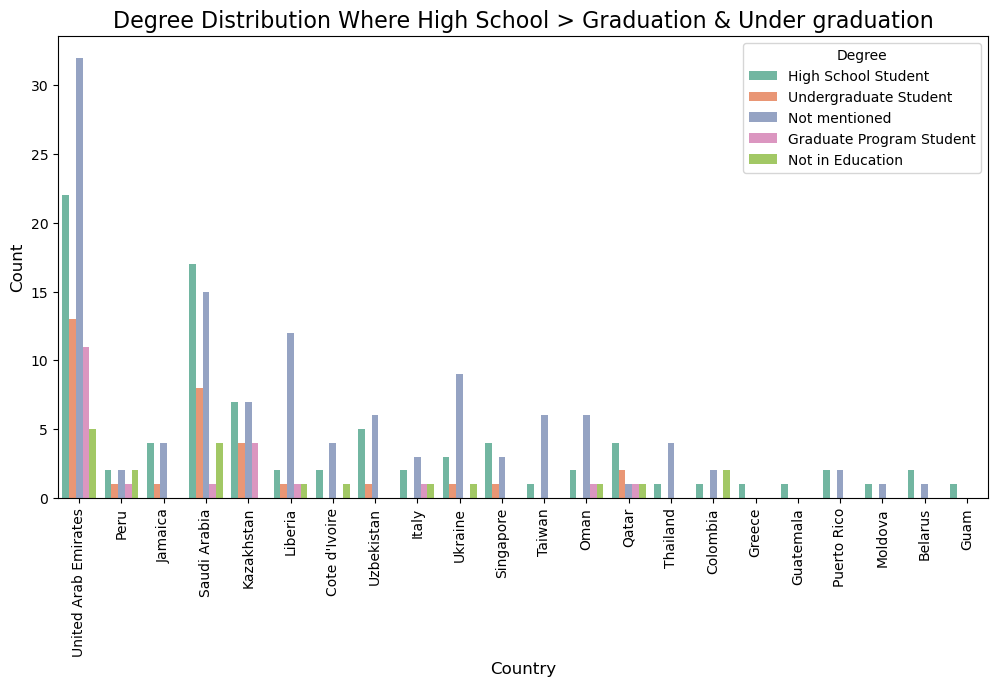

In [187]:

# Create a crosstab for Degree distribution by Country
crosstab_result = pd.crosstab(df_cleaned['Country'], df_cleaned['Degree'])

# Filter for countries where High School count is greater than Graduation/Undergraduation count
filtered_crosstab = crosstab_result[(crosstab_result['High School Student'] > crosstab_result['Graduate Program Student']) &
(crosstab_result['High School Student'] > crosstab_result['Undergraduate Student'])]

# Extract the countries that meet the condition
filtered_countries = filtered_crosstab.index

# Filter the original dataframe to include only these countries
df_filtered = df_cleaned[df_cleaned['Country'].isin(filtered_countries)]

# Create a countplot for Degree distribution by filtered countries
plt.figure(figsize=(12, 6))
sns.countplot(x='Country', hue='Degree', data=df_filtered, palette='Set2')
plt.title('Degree Distribution Where High School > Graduation & Under graduation', fontsize=16)
plt.xlabel('Country', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=90)
plt.legend(title='Degree')
plt.show()


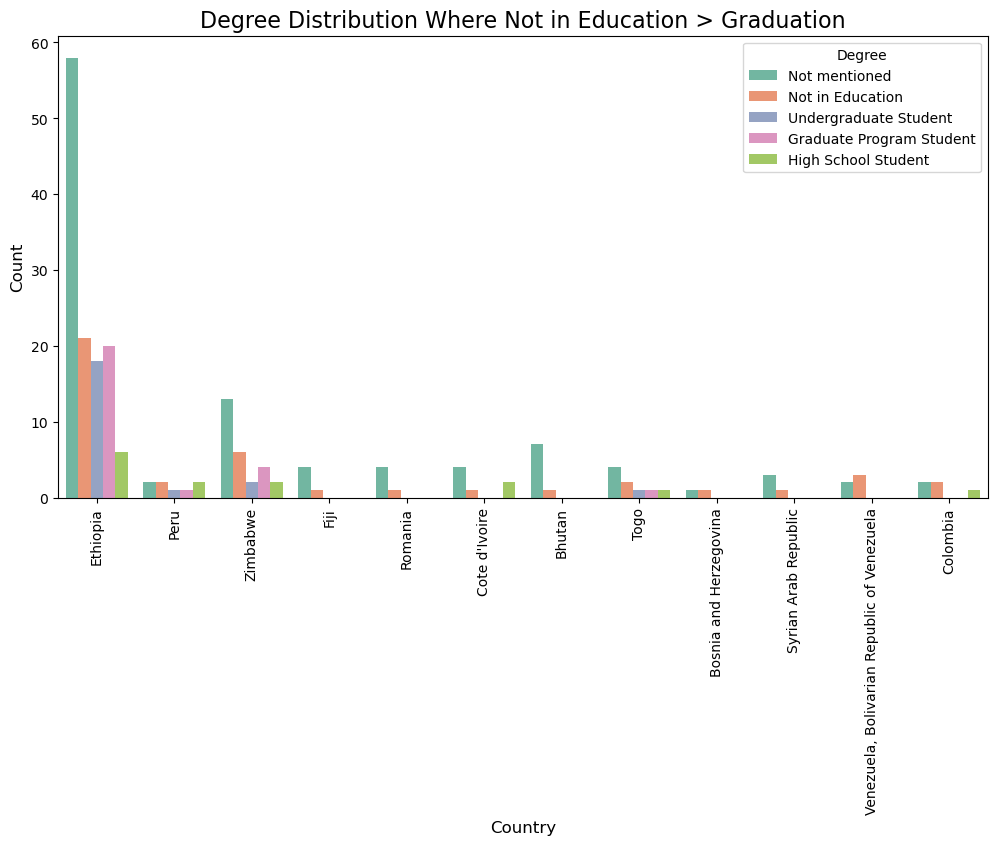

In [188]:

# Create a crosstab for Degree distribution by Country
crosstab_result = pd.crosstab(df_cleaned['Country'], df_cleaned['Degree'])

# Filter for countries where Not in Education count is greater than Graduation/Undergraduation count
filtered_crosstab = crosstab_result[(crosstab_result['Not in Education'] > crosstab_result['Graduate Program Student']) & (crosstab_result['Not in Education'] > crosstab_result['Undergraduate Student'])]

# Extract the countries that meet the condition
filtered_countries = filtered_crosstab.index

# Filter the original dataframe to include only these countries
df_filtered = df_cleaned[df_cleaned['Country'].isin(filtered_countries)]

# Create a countplot for Degree distribution by filtered countries
plt.figure(figsize=(12, 6))
sns.countplot(x='Country', hue='Degree', data=df_filtered, palette='Set2')
plt.title('Degree Distribution Where Not in Education > Graduation', fontsize=16)
plt.xlabel('Country', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=90)
plt.legend(title='Degree')
plt.show()


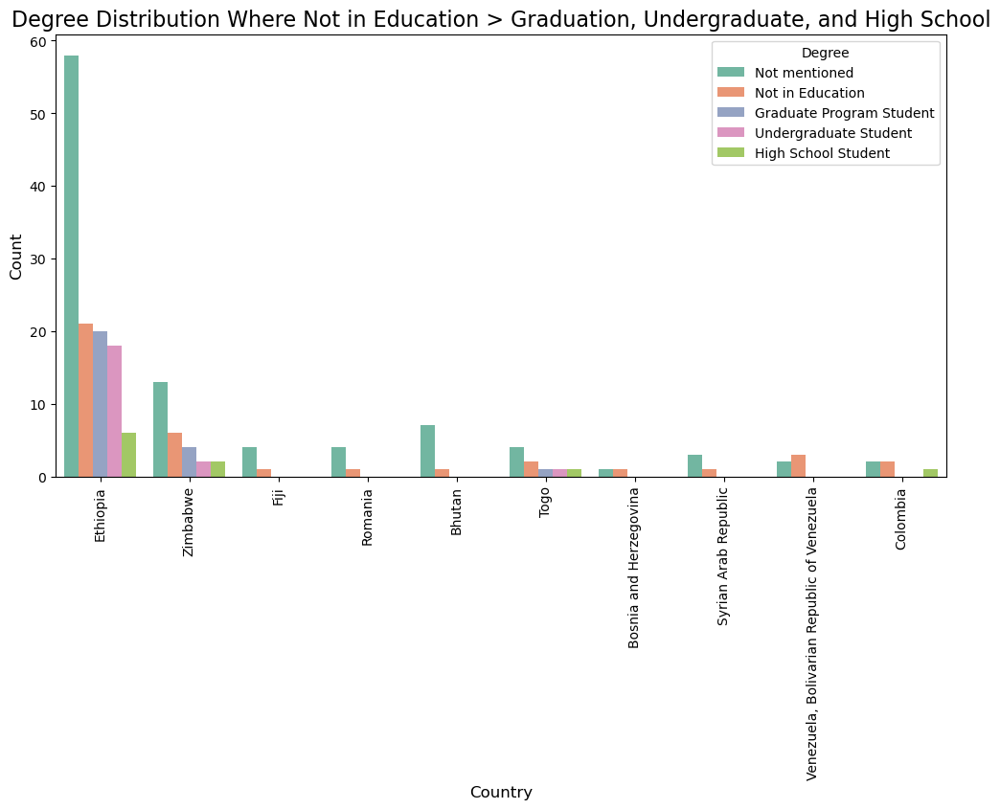

In [189]:
# Create a crosstab for Degree distribution by Country
crosstab_result = pd.crosstab(df_cleaned['Country'], df_cleaned['Degree'])

# Filter for countries where Not in Education count is greater than Graduation, Undergraduate, and High School counts
filtered_crosstab = crosstab_result[
    (crosstab_result['Not in Education'] > crosstab_result['Graduate Program Student']) & 
    (crosstab_result['Not in Education'] > crosstab_result['Undergraduate Student']) & 
    (crosstab_result['Not in Education'] > crosstab_result['High School Student'])
]

# Extract the countries that meet the condition
filtered_countries = filtered_crosstab.index

# Filter the original dataframe to include only these countries
df_filtered = df_cleaned[df_cleaned['Country'].isin(filtered_countries)]

# Create a countplot for Degree distribution by filtered countries
plt.figure(figsize=(12, 6))
sns.countplot(x='Country', hue='Degree', data=df_filtered, palette='Set2')
plt.title('Degree Distribution Where Not in Education > Graduation, Undergraduate, and High School', fontsize=16)
plt.xlabel('Country', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=90)
plt.legend(title='Degree')
plt.show()

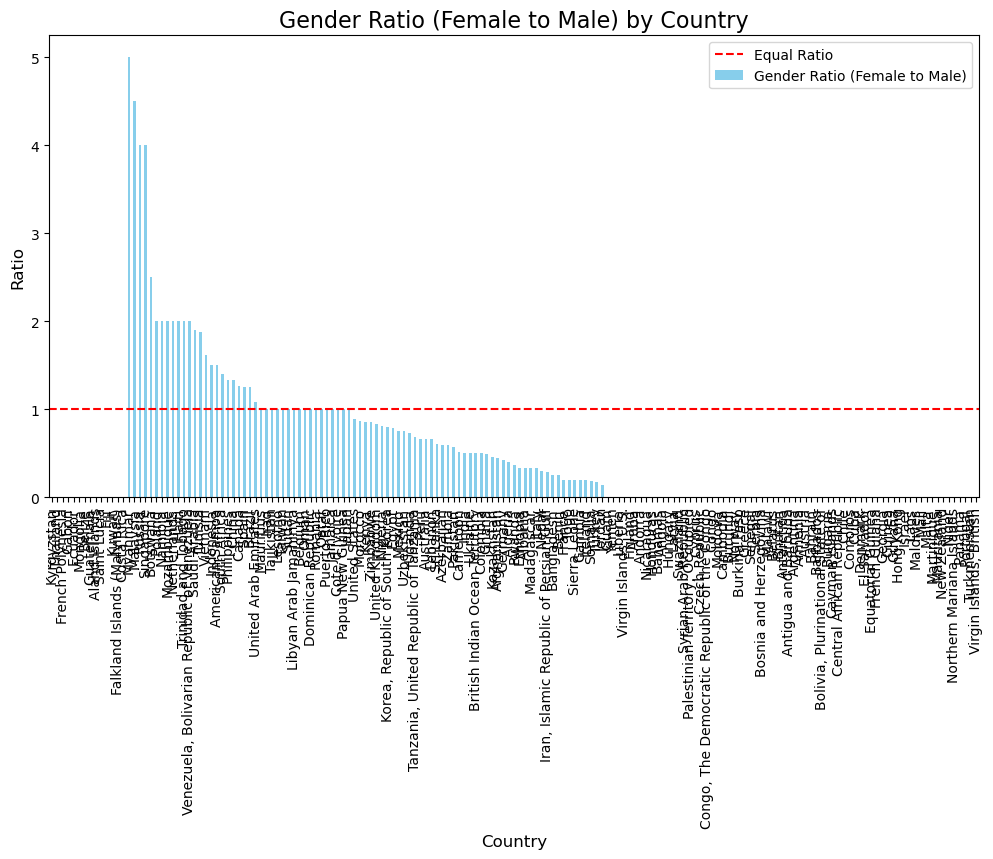

In [190]:
# Calculate gender counts by country
gender_ratio = df_cleaned.groupby('Country')['Gender'].value_counts().unstack().fillna(0)

# Calculate the gender ratio
gender_ratio['Gender Ratio (Female to Male)'] = gender_ratio['Female'] / gender_ratio['Male']

# Plotting Gender Ratio by Country
plt.figure(figsize=(12, 6))
gender_ratio['Gender Ratio (Female to Male)'].sort_values(ascending=False).plot(kind='bar', color='skyblue')
plt.title('Gender Ratio (Female to Male) by Country', fontsize=16)
plt.ylabel('Ratio', fontsize=12)
plt.xlabel('Country', fontsize=12)
plt.xticks(rotation=90)
plt.axhline(1, color='red', linestyle='--', label='Equal Ratio')
plt.legend()
plt.show()

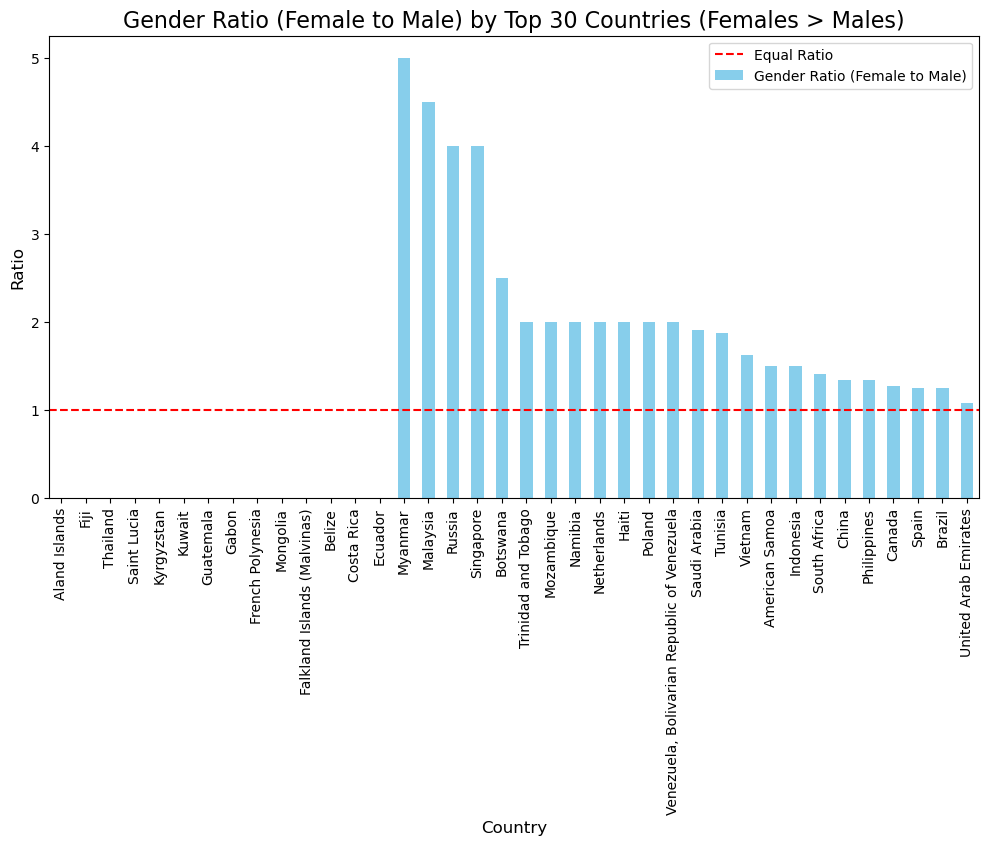

In [191]:
# Calculate gender counts by country
gender_ratio = df_cleaned.groupby('Country')['Gender'].value_counts().unstack().fillna(0)

# Calculate the gender ratio
gender_ratio['Gender Ratio (Female to Male)'] = gender_ratio['Female'] / gender_ratio['Male']

# Filter for top 30 countries
top_30_countries = gender_ratio.sum(axis=1).index
gender_ratio_top_30 = gender_ratio.loc[top_30_countries]

# Filter for countries where the female ratio is greater than 1
gender_ratio_top_30_females_more = gender_ratio_top_30[gender_ratio_top_30['Gender Ratio (Female to Male)'] > 1]

# Plotting Gender Ratio by Top 30 Countries (Females > Males)
plt.figure(figsize=(12, 6))
gender_ratio_top_30_females_more['Gender Ratio (Female to Male)'].sort_values(ascending=False).plot(kind='bar', color='skyblue')
plt.title('Gender Ratio (Female to Male) by Top 30 Countries (Females > Males)', fontsize=16)
plt.ylabel('Ratio', fontsize=12)
plt.xlabel('Country', fontsize=12)
plt.xticks(rotation=90)
plt.axhline(1, color='red', linestyle='--', label='Equal Ratio')
plt.legend()
plt.show()

<Figure size 1200x600 with 0 Axes>

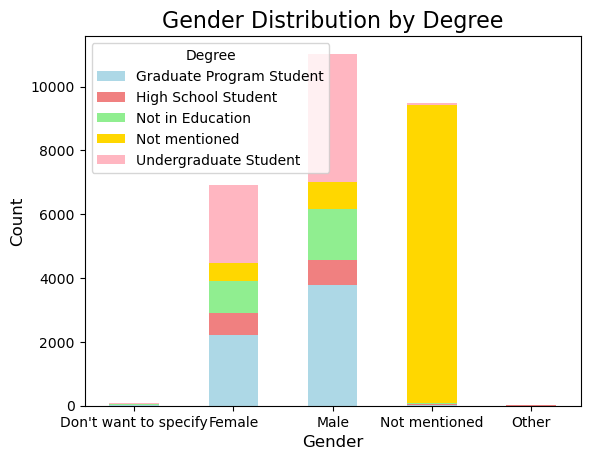

In [192]:
# Create a crosstab for Gender and Degree
gender_degree_crosstab = pd.crosstab(df_cleaned['Gender'], df_cleaned['Degree'])

# Plotting the crosstab
plt.figure(figsize=(12, 6))
gender_degree_crosstab.plot(kind='bar', stacked=True, color=['lightblue', 'lightcoral', 'lightgreen', 'gold', 'lightpink'])
plt.title('Gender Distribution by Degree', fontsize=16)
plt.xlabel('Gender', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=0)
plt.legend(title='Degree')
plt.show()


<Figure size 1200x600 with 0 Axes>

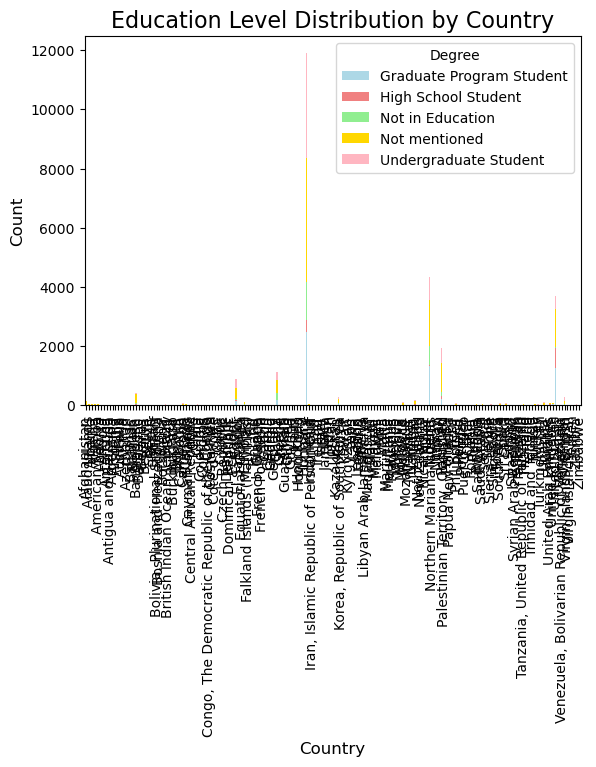

In [193]:
# Create a crosstab for Education Level by Country
education_crosstab = pd.crosstab(df_cleaned['Country'], df_cleaned['Degree'])

# Plotting Education Level by Country
plt.figure(figsize=(12, 6))
education_crosstab.plot(kind='bar', stacked=True, color=['lightblue', 'lightcoral', 'lightgreen', 'gold', 'lightpink'])
plt.title('Education Level Distribution by Country', fontsize=16)
plt.xlabel('Country', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=90)
plt.legend(title='Degree')
plt.show()

<Figure size 1200x600 with 0 Axes>

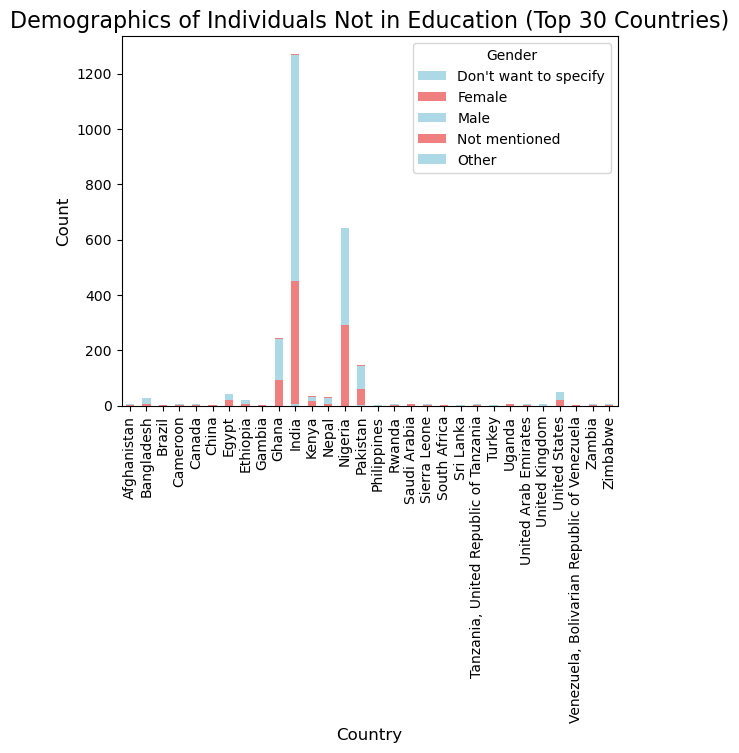

In [194]:

# Step 1: Filter for individuals 'Not in Education'
not_in_education_df = df_cleaned[df_cleaned['Degree'] == 'Not in Education']

# Step 2: Count occurrences by country
not_in_education_counts = not_in_education_df['Country'].value_counts()

# Step 3: Get the top 30 countries
top_30_countries = not_in_education_counts.nlargest(30).index

# Step 4: Filter the DataFrame for top 30 countries
not_in_education_top_30 = not_in_education_df[not_in_education_df['Country'].isin(top_30_countries)]

# Step 5: Create a crosstab for demographics (Gender and Country)
not_in_education_crosstab_top_30 = pd.crosstab(not_in_education_top_30['Country'], not_in_education_top_30['Gender'])

# Step 6: Plotting demographics
plt.figure(figsize=(12, 6))
not_in_education_crosstab_top_30.plot(kind='bar', stacked=True, color=['lightblue', 'lightcoral'])
plt.title('Demographics of Individuals Not in Education (Top 30 Countries)', fontsize=16)
plt.xlabel('Country', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=90)
plt.legend(title='Gender')
plt.show()


<Figure size 200x600 with 0 Axes>

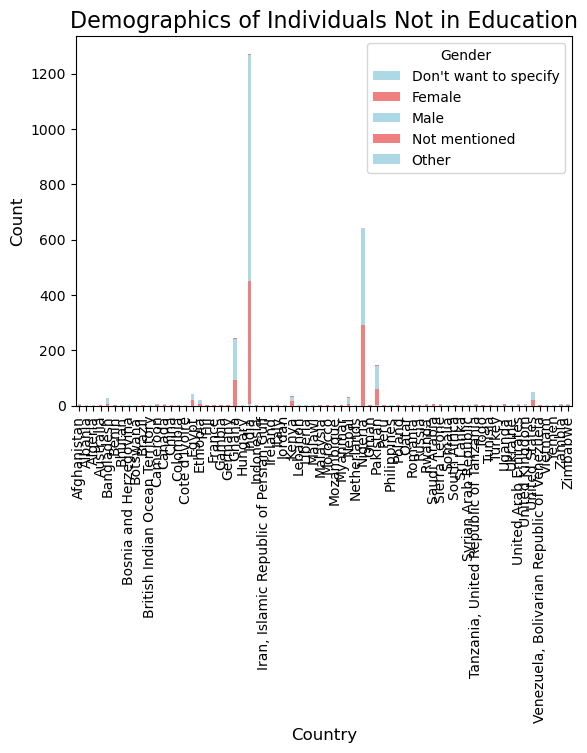

In [195]:
# Filter the dataframe for individuals 'Not in Education'
not_in_education = df_cleaned[df_cleaned['Degree'] == 'Not in Education']

# Analyze demographics (Gender and Country) for individuals Not in Education
not_in_education_crosstab = pd.crosstab(not_in_education['Country'], not_in_education['Gender'])

# Plotting demographics
plt.figure(figsize=(2, 6))
not_in_education_crosstab.plot(kind='bar', stacked=True, color=['lightblue', 'lightcoral'])
plt.title('Demographics of Individuals Not in Education', fontsize=16)
plt.xlabel('Country', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=90)
plt.legend(title='Gender')
plt.show()


<Figure size 1200x600 with 0 Axes>

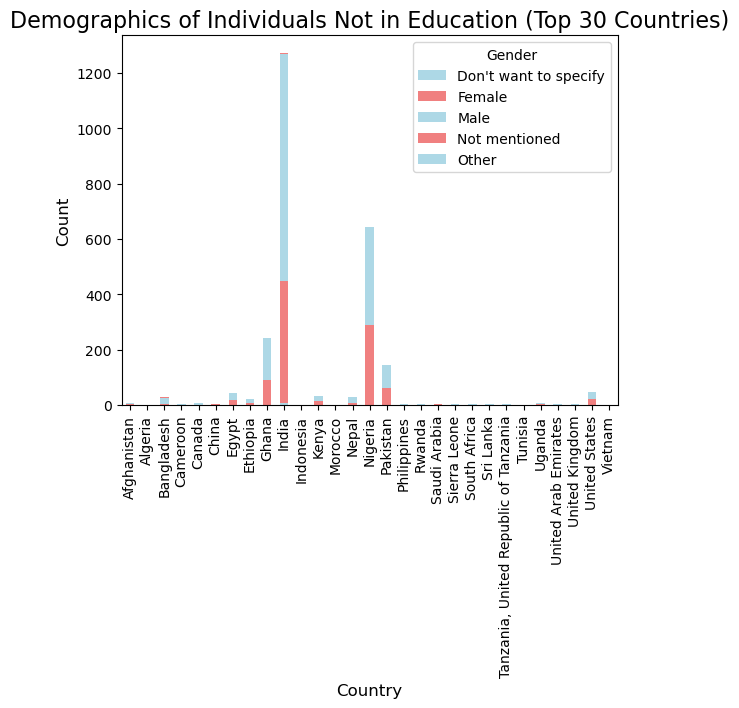

In [196]:
# Step 1: Count occurrences by country to find top 30 countries
country_counts = df_cleaned['Country'].value_counts()
top_30_countries = country_counts.nlargest(30).index

# Step 2: Filter the original DataFrame for top 30 countries
filtered_df_top_30 = df_cleaned[df_cleaned['Country'].isin(top_30_countries)]

# Step 3: Filter for individuals 'Not in Education'
not_in_education_top_30 = filtered_df_top_30[filtered_df_top_30['Degree'] == 'Not in Education']

# Step 4: Create a crosstab for demographics (Gender and Country)
not_in_education_crosstab_top_30 = pd.crosstab(not_in_education_top_30['Country'], not_in_education_top_30['Gender'])

# Step 5: Plotting demographics
plt.figure(figsize=(12, 6))
not_in_education_crosstab_top_30.plot(kind='bar', stacked=True, color=['lightblue', 'lightcoral'])
plt.title('Demographics of Individuals Not in Education (Top 30 Countries)', fontsize=16)
plt.xlabel('Country', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=90)
plt.legend(title='Gender')
plt.show()


<Figure size 1000x600 with 0 Axes>

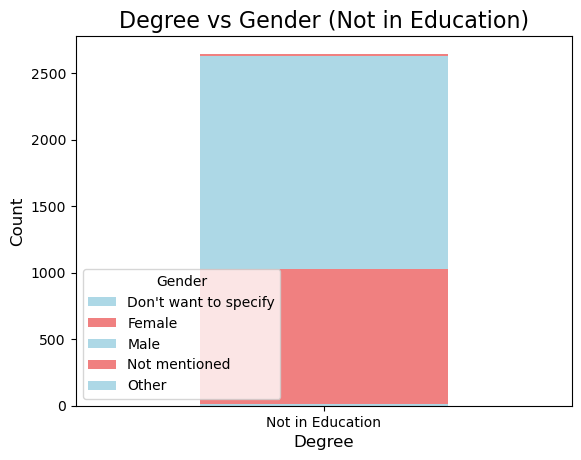

In [197]:
# Step 1: Count occurrences by country to find countries
country_counts = df_cleaned['Country'].value_counts()
countries = country_counts.index

# Step 2: Filter the original DataFrame for countries
filtered_df_top = df_cleaned[df_cleaned['Country'].isin(countries)]

# Step 3: Filter for individuals 'Not in Education'
not_in_education_top = filtered_df_top[filtered_df_top['Degree'] == 'Not in Education']

# Step 4: Create a crosstab for Degree vs Gender
degree_gender_crosstab = pd.crosstab(not_in_education_top['Degree'], not_in_education_top['Gender'])

# Step 5: Plotting Degree vs Gender
plt.figure(figsize=(10, 6))
degree_gender_crosstab.plot(kind='bar', stacked=True, color=['lightblue', 'lightcoral'])
plt.title('Degree vs Gender (Not in Education)', fontsize=16)
plt.xlabel('Degree', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=0)
plt.legend(title='Gender')
plt.show()


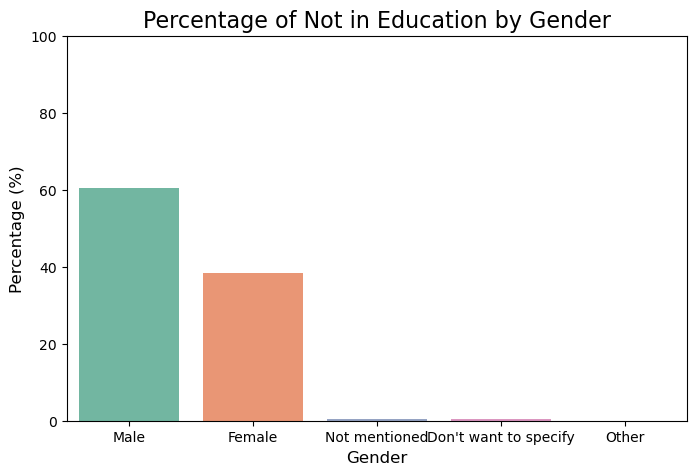

                  Gender  Percentage
0                   Male   60.544218
1                 Female   38.397581
2          Not mentioned    0.529101
3  Don't want to specify    0.491308
4                  Other    0.037793


In [198]:
# Assuming df_cleaned is your original DataFrame

# Step 1: Filter for individuals 'Not in Education'
not_in_education = df_cleaned[df_cleaned['Degree'] == 'Not in Education']

# Step 2: Count total individuals in 'Not in Education'
total_not_in_education = len(not_in_education)

# Step 3: Count males and females
gender_counts = not_in_education['Gender'].value_counts()

# Step 4: Calculate percentages
percentages = (gender_counts / total_not_in_education) * 100

# Step 5: Create a DataFrame for plotting
percentage_df = percentages.reset_index()
percentage_df.columns = ['Gender', 'Percentage']

# Step 6: Plotting
plt.figure(figsize=(8, 5))
sns.barplot(x='Gender', y='Percentage', data=percentage_df, palette='Set2')
plt.title('Percentage of Not in Education by Gender', fontsize=16)
plt.ylabel('Percentage (%)', fontsize=12)
plt.xlabel('Gender', fontsize=12)
plt.ylim(0, 100)
plt.show()

# Output the percentage values for clarity
print(percentage_df)

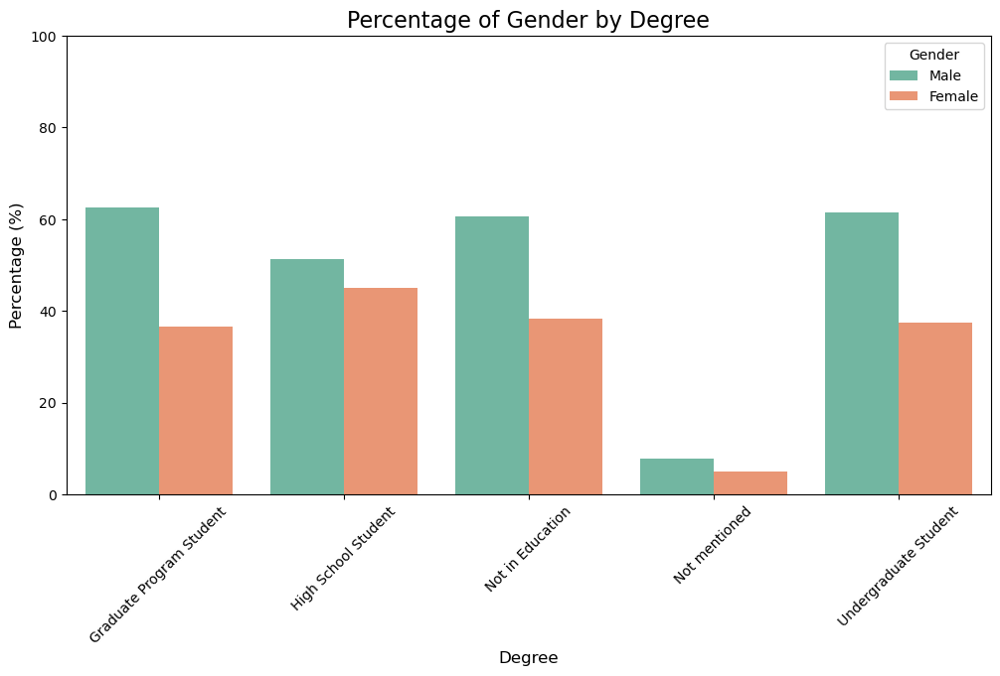

In [199]:
# Step 1: Group by Degree and Gender and count occurrences
degree_gender_counts = df_cleaned.groupby(['Degree', 'Gender']).size().unstack(fill_value=0)

# Step 2: Calculate total counts for each Degree
degree_counts = degree_gender_counts.sum(axis=1)

# Step 3: Calculate percentages
percentage_df = (degree_gender_counts.div(degree_counts, axis=0) * 100).reset_index()

# Step 4: Melt the DataFrame for plotting
percentage_melted = percentage_df.melt(id_vars='Degree', value_vars=['Male', 'Female'], var_name='Gender', value_name='Percentage')

# Step 5: Plotting
plt.figure(figsize=(12, 6))
sns.barplot(x='Degree', y='Percentage', hue='Gender', data=percentage_melted, palette='Set2')
plt.title('Percentage of Gender by Degree', fontsize=16)
plt.ylabel('Percentage (%)', fontsize=12)
plt.xlabel('Degree', fontsize=12)
plt.ylim(0, 100)
plt.xticks(rotation=45)
plt.legend(title='Gender')
plt.show()


C:\Users\vamsh\AppData\Local\Temp\ipykernel_17620\1033394138.py:9: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


<Figure size 1200x600 with 0 Axes>

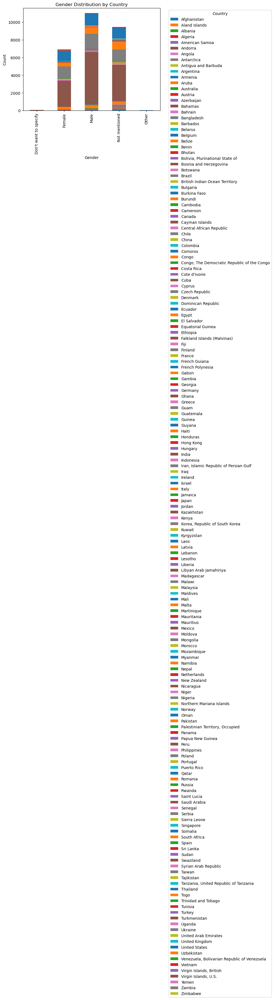

In [201]:
# Gender distribution by country
plt.figure(figsize=(12, 6))
gender_country = pd.crosstab(userdata['Gender'], userdata['Country'])
gender_country.plot(kind='bar', stacked=True)
plt.title('Gender Distribution by Country')
plt.xlabel('Gender')
plt.ylabel('Count')
plt.legend(title='Country', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()



<Figure size 1200x600 with 0 Axes>

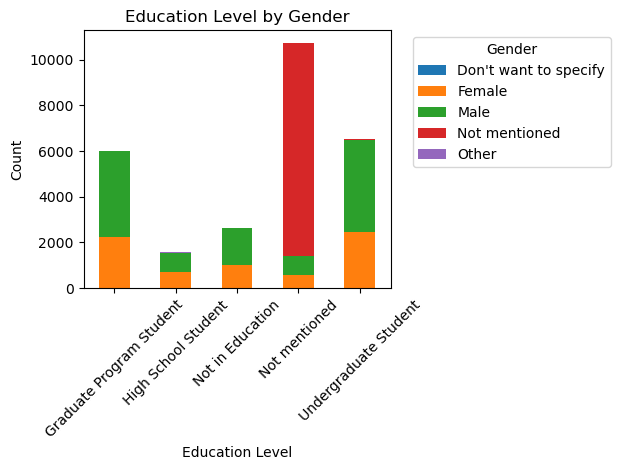

In [202]:
# Education level by gender
plt.figure(figsize=(12, 6))
education_gender = pd.crosstab(userdata['Degree'], userdata['Gender'])
education_gender.plot(kind='bar', stacked=True)
plt.title('Education Level by Gender')
plt.xlabel('Education Level')
plt.ylabel('Count')
plt.legend(title='Gender', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
opportunities

In [17]:
# 1. Filter out rows where 'Skill Points Earned' is 0
filtered_skill_points = opportunities[opportunities['Skill Points Earned'] > 0]['Skill Points Earned']

# 2. Descriptive Statistics (Excluding 0)
print("Descriptive Statistics for Skill Points Earned (Excluding 0):")
print(filtered_skill_points.describe())

Descriptive Statistics for Skill Points Earned (Excluding 0):
count    2514.000000
mean     1186.269690
std       399.208619
min        10.000000
25%      1182.000000
50%      1182.000000
75%      1182.000000
max      1776.000000
Name: Skill Points Earned, dtype: float64


Descriptive Statistics for Skill Points Earned:
count    20257.000000
mean       147.222294
std        415.631985
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max       1776.000000
Name: Skill Points Earned, dtype: float64


C:\Users\vamsh\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


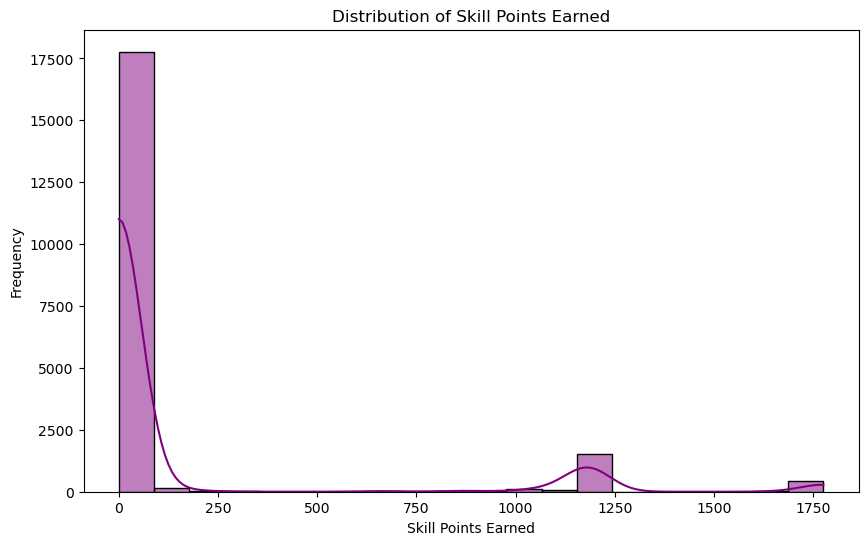

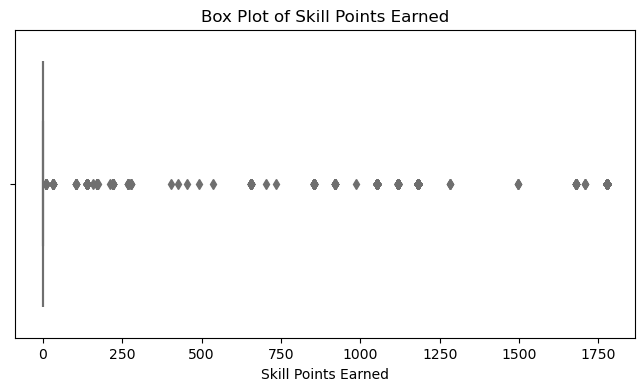


Unique Values in Skill Points Earned:
Skill Points Earned
0       17743
1182     1515
1776      449
1052      127
137       113
1117       72
854        48
656        37
1678       20
1183       19
Name: count, dtype: int64


In [55]:
# 1. Descriptive Statistics
print("Descriptive Statistics for Skill Points Earned:")
print(opportunities['Skill Points Earned'].describe())

# 2. Distribution Plot (Histogram + KDE)
plt.figure(figsize=(10, 6))
sns.histplot(opportunities['Skill Points Earned'], bins=20, kde=True, color='purple')
plt.title('Distribution of Skill Points Earned')
plt.xlabel('Skill Points Earned')
plt.ylabel('Frequency')
plt.show()

# 3. Box Plot to identify outliers
plt.figure(figsize=(8, 4))
sns.boxplot(x=opportunities['Skill Points Earned'], color='skyblue')
plt.title('Box Plot of Skill Points Earned')
plt.xlabel('Skill Points Earned')
plt.show()

# 4. Print counts of unique values (Optional)
print("\nUnique Values in Skill Points Earned:")
print(opportunities['Skill Points Earned'].value_counts().head(10))  # Display top 10 most frequent values


In [56]:
# Filtering out rows with Reward Amount of 0
filtered_df = opportunities[opportunities['Reward Amount'] > 0]

# Grouping by 'Opportunity Category' and calculating mean Reward Amount
mean_reward = filtered_df.groupby('Opportunity Category')['Reward Amount'].mean().sort_values(ascending=False).head()

# Displaying the result
print(mean_reward)

Opportunity Category
Internship     1298.881323
Course          119.467213
Competition      94.271845
Event            67.567568
Name: Reward Amount, dtype: float64


In [57]:
# Additional analysis
#print(df.describe())
print(opportunities['Current Student Status'].value_counts())
print(opportunities.groupby('Opportunity Category')['Reward Amount'].mean().sort_values(ascending=False).head())

Current Student Status
Graduate Program Student    9280
Undergraduate Student       6977
Not in Education            2850
High School Student         1150
Name: count, dtype: int64
Opportunity Category
Internship     174.474062
Course          16.869213
Competition      8.677391
Event            3.750000
Engagement       0.000000
Name: Reward Amount, dtype: float64


In [58]:
# 1. Reward Amount
print("\n--- Reward Amount Analysis ---")
filtered_df = opportunities[opportunities['Reward Amount'] > 0]

print(filtered_df['Reward Amount'].describe())
print("Skewness:", filtered_df['Reward Amount'].skew())
print("Kurtosis:", filtered_df['Reward Amount'].kurtosis())


--- Reward Amount Analysis ---
count    2514.000000
mean     1080.692124
std       927.529569
min        50.000000
25%       500.000000
50%       500.000000
75%      2500.000000
max      2500.000000
Name: Reward Amount, dtype: float64
Skewness: 0.6986689598803005
Kurtosis: -1.1735579023206373


In [59]:
# 2. Opportunity Category
print("\n--- Opportunity Category Analysis ---")
category_counts = opportunities['Opportunity Category'].value_counts()
print(category_counts)
print("\nPercentage distribution:")
print(category_counts / len(opportunities) * 100)


--- Opportunity Category Analysis ---
Opportunity Category
Internship     15306
Event           2000
Course          1728
Competition     1119
Engagement       104
Name: count, dtype: int64

Percentage distribution:
Opportunity Category
Internship     75.559066
Event           9.873130
Course          8.530385
Competition     5.524016
Engagement      0.513403
Name: count, dtype: float64


In [214]:
# EDA Functions
def plot_opportunity_categories(df):
    plt.figure(figsize=(12, 6))
    df['Opportunity Category'].value_counts().plot(kind='bar')
    plt.title('Distribution of Opportunity Categories')
    plt.xlabel('Category')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.show()

def plot_status_description(df):
    plt.figure(figsize=(10, 6))
    df['Status Description'].value_counts().plot(kind='pie', autopct='%1.1f%%')
    plt.title('Distribution of Status Descriptions')
    plt.ylabel('')
    plt.show()

def plot_reward_distribution(df):
    plt.figure(figsize=(10, 6))
    sns.histplot(df['Reward Amount'].dropna(), kde=True)
    plt.title('Distribution of Reward Amounts')
    plt.xlabel('Reward Amount')
    plt.show()

def plot_skill_points_vs_reward(df):
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x='Skill Points Earned', y='Reward Amount', data=df)
    plt.title('Skill Points Earned vs Reward Amount')
    plt.xlabel('Skill Points Earned')
    plt.ylabel('Reward Amount')
    plt.show()


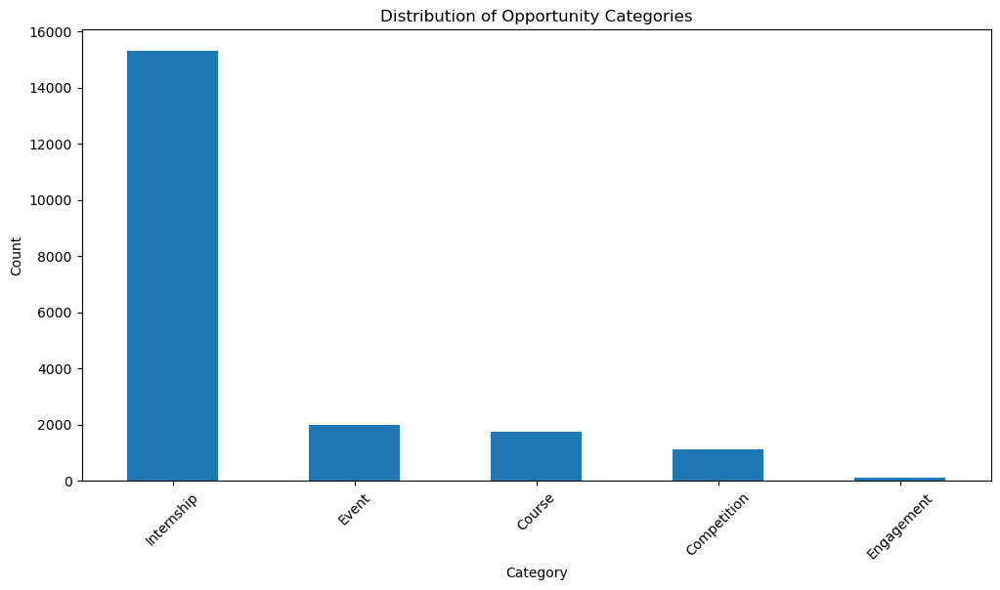

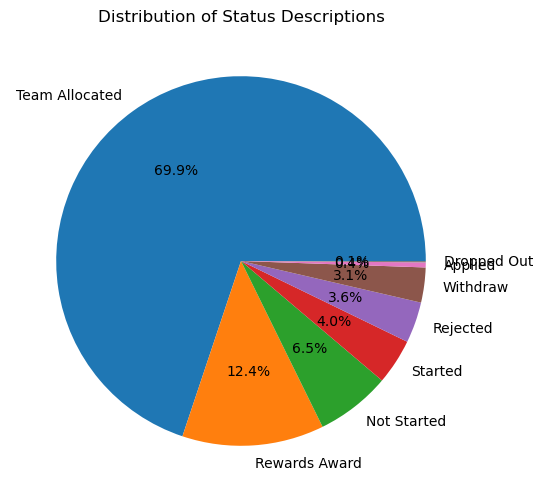

C:\Users\vamsh\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


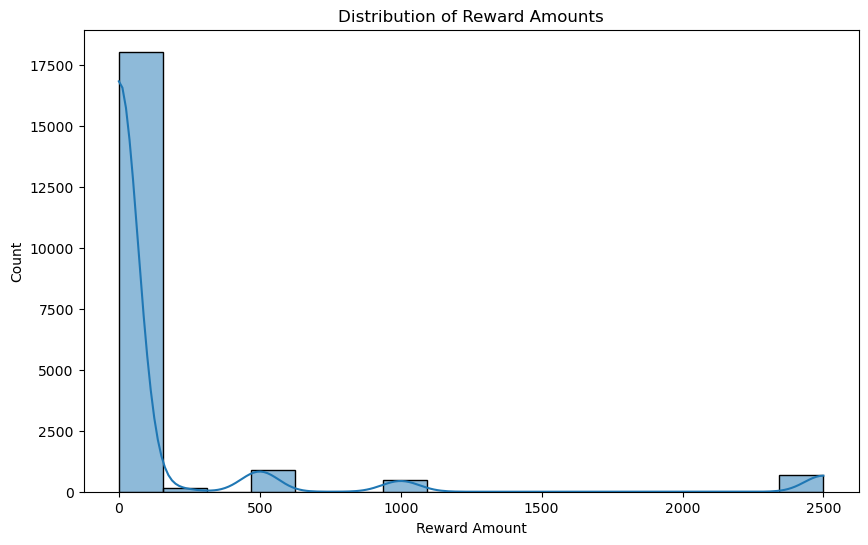

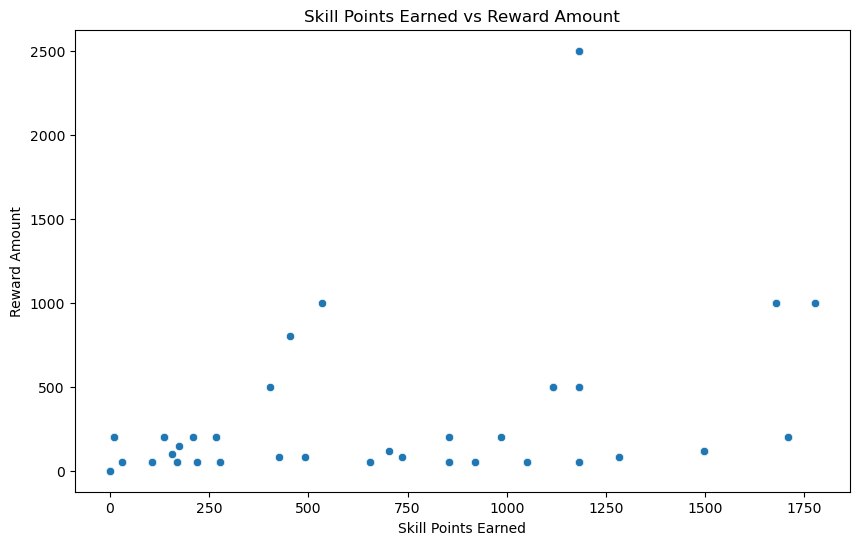

In [215]:
# Perform EDA
plot_opportunity_categories(opportunities)
plot_status_description(opportunities)
plot_reward_distribution(opportunities)
plot_skill_points_vs_reward(opportunities)

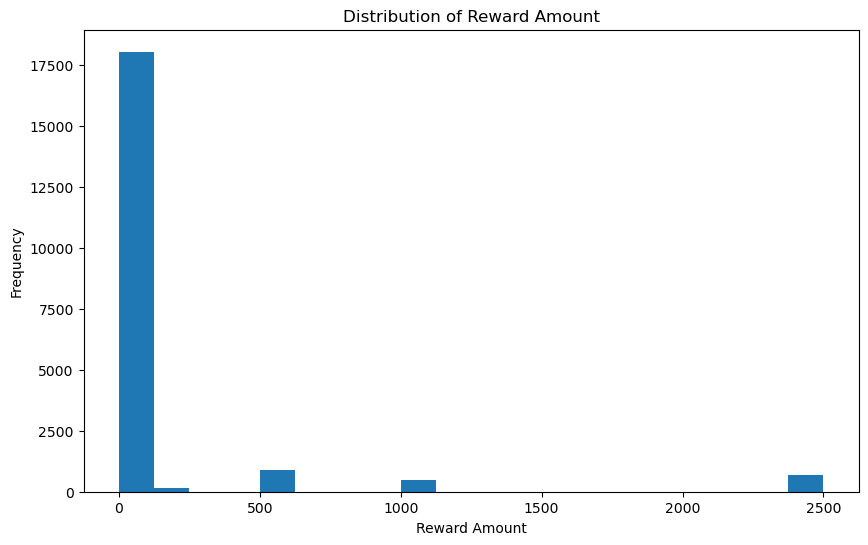

In [216]:
# Histogram of Reward Amount
plt.figure(figsize=(10, 6))
plt.hist(opportunities['Reward Amount'], bins=20)
plt.title('Distribution of Reward Amount')
plt.xlabel('Reward Amount')
plt.ylabel('Frequency')
plt.show()

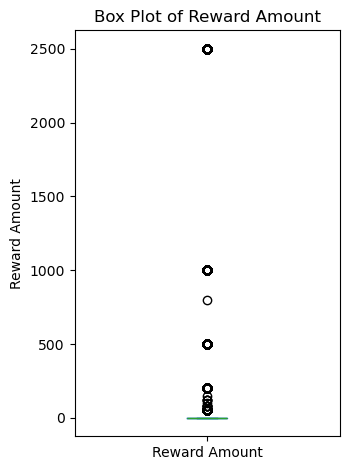

In [217]:
plt.subplot(122)
opportunities['Reward Amount'].plot(kind='box')
plt.title('Box Plot of Reward Amount')
plt.ylabel('Reward Amount')
plt.tight_layout()
plt.show()

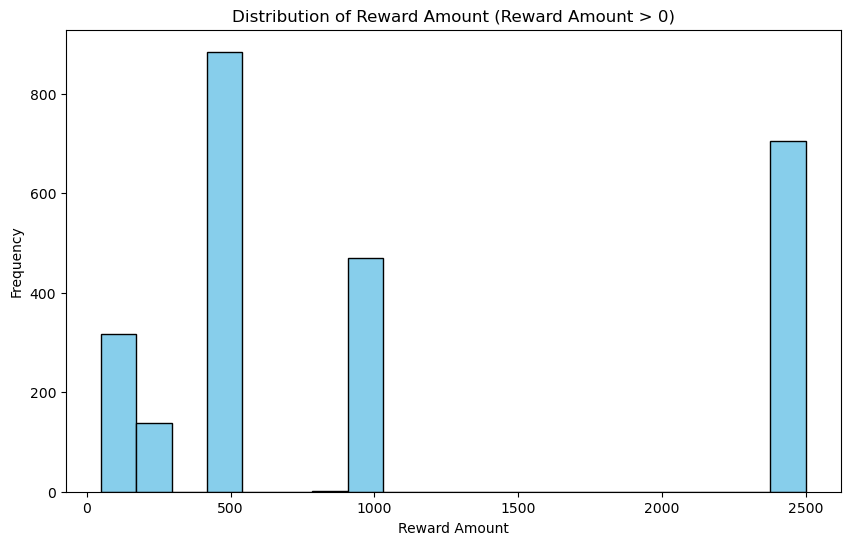

In [218]:
# Univariate Analysis

# Histogram of Reward Amount (only Reward Amount > 0)
plt.figure(figsize=(10, 6))

# Filter the DataFrame for Reward Amount > 0
filtered_reward_amount = opportunities[opportunities['Reward Amount'] > 0]['Reward Amount']

# Create the histogram
plt.hist(filtered_reward_amount, bins=20, color='skyblue', edgecolor='black')
plt.title('Distribution of Reward Amount (Reward Amount > 0)')
plt.xlabel('Reward Amount')
plt.ylabel('Frequency')
plt.show()



--- Gender Analysis ---
Gender
Male                     12207
Female                    7973
Don't want to specify       63
Other                       14
Name: count, dtype: int64

Percentage distribution:
Gender
Male                     60.260651
Female                   39.359234
Don't want to specify     0.311004
Other                     0.069112
Name: count, dtype: float64


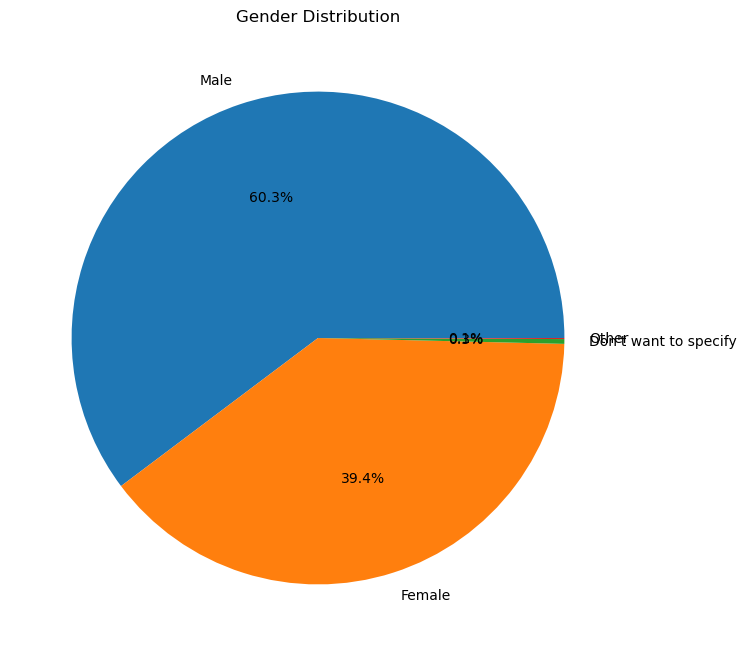

In [219]:
# 3. Gender
print("\n--- Gender Analysis ---")
gender_counts = opportunities['Gender'].value_counts()
print(gender_counts)
print("\nPercentage distribution:")
print(gender_counts / len(opportunities) * 100)

plt.figure(figsize=(8, 8))
gender_counts.plot(kind='pie', autopct='%1.1f%%')
plt.title('Gender Distribution')
plt.ylabel('')
plt.show()



--- Status Description Analysis ---
Status Description
Team Allocated    14153
Rewards Award      2514
Not Started        1323
Started             809
Rejected            725
Withdraw            620
Applied              89
Dropped Out          24
Name: count, dtype: int64

Percentage distribution:
Status Description
Team Allocated    69.867206
Rewards Award     12.410525
Not Started        6.531076
Started            3.993681
Rejected           3.579010
Withdraw           3.060670
Applied            0.439354
Dropped Out        0.118478
Name: count, dtype: float64


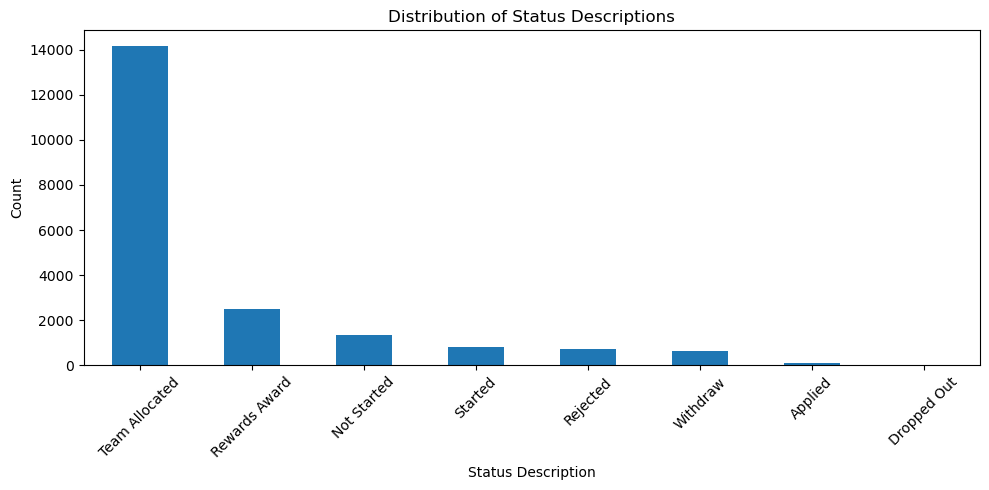

In [220]:
# 4. Status Description
print("\n--- Status Description Analysis ---")
status_counts = opportunities['Status Description'].value_counts()
print(status_counts)
print("\nPercentage distribution:")
print(status_counts / len(opportunities) * 100)

plt.figure(figsize=(10, 5))
status_counts.plot(kind='bar')
plt.title('Distribution of Status Descriptions')
plt.xlabel('Status Description')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

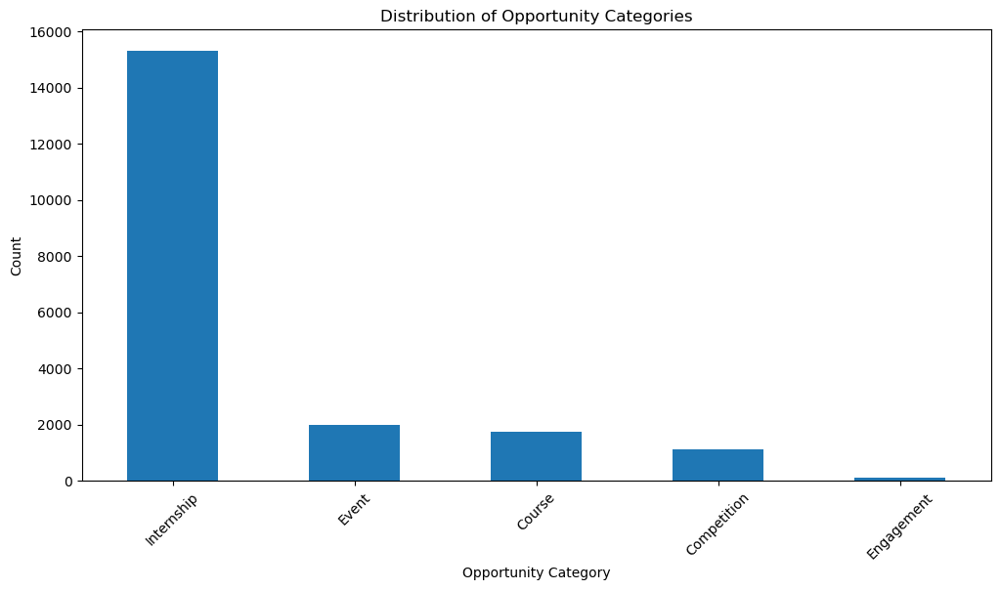

In [221]:
# Bar plot of Opportunity Category
plt.figure(figsize=(12, 6))
opportunities['Opportunity Category'].value_counts().plot(kind='bar')
plt.title('Distribution of Opportunity Categories')
plt.xlabel('Opportunity Category')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()


--- Reward Amount vs Opportunity Category ---
                       count         mean         std    min    25%     50%  \
Opportunity Category                                                          
Competition            103.0    94.271845  131.846628   50.0   50.0    50.0   
Course                 244.0   119.467213   74.949386   50.0   50.0    50.0   
Event                  111.0    67.567568   48.452718   50.0   50.0    50.0   
Internship            2056.0  1298.881323  888.172466  500.0  500.0  1000.0   

                         75%     max  
Opportunity Category                  
Competition             80.0  1000.0  
Course                 200.0   200.0  
Event                   50.0   200.0  
Internship            2500.0  2500.0  


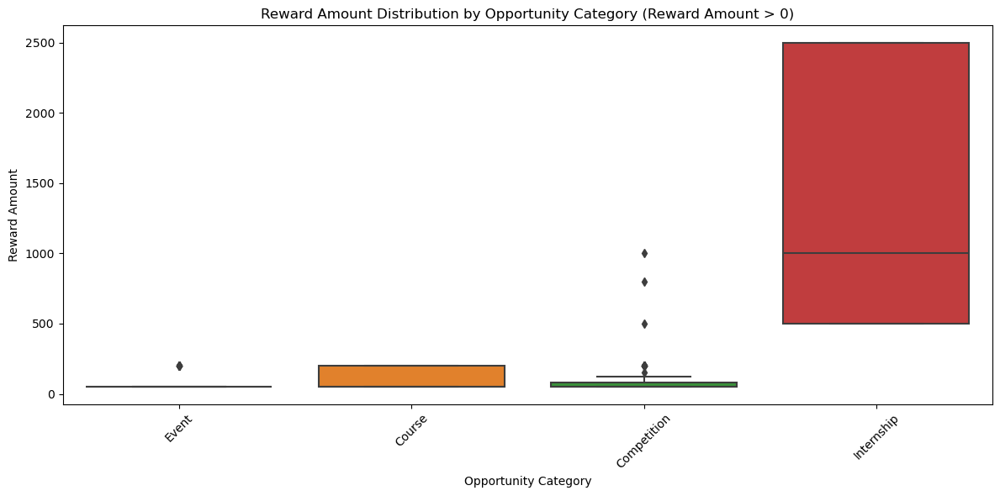

In [222]:
# Bivariate Analysis

# 1. Reward Amount vs Opportunity Category
print("\n--- Reward Amount vs Opportunity Category ---")

# Filter the DataFrame for Reward Amount > 0
df_filtered = opportunities[opportunities['Reward Amount'] > 0]

# Display statistics for the filtered data
print(df_filtered.groupby('Opportunity Category')['Reward Amount'].describe())

# Plotting the boxplot for filtered data
plt.figure(figsize=(12, 6))
sns.boxplot(x='Opportunity Category', y='Reward Amount', data=df_filtered)
plt.title('Reward Amount Distribution by Opportunity Category (Reward Amount > 0)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()



--- Reward Amount vs Gender ---
                         count        mean         std  min  25%  50%  75%  \
Gender                                                                       
Don't want to specify     63.0   80.158730  350.062170  0.0  0.0  0.0  0.0   
Female                  7973.0  144.424934  498.039469  0.0  0.0  0.0  0.0   
Male                   12207.0  127.575162  473.893913  0.0  0.0  0.0  0.0   
Other                     14.0  214.285714  671.229805  0.0  0.0  0.0  0.0   

                          max  
Gender                         
Don't want to specify  2500.0  
Female                 2500.0  
Male                   2500.0  
Other                  2500.0  


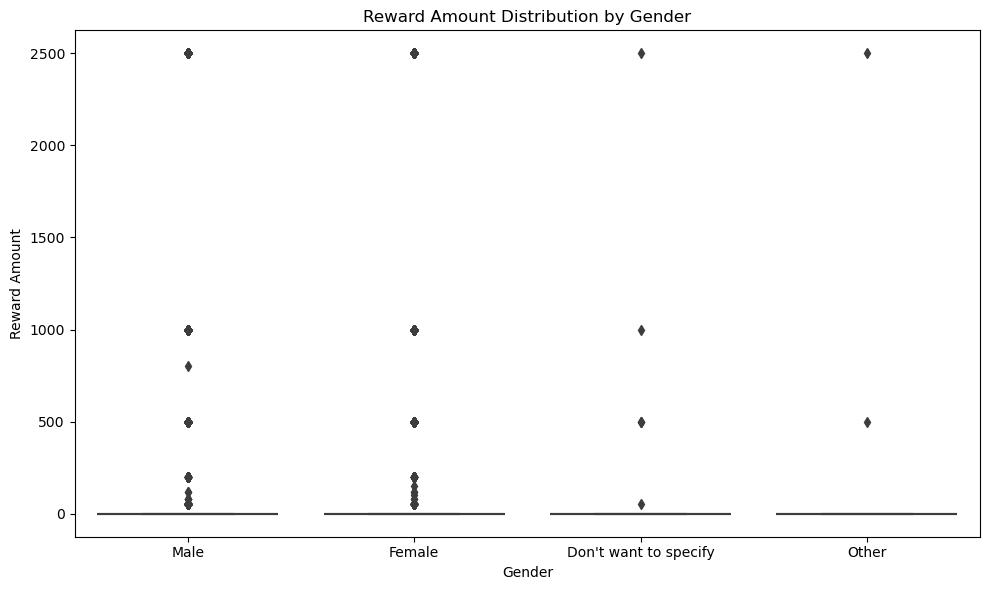

In [224]:
# 2. Reward Amount vs Gender
print("\n--- Reward Amount vs Gender ---")
print(opportunities.groupby('Gender')['Reward Amount'].describe())

plt.figure(figsize=(10, 6))
sns.boxplot(x='Gender', y='Reward Amount', data=opportunities)
plt.title('Reward Amount Distribution by Gender')
plt.tight_layout()
plt.show()


--- Reward Amount vs Gender ---
                        count         mean          std    min     25%  \
Gender                                                                   
Don't want to specify     6.0   841.666667   866.265933   50.0   500.0   
Female                 1070.0  1076.168224   919.846090   50.0   500.0   
Male                   1436.0  1084.477716   933.680256   50.0   500.0   
Other                     2.0  1500.000000  1414.213562  500.0  1000.0   

                          50%     75%     max  
Gender                                         
Don't want to specify   500.0   875.0  2500.0  
Female                  500.0  2500.0  2500.0  
Male                    500.0  2500.0  2500.0  
Other                  1500.0  2000.0  2500.0  


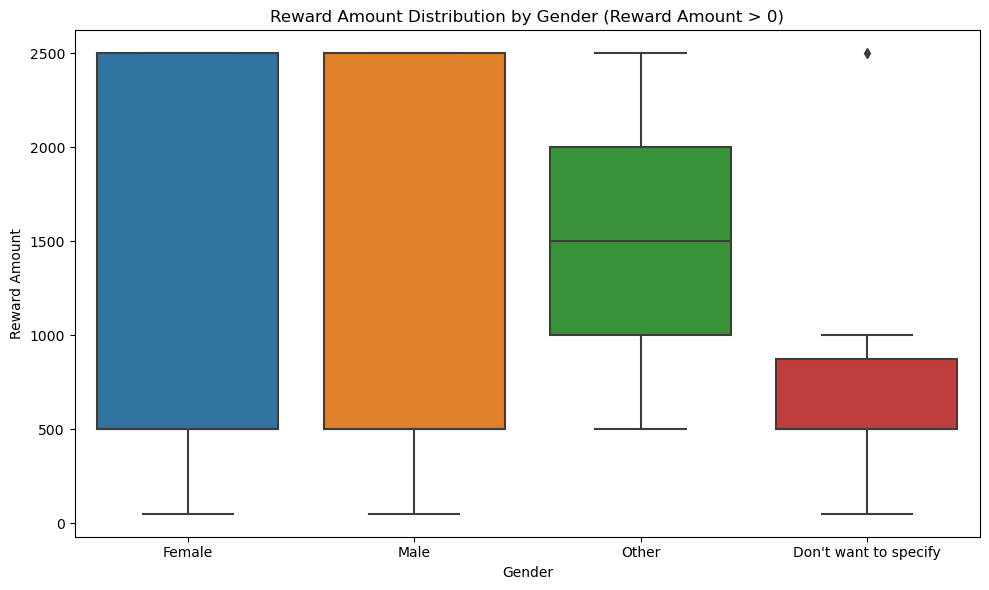

In [225]:
# Bivariate Analysis

# 2. Reward Amount vs Gender
print("\n--- Reward Amount vs Gender ---")

# Filter the DataFrame for Reward Amount > 0
df_filtered_gender = opportunities[opportunities['Reward Amount'] > 0]

# Display statistics for the filtered data
print(df_filtered_gender.groupby('Gender')['Reward Amount'].describe())

# Plotting the boxplot for filtered data
plt.figure(figsize=(10, 6))
sns.boxplot(x='Gender', y='Reward Amount', data=df_filtered_gender)
plt.title('Reward Amount Distribution by Gender (Reward Amount > 0)')
plt.tight_layout()
plt.show()



--- Opportunity Category vs Gender ---
Gender                Don't want to specify  Female  Male  Other
Opportunity Category                                            
Competition                               5     449   664      1
Course                                   10     750   967      1
Engagement                                0      34    70      0
Event                                     5     859  1133      3
Internship                               43    5881  9373      9

Chi-square test of independence:
Chi2 statistic: 39.50025991308324
p-value: 8.701183389481103e-05


<Figure size 1200x600 with 0 Axes>

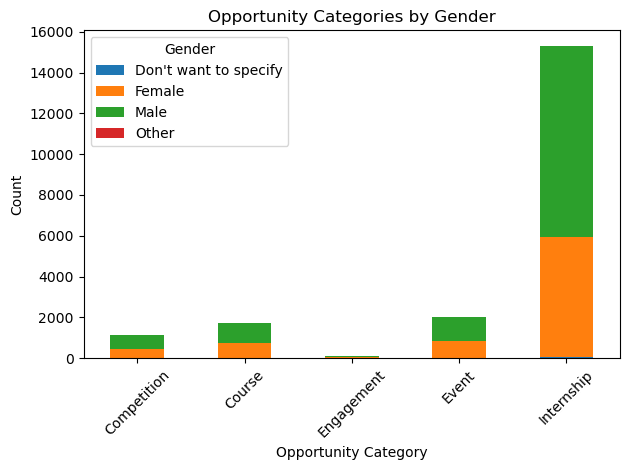

In [226]:
# 3. Opportunity Category vs Gender
print("\n--- Opportunity Category vs Gender ---")
category_gender = pd.crosstab(opportunities['Opportunity Category'], opportunities['Gender'])
print(category_gender)
print("\nChi-square test of independence:")
chi2, p_value, dof, expected = stats.chi2_contingency(category_gender)
print(f"Chi2 statistic: {chi2}")
print(f"p-value: {p_value}")

plt.figure(figsize=(12, 6))
category_gender.plot(kind='bar', stacked=True)
plt.title('Opportunity Categories by Gender')
plt.xlabel('Opportunity Category')
plt.ylabel('Count')
plt.legend(title='Gender')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


--- Reward Amount vs Status Description ---
                      count         mean         std   min    25%    50%  \
Status Description                                                         
Applied                89.0     0.000000    0.000000   0.0    0.0    0.0   
Dropped Out            24.0     0.000000    0.000000   0.0    0.0    0.0   
Not Started          1323.0     0.000000    0.000000   0.0    0.0    0.0   
Rejected              725.0     0.000000    0.000000   0.0    0.0    0.0   
Rewards Award        2514.0  1080.692124  927.529569  50.0  500.0  500.0   
Started               809.0     0.000000    0.000000   0.0    0.0    0.0   
Team Allocated      14153.0     0.000000    0.000000   0.0    0.0    0.0   
Withdraw              620.0     0.000000    0.000000   0.0    0.0    0.0   

                       75%     max  
Status Description                  
Applied                0.0     0.0  
Dropped Out            0.0     0.0  
Not Started            0.0     0.0  
Rejected 

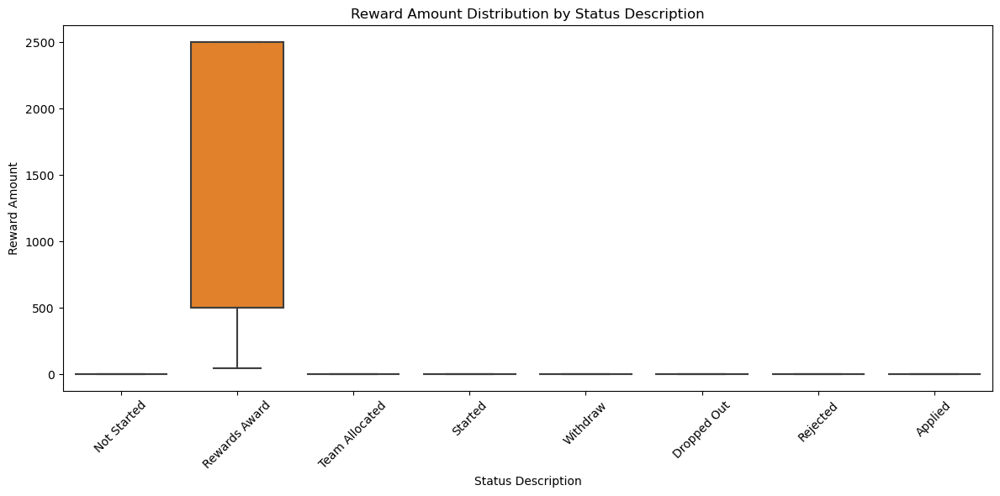

In [228]:
# 4. Reward Amount vs Status Description
print("\n--- Reward Amount vs Status Description ---")
print(opportunities.groupby('Status Description')['Reward Amount'].describe())

plt.figure(figsize=(12, 6))
sns.boxplot(x='Status Description', y='Reward Amount', data=opportunities)
plt.title('Reward Amount Distribution by Status Description')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


--- Correlation Matrix ---
                     Reward Amount  Skill Points Earned
Reward Amount             1.000000             0.749423
Skill Points Earned       0.749423             1.000000


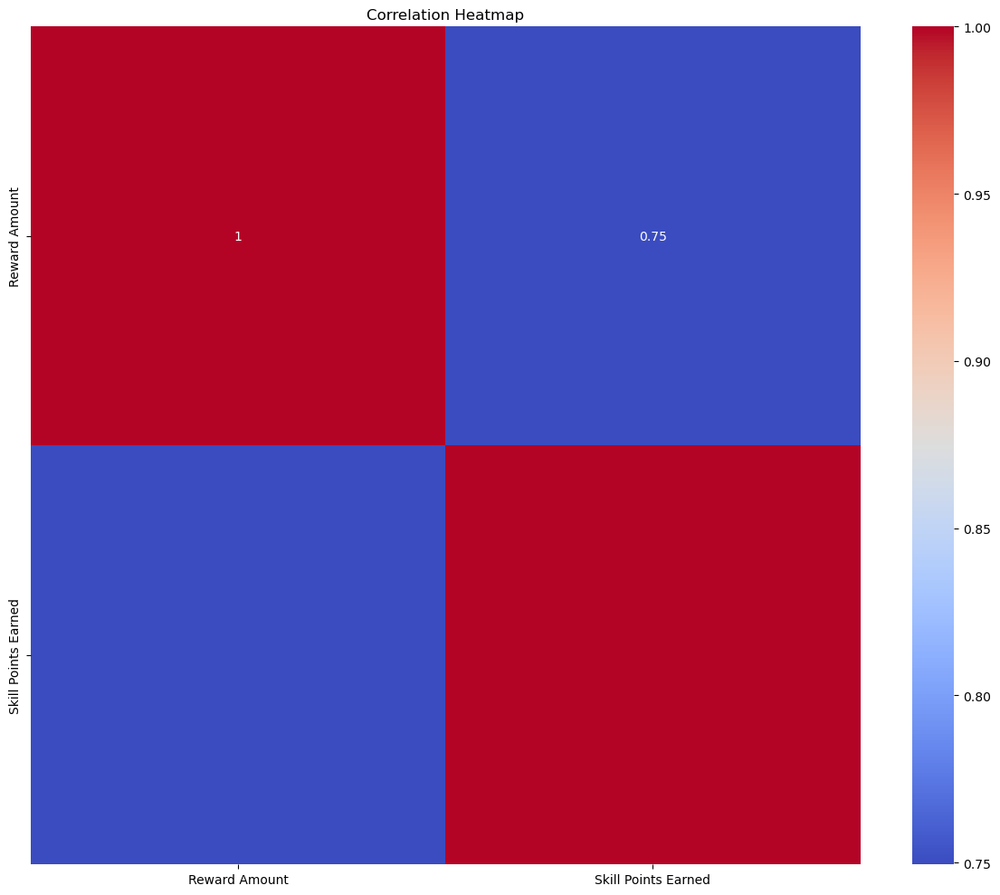

In [229]:
# 5. Correlation Analysis
numeric_df = opportunities.select_dtypes(include=[np.number])
correlation_matrix = numeric_df.corr()
print("\n--- Correlation Matrix ---")
print(correlation_matrix)

plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.tight_layout()
plt.show()

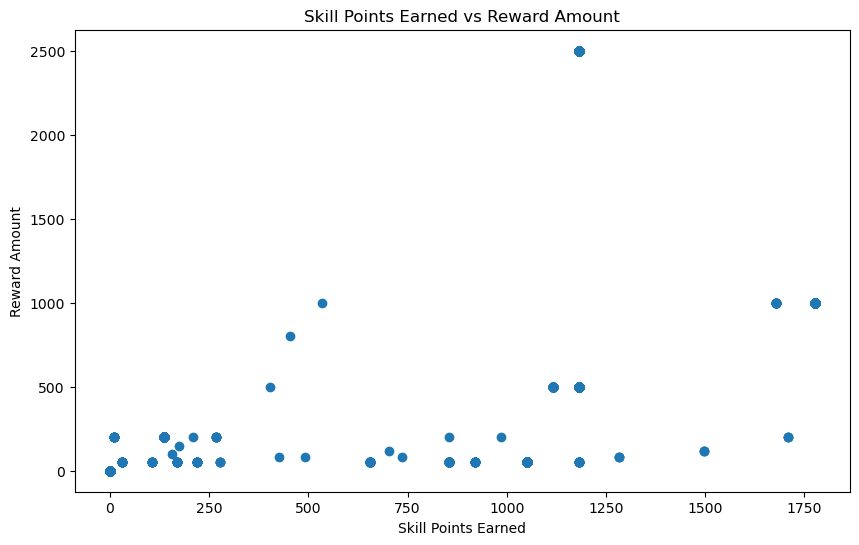

In [230]:
# Scatter plot of Skill Points Earned vs Reward Amount
plt.figure(figsize=(10, 6))
plt.scatter(opportunities['Skill Points Earned'], opportunities['Reward Amount'])
plt.title('Skill Points Earned vs Reward Amount')
plt.xlabel('Skill Points Earned')
plt.ylabel('Reward Amount')
plt.show()

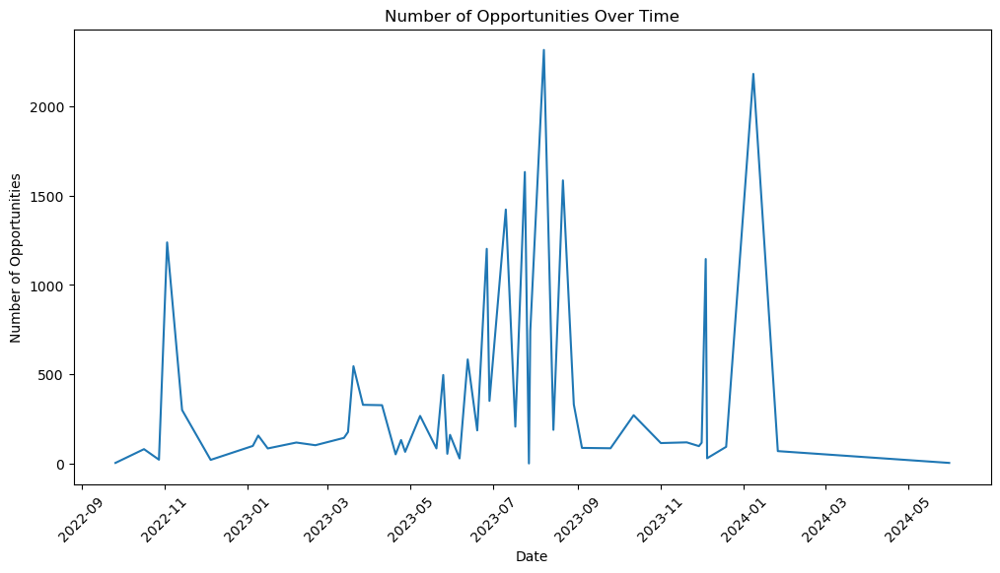

In [231]:
# Additional Analyses

# Time series analysis of opportunities
opportunities['Opportunity Start Date'] = pd.to_datetime(opportunities['Opportunity Start Date'])
opportunities_over_time = opportunities.groupby('Opportunity Start Date').size().reset_index(name='count')
plt.figure(figsize=(12, 6))
plt.plot(opportunities_over_time['Opportunity Start Date'], opportunities_over_time['count'])
plt.title('Number of Opportunities Over Time')
plt.xlabel('Date')
plt.ylabel('Number of Opportunities')
plt.xticks(rotation=45)
plt.show()

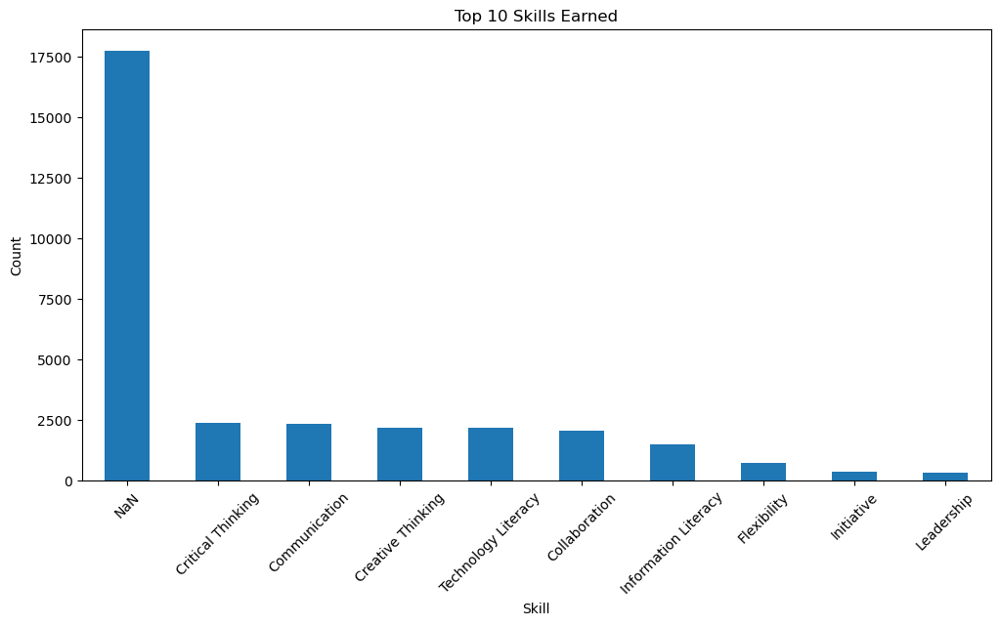

In [232]:
# Analysis of skills earned
all_skills = opportunities['Skills Earned'].str.strip('[]').str.replace('"', '').str.split(',', expand=True).stack()
top_skills = all_skills.value_counts().head(10)
plt.figure(figsize=(12, 6))
top_skills.plot(kind='bar')
plt.title('Top 10 Skills Earned')
plt.xlabel('Skill')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

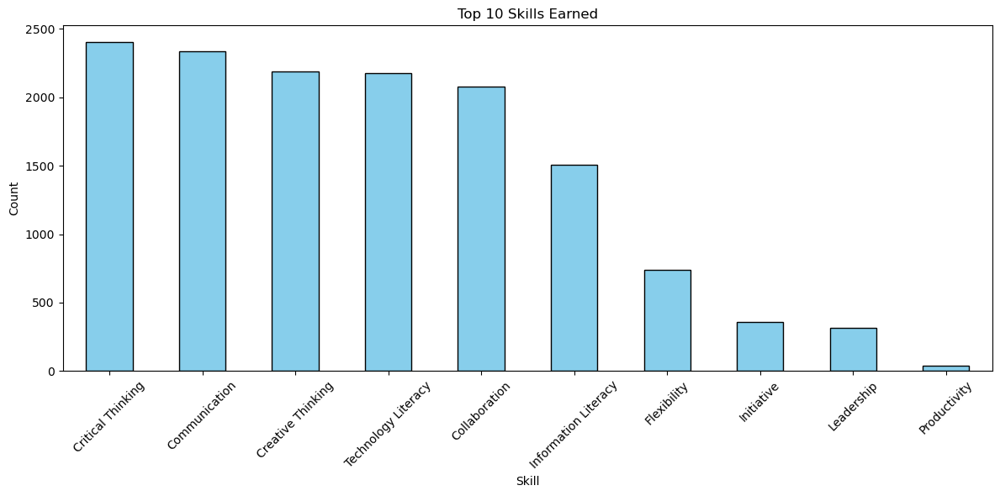

In [233]:
# Analysis of skills earned (excluding 'NaN' as a string value)
# Step 1: Filter out rows where 'Skills Earned' is 'NaN' as a string
df_skills_cleaned = opportunities[opportunities['Skills Earned'] != 'NaN']

# Step 2: Extract skills from the 'Skills Earned' column
all_skills = df_skills_cleaned['Skills Earned'].str.strip('[]').str.replace('"', '').str.split(',', expand=True).stack()

# Step 3: Count the top skills
top_skills = all_skills.value_counts().head(10)

# Step 4: Plot the top 10 skills earned
plt.figure(figsize=(12, 6))
top_skills.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Top 10 Skills Earned')
plt.xlabel('Skill')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


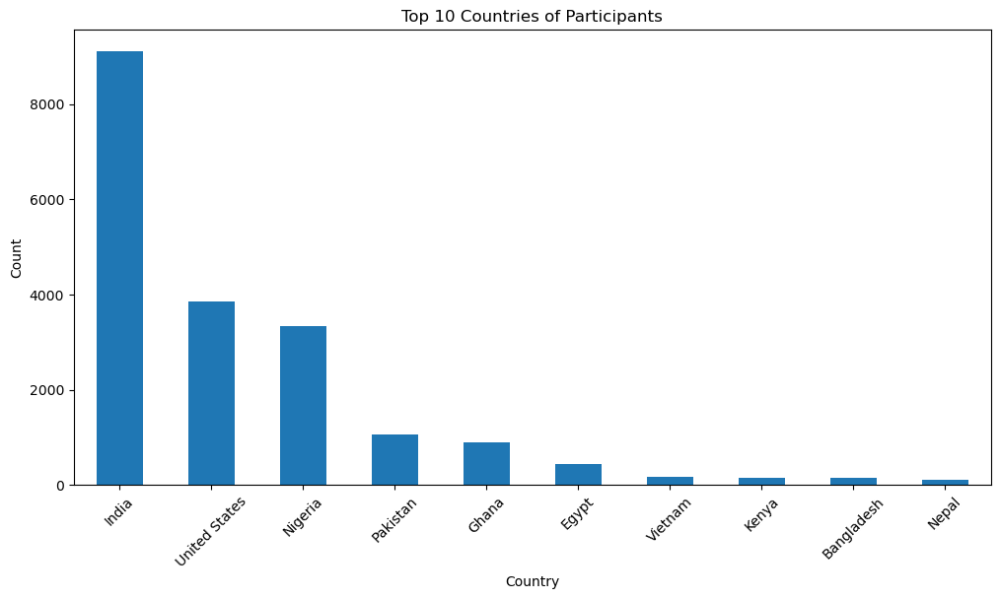

In [235]:
# Geographic analysis
country_counts = opportunities['Country'].value_counts().head(10)
plt.figure(figsize=(12, 6))
country_counts.plot(kind='bar')
plt.title('Top 10 Countries of Participants')
plt.xlabel('Country')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

<Figure size 1200x800 with 0 Axes>

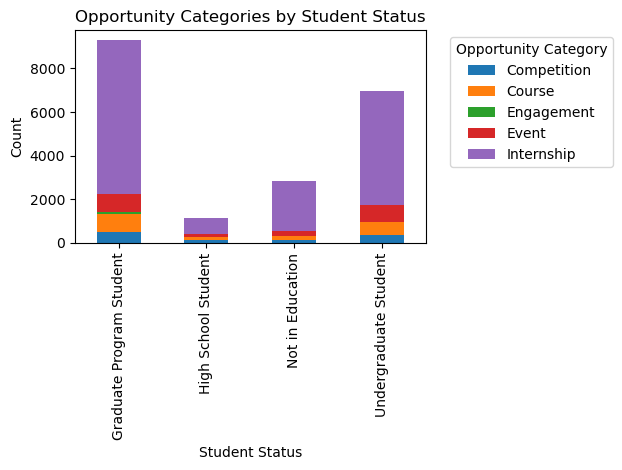

In [236]:
# Analysis of student status and opportunity categories
status_category = pd.crosstab(opportunities['Current Student Status'], opportunities['Opportunity Category'])
plt.figure(figsize=(12, 8))
status_category.plot(kind='bar', stacked=True)
plt.title('Opportunity Categories by Student Status')
plt.xlabel('Student Status')
plt.ylabel('Count')
plt.legend(title='Opportunity Category', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

<Figure size 1000x600 with 0 Axes>

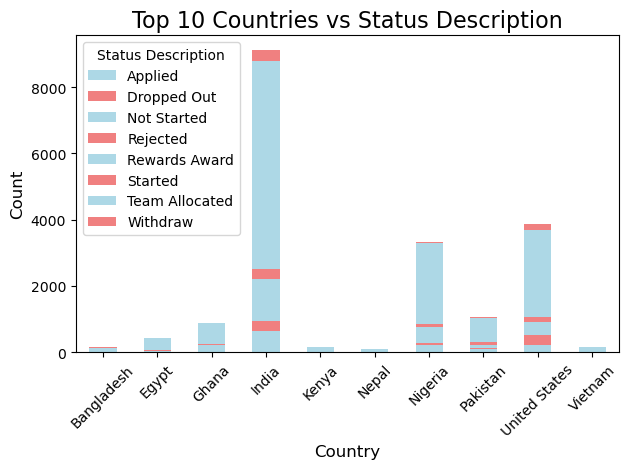

In [237]:

# 1. Calculate the total counts for each country
country_counts = opportunities['Country'].value_counts()

# 2. Select the top 10 countries based on total counts
top_10_countries = country_counts.nlargest(10).index

# 3. Create a crosstab for only the top 10 countries
crosstab_result = pd.crosstab(opportunities[opportunities['Country'].isin(top_10_countries)]['Country'], opportunities['Status Description'])

# 4. Plotting
plt.figure(figsize=(10, 6))
crosstab_result.plot(kind='bar', stacked=True, color=['lightblue', 'lightcoral'])
plt.title('Top 10 Countries vs Status Description', fontsize=16)
plt.xlabel('Country', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45)
plt.legend(title='Status Description')
plt.tight_layout()  # Adjust layout to prevent clipping
plt.show()


<Figure size 1000x600 with 0 Axes>

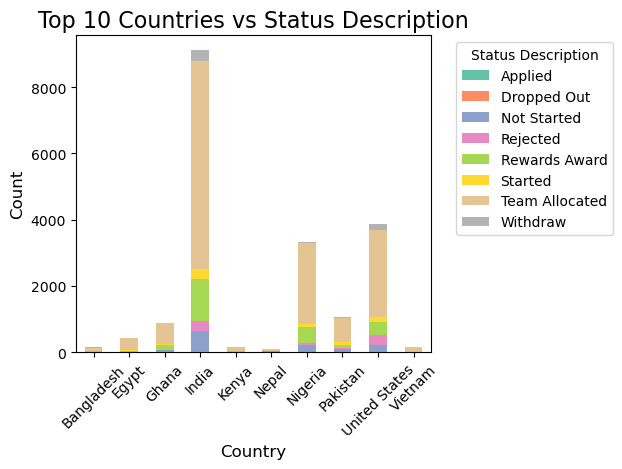

In [239]:

# 1. Calculate the total counts for each country
country_counts = opportunities['Country'].value_counts()

# 2. Select the top 10 countries based on total counts
top_10_countries = country_counts.nlargest(10).index

# 3. Create a crosstab for only the top 10 countries
crosstab_result = pd.crosstab(opportunities[opportunities['Country'].isin(top_10_countries)]['Country'], 
                              opportunities['Status Description'])

# 4. Plotting with a more distinct color palette
plt.figure(figsize=(10, 6))
colors = sns.color_palette('Set2', n_colors=crosstab_result.shape[1])

# Plotting the crosstab result as a stacked bar plot
crosstab_result.plot(kind='bar', stacked=True, color=colors)

# Customize the plot
plt.title('Top 10 Countries vs Status Description', fontsize=16)
plt.xlabel('Country', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45)
plt.legend(title='Status Description', bbox_to_anchor=(1.05, 1), loc='upper left')  # Move legend outside
plt.tight_layout()  # Adjust layout to prevent clipping
plt.show()


In [240]:
# Total, unique, duplicate, and missing Profile IDs
print(f"Total Profile IDs: {opportunities['Profile Id'].count()}")
print(f"Unique Profile IDs: {opportunities['Profile Id'].nunique()}")
print(f"Duplicate Profile IDs: {opportunities['Profile Id'].duplicated().sum()}")
print(f"Missing Profile IDs: {opportunities['Profile Id'].isna().sum()}")

# Display duplicate Profile IDs (if any)
duplicates = opportunities[opportunities.duplicated('Profile Id')]
if not duplicates.empty:
    print("Duplicate Profile IDs:")
    print(duplicates)
else:
    print("No duplicate Profile IDs found.")

Total Profile IDs: 20257
Unique Profile IDs: 11435
Duplicate Profile IDs: 8822
Missing Profile IDs: 0
Duplicate Profile IDs:
                                 Profile Id                  Opportunity Id  \
16     a83abad6-db1e-44c4-a8f4-9e397e282d73  00000000-0GT8-HCVB-01AE-6QEP8Y   
394    4dedda3e-6cf6-4457-bac2-13dce5764fae  00000000-0GN2-A0AY-7XK8-C5FZPP   
843    a83abad6-db1e-44c4-a8f4-9e397e282d73  00000000-0GN2-A0AY-7XK8-C5FZPP   
844    a85e730a-acd0-487b-a3f8-47a3438bcbff  00000000-0GN2-A0AY-7XK8-C5FZPP   
857    aa20dfc4-c388-42df-aac5-4cc3aea1ec08  00000000-0GN2-A0AY-7XK8-C5FZPP   
...                                     ...                             ...   
20317  f386224b-4b64-4d70-a6c5-8d90e3653925  00000000-101Y-HSX2-0DFJ-QCKQBR   
20318  f398b382-ac7a-4b14-8f76-cd41a51b1459  00000000-101Y-HSX2-0DFJ-QCKQBR   
20319  f476e230-266d-491b-a693-f3f3bccac7d6  00000000-101Y-HSX2-0DFJ-QCKQBR   
20320  f92acfd4-3888-447a-a6dd-f996544eebbb  00000000-101Y-HSX2-0DFJ-QCKQBR   
20321 

In [241]:
# Distribution summary of Status Description
status_counts = opportunities['Status Description'].value_counts()
print(status_counts)

Status Description
Team Allocated    14153
Rewards Award      2514
Not Started        1323
Started             809
Rejected            725
Withdraw            620
Applied              89
Dropped Out          24
Name: count, dtype: int64


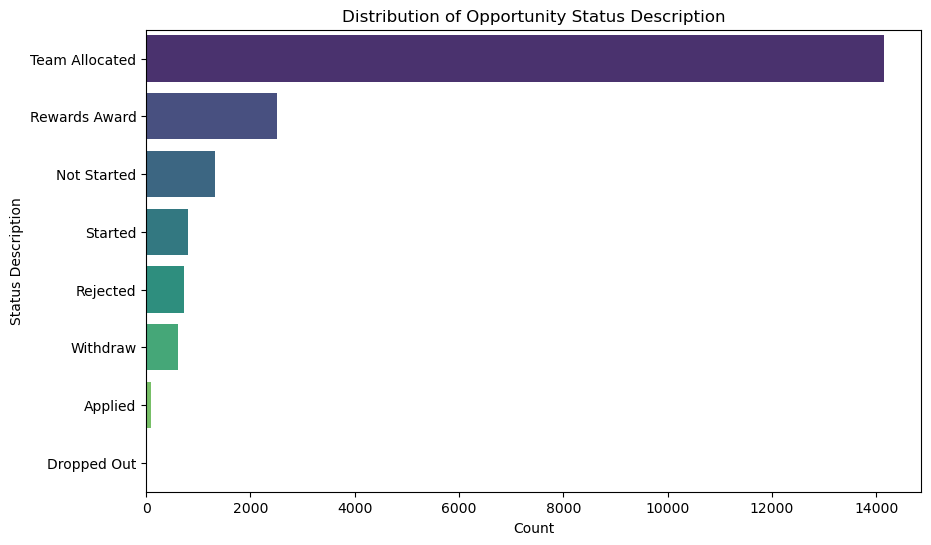

In [242]:
# Plot the distribution of Status Description
plt.figure(figsize=(10, 6))
sns.countplot(y='Status Description', data=opportunities, palette='viridis', order=status_counts.index)
plt.title('Distribution of Opportunity Status Description')
plt.xlabel('Count')
plt.ylabel('Status Description')
plt.show()


C:\Users\vamsh\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


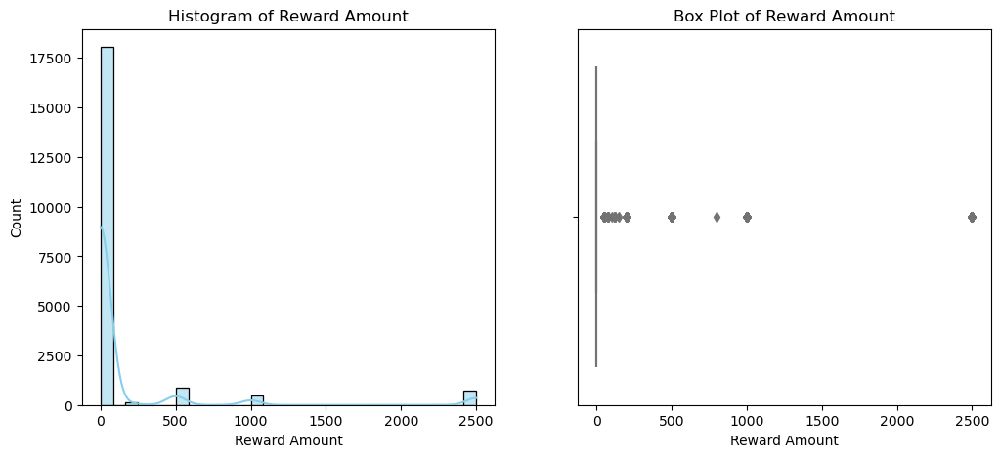

In [245]:
# Plot histograms and box plots for numerical columns
numerical_cols = opportunities.select_dtypes(include=['float64', 'int64']).columns

for col in numerical_cols:
    plt.figure(figsize=(12, 5))
    
    # Histogram
    plt.subplot(1, 2, 1)
    sns.histplot(opportunities[col], kde=True, bins=30, color='skyblue')
    plt.title(f'Histogram of {col}')
    
    # Box Plot
    plt.subplot(1, 2, 2)
    sns.boxplot(x=opportunities[col], color='lightgreen')
    plt.title(f'Box Plot of {col}')
    
    plt.show()


In [248]:
# Display frequency counts for categorical columns
categorical_cols = opportunities.select_dtypes(include=['object']).columns

for col in categorical_cols:
    print(f"---- {col} ----")
    print(f" unique: {opportunities[col].nunique()}")
    print(opportunities[col].value_counts())
    print()


---- Profile Id ----
 unique: 11435
Profile Id
18e1e6bc-fada-4b09-bf52-ab45daf318f4    22
c2245f7e-2e9d-42c9-b5af-550be9eae1c8    22
d01a98bd-90af-4314-91fc-f31e0a0b6b5d    21
f8ee2854-73b4-4e75-9a11-62e4e9e52a5a    21
19ce6f4c-215c-412e-9e29-f09d6f5a4422    21
                                        ..
924c95a3-ab33-4a5e-aed4-bc0d8037a570     1
9130ef55-cad6-4800-ae82-0cf27a219c03     1
92a5d226-162e-464d-a63c-a38d8c5a42c9     1
921f1d78-e656-4c69-bb6d-f6c454317449     1
e96426e4-0ab2-4c4f-b260-6fb5c8d66656     1
Name: count, Length: 11435, dtype: int64

---- Opportunity Id ----
 unique: 33
Opportunity Id
00000000-0GWQ-AXC5-X45C-2MHJ28    5668
00000000-0GHB-4N83-QX9K-JM48K2    3896
00000000-0GNT-FT74-MZT8-93VC0G    2469
00000000-0GRA-BD28-CXVV-EYEX21    1541
00000000-0GZY-NNHV-FJWW-PTA9VX    1311
00000000-0GN2-A0AY-7XK8-C5FZPP    1239
00000000-10EY-Y8NM-6HJ1-2D6SR5     518
00000000-10WC-BS50-CYGD-X97ES4     460
00000000-10DC-SM71-JHK7-WD6F3R     421
00000000-107Q-A346-MCS2-D7FE69     

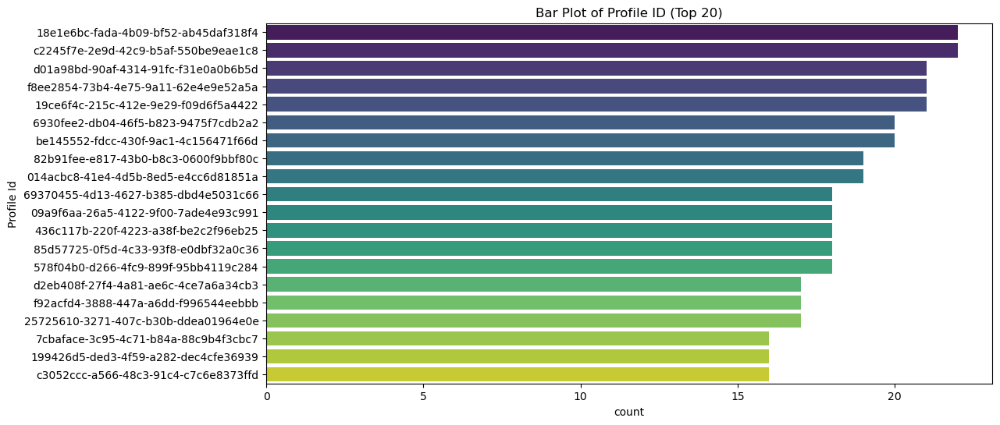

In [250]:
plt.figure(figsize=(12, 6))
sns.countplot(y='Profile Id', data=opportunities, order=opportunities['Profile Id'].value_counts().index[:20], palette='viridis')
plt.title('Bar Plot of Profile ID (Top 20)')
plt.show()


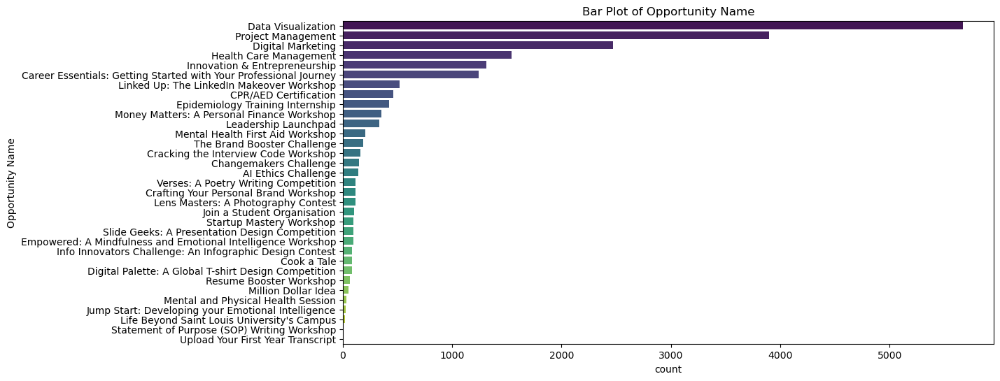

In [251]:
plt.figure(figsize=(12, 6))
sns.countplot(y='Opportunity Name', data=opportunities, palette='viridis', order=opportunities['Opportunity Name'].value_counts().index)
plt.title('Bar Plot of Opportunity Name')
plt.show()

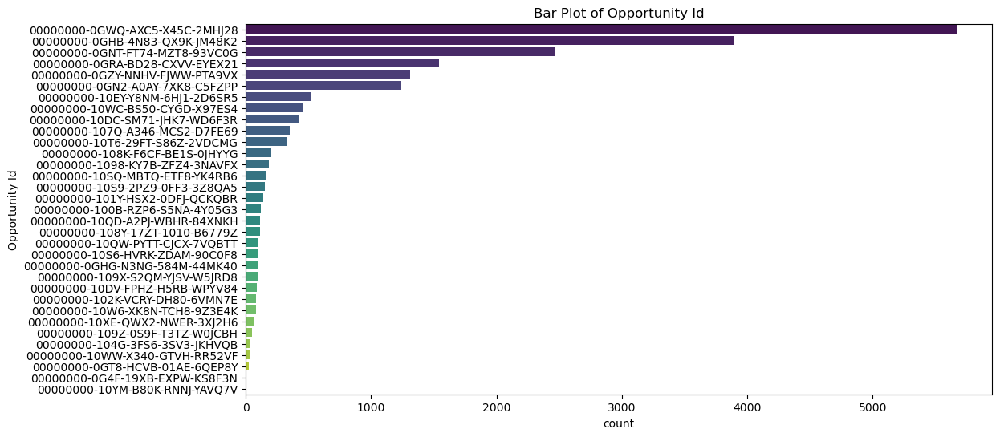

In [252]:
plt.figure(figsize=(12, 6))
sns.countplot(y='Opportunity Id', data=opportunities, palette='viridis', order=opportunities['Opportunity Id'].value_counts().index)
plt.title('Bar Plot of Opportunity Id')
plt.show()

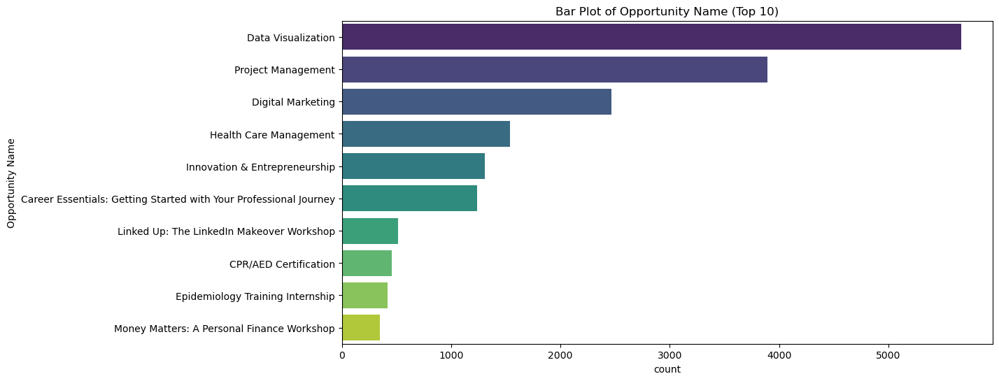

In [253]:
plt.figure(figsize=(12, 6))
sns.countplot(y='Opportunity Name', data=opportunities, order=opportunities['Opportunity Name'].value_counts().index[:10], palette='viridis')
plt.title('Bar Plot of Opportunity Name (Top 10)')
plt.show()


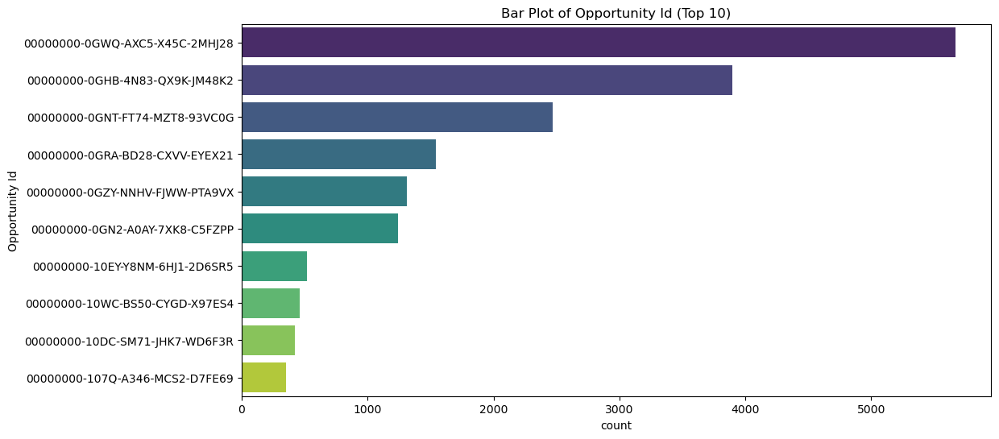

In [254]:
plt.figure(figsize=(12, 6))
sns.countplot(y='Opportunity Id', data=opportunities, order=opportunities['Opportunity Id'].value_counts().index[:10], palette='viridis')
plt.title('Bar Plot of Opportunity Id (Top 10)')
plt.show()

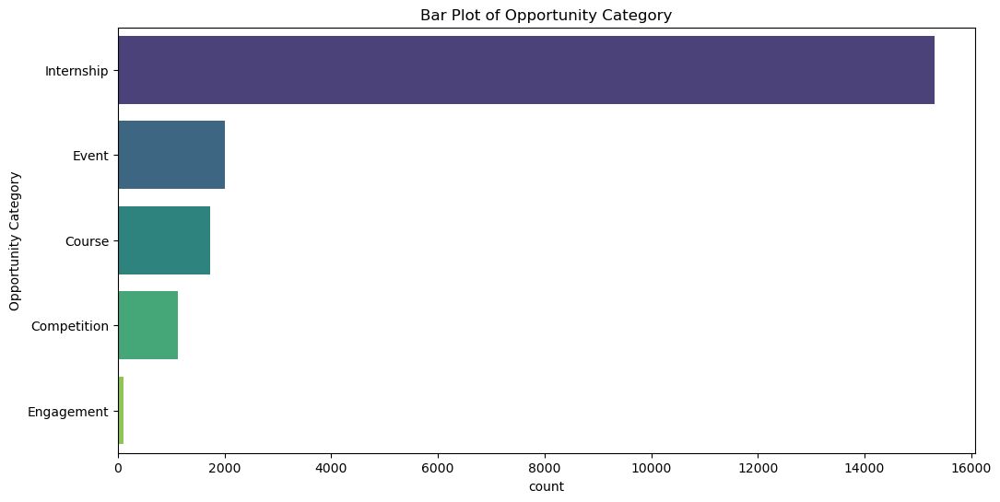

In [255]:
plt.figure(figsize=(12, 6))
sns.countplot(y='Opportunity Category', data=opportunities, palette='viridis', order=opportunities['Opportunity Category'].value_counts().index)
plt.title('Bar Plot of Opportunity Category')
plt.show()


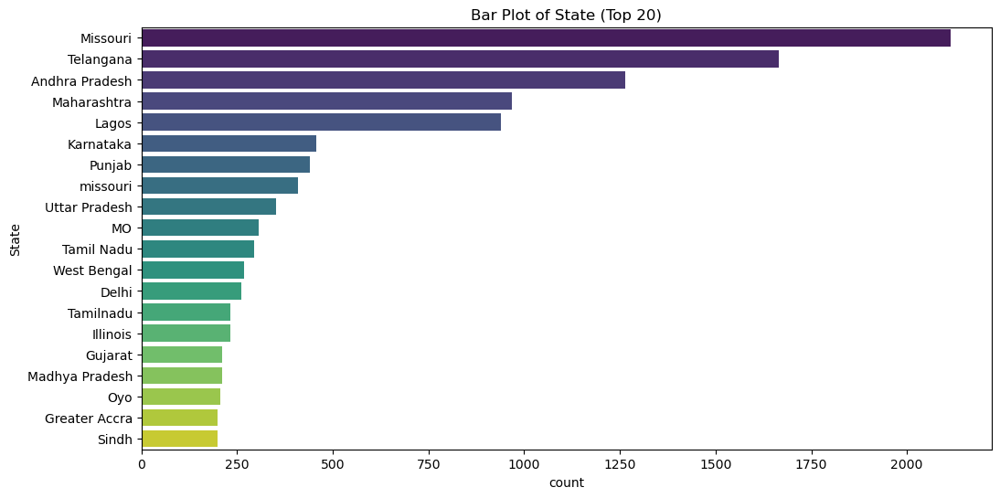

In [256]:
plt.figure(figsize=(12, 6))
sns.countplot(y='State', data=opportunities, order=opportunities['State'].value_counts().index[:20], palette='viridis')
plt.title('Bar Plot of State (Top 20)')
plt.show()


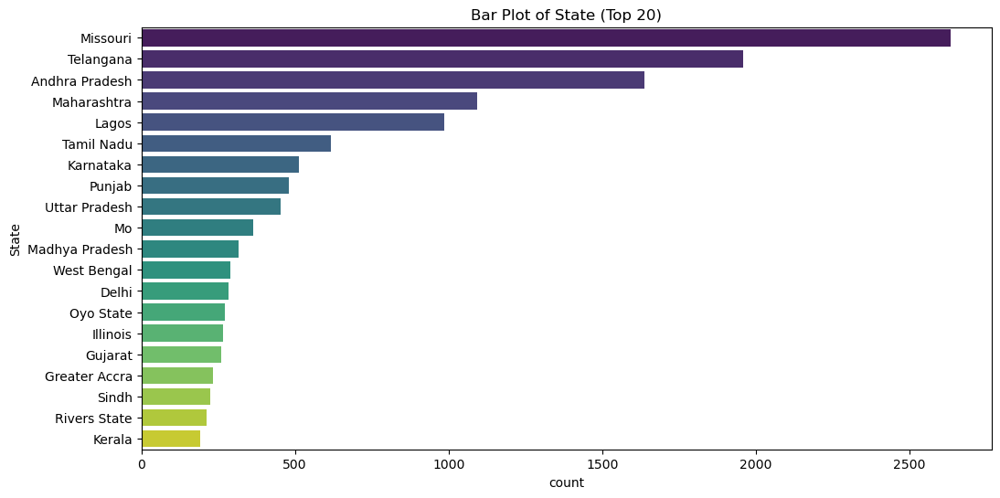

State
Missouri          2635
Telangana         1959
Andhra Pradesh    1637
Maharashtra       1093
Lagos              986
Tamil Nadu         616
Karnataka          512
Punjab             480
Uttar Pradesh      452
Mo                 365
Madhya Pradesh     315
West Bengal        290
Delhi              283
Oyo State          271
Illinois           267
Gujarat            261
Greater Accra      234
Sindh              224
Rivers State       212
Kerala             190
Name: count, dtype: int64


In [259]:
# Capitalize all values in the 'State' column
opportunities['State'] = opportunities['State'].str.title()

# Plot the bar plot with the top 20 states
plt.figure(figsize=(12, 6))
sns.countplot(y='State', data=opportunities, order=opportunities['State'].value_counts().index[:20], palette='viridis')
plt.title('Bar Plot of State (Top 20)')
plt.show()
print(opportunities['State'].value_counts().head(20))

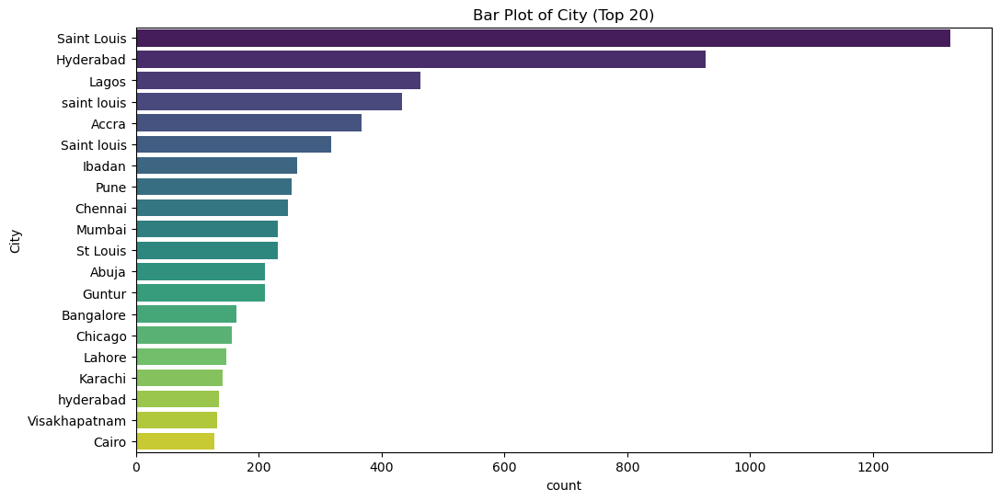

City
Saint Louis      1326
Hyderabad         928
Lagos             464
saint louis       433
Accra             368
Saint louis       318
Ibadan            262
Pune              253
Chennai           247
Mumbai            232
St Louis          232
Abuja             211
Guntur            210
Bangalore         164
Chicago           157
Lahore            147
Karachi           141
hyderabad         136
Visakhapatnam     132
Cairo             128
Name: count, dtype: int64


In [261]:
plt.figure(figsize=(12, 6))
sns.countplot(y='City', data=opportunities, order=opportunities['City'].value_counts().index[:20], palette='viridis')
plt.title('Bar Plot of City (Top 20)')
plt.show()
print(opportunities['City'].value_counts().head(20))

In [45]:
# Define the dictionary with all preferred names and their corresponding variations
replacement_dict = {
    "St Louis": ["St Louis", "St. Louis", "Saint Louis", "St.louis", "Stlouis","saint lousis","Saint Louis","Saintloui","SaintLouis","Saint Louis","Saint Louis", "Saint Louis c", "Saint Louis city","Saint Louis I","Saint louis university"],
    "Hyderabad": ["Hyderabad", "Hydrabad", "hyd",'Hyd'],
    "Kolkata": ["Kolkata", "Calcutta", "Kolkata City"],
    "Mumbai": ["Mumbai", "Bombay", "Mumbai City"],
    "New Delhi": ["New Delhi", "New dehi", "Delhi", "Delhi City","NewDelhi",'delhi','Dehi',"New delhi","New delhi", "New dehi"],
    "Bangalore": ["Bangalore", "Bengaluru","Bengaluru", "Bangalore", "Bengaluru City",'Bengaluru Urban','Bengaluru city','bengaluru','Bengalore',
                 'Bangalore Urban','Bangaluru','Bangalore','Bangalore Urban'],  
    "Chennai": ["Chennai", "Madras", "Chennai City"],
    "Pune": ["Pune", "Pun"],
    "Jaipur": ["Jaipur", "Jaypur"],
    "Ahmedabad": ["Ahmedabad", "Ahemdabad"],
    "Lucknow": ["Lucknow", "Lucknow City"],
    "Chandigarh": ["Chandigarh", "Chandigarh City"],
    "Gurugram": ["Gurugram", "Gurgaon"],
    "Thiruvananthapuram": ["Thiruvananthapuram", "Trivandrum"],
    "Coimbatore": ["Coimbatore", "Kovai"],
    "Visakhapatnam": ["Visakhapatnam", "Vizag"],
    "Bhopal": ["Bhopal", "Bhopal City"],
    "Patna": ["Patna", "Patna City"],
    "Surat": ["Surat", "Surat City"],
    "Nagpur": ["Nagpur", "Nagpur City"],
    "Vadodara": ["Vadodara", "Baroda"],
    "Kochi": ["Kochi", "Cochin"],
    "Indore": ["Indore", "Indore City"],
    "Nashik": ["Nashik", "Nashik City"],
    "Agra": ["Agra", "Agra City"],
    "Mysore": ["Mysore", "Mysuru"],
    "Jodhpur": ["Jodhpur", "Jodhpur City"],
    "Dehradun": ["Dehradun", "Dehra Dun"],
    "Raipur": ["Raipur", "Raipur City"],
    "Noida": ["Noida", "Noida City"],
    "Amritsar": ["Amritsar", "Amritsar City"],
    "Varanasi": ["Varanasi", "Benares"],
    "Ranchi": ["Ranchi", "Ranchi City"],
    "Agartala": ["Agartala", "Agartalla"],
    "Guwahati": ["Guwahati", "Guwahati City"],
    "Shillong": ["Shillong", "Shilong"],
    "Dispur": ["Dispur", "Dispur City"],
    "Gangtok": ["Gangtok", "Gangtok City"],
    "Imphal": ["Imphal", "Imphal City"],
    "Kohima": ["Kohima", "Kohima City"],
    "Itanagar": ["Itanagar", "Itanagar City"],
    "Aizawl": ["Aizawl", "Aizwal"],
    "Dimapur": ["Dimapur", "Dimapur City"],
    "Agraharam": ["Agraharam", "Agraharam City"],
}

# Apply the replacement using the dictionary
opportunities['City'] = opportunities['City'].replace(
    {variation: preferred for preferred, variations in replacement_dict.items() for variation in variations}
)


In [46]:
# Define the dictionary with all preferred names and their corresponding variations
replacement_dict = {
    "Yaound": ["Yaound", "Yaounde"],
    "Yamuna nagar": ["Yamuna nagar", "Yamunanagar"],
    "Washington": ["Washington DC", "Washington"],
    "warangal": ["warangal", "waranagal", "WARANGAL URBAN","Waranagal",'Warangal Urban'],
    "wah cantt": ["wah cantt", "Wahcantt"],
    "Vishakhapatnam": [
        "Visakhapatnam", "Visakhapatanam", "Vishakapatnam", 
        "Vishakapatnam", "Vishkapatnam","Visakhapatnam","Visakhapatnam","Visakhapatanam","Vishakhapatanam"
    ],
    "Vijayapura": ["Vijayapura", "Vijayapur a", "Vijayapur"],
    "VASAI VIRAR": ["VASAI VIRAR", "vasai"],
    "Varanasi": ["Varanasi", "Varnasi", "Vanarasi"],
    "Vissanapet":["vissannapeta"],
    "Thanjavur":["thanjauvr"],
    "Tiruppur": ["Tiruppur", "Tirupur"],
    "Tirupathi": ["Tirupathi", "Tirupati"],
    "Tiruchirapalli": ["Tiruchirapalli", "Tiruchirappalli"],
    "Thu Duc": ["Thu Duc city", "Thu Duc"],
    "Thiruvananthapuram": [
        "Thiruvananthapuram", "thiruvanthapuram"
    ],
    'Lagos':['Lagos city','Lagos I','Lagos state'],
    "Sunnyvale":["Sunnyvale Junction by Lokogoma Abuja Nigeria"],
    "St Louis": [
        "St Louis", "St Loius", "St Louise", "St Louis", 
        "saint lousis", "Saintloui", "SaintLouis", 
        "Saint Louis", "Saint Louis", "Saint Louis c", 
        "Saint Louis city", "Saint Louis I", "Saint louis university", 
        "saint lousis","ST","STL"
    ],
    "Srinagar": ["Srinagar", "Srinager"],
    "Siricilla": ["Siricilla", "Sircilla"],
    "Sheikhupura": ["Sheikupura", "sheikhupura","Sheikupura"],
    "Shebin Elkom": ["Shebin Elkom", "Shebin el kom", "Shebin"],
    "Shagam": ["Shagam", "Shagamu"],
    "secunderabad": ["secunderabad", "Secunderab"],
    "Sattenapalli": ["Sattenapalli", "Sattenalalle", "Sattenpalli"],
    "Sathupalli": ["Sathupalli", "Sathupally",'Sattenapalle'],
    "Satellite": ["Satellite", "satellite town"],
    "Sango otta": ["Sango otta", "Sango ota", "Sango"],
    "Sangareddy": ["Sangareddy", "Sangareddi", "Sagareddy"],
    "Sango Ota":["Sango Ota","SangoOta"],
    "Rangpur": ["Rangpur", "Rangpur City Corporation"],
    "Rajampeta": ["Rajampeta", "Rajampet"],
    "Rajahmundry": ["Rajahmundry", "Rajahymundry"],
    "Punjab":["Punjab Lahore","Panjab"],
    "Pune": ["Pune", "Pune City"],
    "Preston": ["Preston", "Preston I"],
    "Phoenix":["Phoenix Milnerton"],
    "Pindi":["Pindi Gheb"],
    "Peddapalli":["Peddpalli"],
    'Greater Noida':['Greater Noida West','GreaterNoida'],
    'Festac Town':['FestacTown','Festac'],
    'Enugu City':['enugu'],
    'Eluru city':['eluru'],
    
    "Prakasham District": ["Prakasham District", "prakasham","prakasam","Prakasam District"],
    
    "Port Hacourt": ["Porthacourt city", "Porthacourt", "Porthaco", "Porthacourt","Porthacourt city","Port Hacourt", "Port Harcourt","Port Harcourt I",
                    "Port Harcourt city","port harcourt","Portharcourt city","Portharco","Portharcourt","Portharcourt city"],
    "Pithoragarh": ["Pithoragarh", "Pithoragarh"],
    "Nizamabad District": ["Nizamabad District", "Nizamabab", "Nizamabad"],
    "New York": ["New York", "New York m"],
    "Mumbai": [
        "Mumbai", "Mumbai City", "Mumbai City", "Mumbai East", 
        "Mumbai suburban", "Mumhai", "Navi", "Navi mumbai", 
        "NaviMumbai",'Mumbai Suburban'
    ],
    'Miryalguda':['miryalaguda'],
    "Muzaffarpur":['Muzaffarour'],
    "Muzaffargarh":['Muzafferghar'],
    'Maryland':['Maryland Heights'],
    "Narasaraopeta": ["Narasaraopeta", "Narasraopeta", "Narasaraopet",'NARASARAOPET'],
    "Nandyala": ["Nandyala", "Nandyal"],
    "Nairobi city": ["Nairobi city", "Nairobi c", "Nairobi", "Nairobi Municipality",'nairobi'],
    "Mysore": ["Mysore", "Mysuru"],
    "Missouri": ["Missouri", "Missouri City"],
    "Medchal Malkajgiri": [
        "Medchal Malkajgiri", "MEDCHALMALKAJGIRI", "Medchal"
    ],
    "Marrakesh": ["Marrakesh", "Marrakech"],
    "Manuguru": ["Manuguru", "Manugur"],
    "Mangalore": ["Mangalore", "Mangaluru",'mangaluru'],
    "Maidan":["Maidan wardak"],
    "Mahendragarh": ["Mahendragarh", "Mahendergarh"],
    "Madurai": ["Madurai", "Madurai I"],
    "Madhya Pradesh": [
        "Mp", "Mp b", "Madhya Pradesh", "Madhyapradesh", 
        "Madhya pradesh", "Madhya", "M P"
    ],
    'Ho chi minh':['Ho Chi Minh City'],
    'Hanmakonda':['Hanamakonda','hanamkonda'],
    "Nizamabad":["nizamabad","Nizamabad District"],
    "Owode":["Owode Yewda"],
    "Overland":["Overland park"],
    "Ojoddu":["Ojodu Berger"],
    "Obuase":["Obuasi"],
    "Islamabad": ["Islamabad", "Islamabad Capital Territory", "islamabad", "Islam"],
    "Imo": ["Imo", "Imo s"],
    "Illinois": ["Illinois", "ill", "Illinios", "illionis", "Illnois"],
    'Kumasi':['Kumasi Ghana'],'Katsina':['Katsina city'],'kano':['Kano city'],
    'Kubwa':['Kubwa Bwari'],'Kanchipuram':['Kancheepuram'],'Kalyan':['Kalyan West'],'Kamareddy':['Kammareddy'],
    'Kotri':['Kotri hyderabad'],'Kota':['Kota Parepare'],'Kisii':['Kisi'],'Kalamboli':['Kalamboli Node'],
    'Kaduna':['Kaduna north'],'Jos':['Jos south'],'Jimeta':['Jimete'],'jhang':['Jhang city'],
    'Jayashankar Bhupalapally':['Jayashankar bhupalpally'],'Jangamreddigudem':['Janagareddiguddem'],
    'Jackson':['Jacksonville'],'Jagityal':['JAGITIAL'],'Illorin':['Illorin west'],'Ijebu Ode':['Ijebu Oe'],
    'igando':['igando New Town'],'Ifeako':['Ifako Ijaiye'],'Ibeju':['Ibeju Lekki'],'ibadan':['Ibadan city'],
    "Hyderabad": ["Hyderabad", "Hydrabad", "hyd"],
    "Hoang Mai": ["Hoang Mai", "Hoangmai"],
    "Ho Chi Minh City": ["Ho Chi Minh", "Ho Chi Minh City"],
    "Haryana": ["Harayana", "Haryan", "Haryana", "Haryans"],
    "Gujarat": ["GUJARAT", "Gujrat"],
    "Giza Governorate": ["Giza", "Giza Governorate"],
    "Gilgit Baltistan": ["Gilgit", "Gilgit Baltistan"],
    "Free State": ["Free State", "FreeState"],
    "Federal Capital Territory": [
        "Federal capital territory", "Federal Capital Territory", 
        "Federal", "Federal State", "Fedral"
    ],
    "Dhaka": [
        "dhaka", "Dhaka City", "Dhaka Division", "Dhaka North"
    ],
    "Delta State": ["Delta State", "Delta state Nigeria", "Delta"],
    "Delhi": ["Delhi", "DelhuDel"],
    "Damietta": ["Damietta", "dameitta"],
    "Dakahliya": ["Dakahliya", "Dakahlia"],
    'Cooch Behar':['COOCHBEHAR'],
    "Cross River State": ["Cross River State", "Cross River"],
    "Chhattisgarh": ["Chhattisgarh", "Chattisghar", "Chattisgarh"],
    "Central Province": [
        "Central province", "Central", "Center", "Central region"
    ],
    "Capital Territory": ["Capital Territory", "Capial territory", "Capital"],
    "Can Tho": ["Cantho", "Can Tho"],
    'Bhubaneshwar':['bhubaneswar'],
    'BHONGHIR':['Bhongir'],
    'Berhampore':['Berhampur'],
    'Beni':['Beni suef'],'Benin City':['BENIN','Benin c'],
    "Borno State": ["Borno state", "Borno"],
    "Benue State": ["Benue state", "Benue"],
    "Bauchi": ["Baluchi state", "Bauchi",'Bauchi state'],
    "Bahawalpur": [
        "Bahawalpur", "Bahawal pur", "Bahwalpur", "bahawalnagr"
    ],
    "Bagmati Province": [
        "Bagmati State", "Bagmati", "Bagmati Province", "Bagamati Province"
    ],
    "Assiut": ["Assuit", "Assiut"],
    "Ashanti Region": ["Ashante Region", "Ashanti", "Ashanti Region"],
    "Andhra Pradesh": [
        "Andrapradesh", "Andra Pradesh", "ANDHRAPRADESH", 
        "Andhra pradesh", "Andhra Pradesh state", "Andhra Pradesh", 
        "Andhra", "Andhrapradesh","ANDHRA PRADESH"
    ],
    "Andaman and Nicobar Islands": ["Andaman and Nicobar Islands", "Andaman"],
    "Anambra State": ["Anambra state", "Anambra"],
    "Amhara Region": ["Amhara Region", "Amhara"],
    "Alexandria": ["Alexanderia", "Alexandria", "Alexandr", "Alex"],
    "Al Gharbia": ["Al Gharbia", "Al Gharbiya"],
    "Akwa Ibom State": ["Akwa Ibom state", "Akwaiborn", "Akwa Ibom state"],
    "Awka":["Awka North"],
    'Ananthapur':['Anantapur'],
    'Akure':['Akure City'],
    'Ado Ekiti':['ADO'],
    "Ain Shams": ["Ain shams", "Ain"],
    "Addis Ababa": ["Addis Abeba", "addis ababa"],
    "Adamawa State": ["Adamawa state", "Adamawa"],
    "Abuja": [
        "Abuja Federal Capital Territory", "Abuja Federal Capital Territor", 
        "Abuja FCT", "Abuja Capital Territory", "Abuja"
    ],
    "Abia State": ["Abia State", "Abia"],
    'Accra':['Acc'],'Abeokuta city':['abeokuta'],
    'Abakaliki':['Abakaliki Ebonyi'],
}

# Apply the replacement using the dictionary
opportunities['City'] = opportunities['City'].replace({v: k for k, vs in replacement_dict.items() for v in vs})


In [47]:
replacement_dict = {
    'Accounting':['ACCOUNTING','Accounts'],
    'Actuarial Sciences':['Actuarial Sceence','Actuarial Science'],
    'Agricultural and Resources Economics':['Agricultural and Resource Economics'],
    'Agricultural Engineering':['Agricultural Eng'],
    'Agricultural Science and Education':['Agricultural Science Education'],
    'Analyst':['ANALYTICS'],
    'Animal Sciences':['Animal Science'],
    'Artificial Intelligence':['Artifical Intelligence','Artificial Intelligent'],
    'Automobile Engineering':['Automotive Engineering'],
    'Aviation Management':['Aviaton Management'],
    'Bachelors Degree':['Bachelor','Bachelor in','Bsc'],
    'Big Data':['Big Data Analytics'],
    'Bioinformatics':['Bioinformatic'],
    'Biomedical Sciences':['Biomedical Science'],
    'Bsc in Computer Science':['BSC CS'],
    'Building Technology':['Building Tech'],
    'Business Analytics':['Business Analysis','Business Analyst','Businessanalytics'],
    'Clinical Pharmacy':['Clinical Pharmacy D'],
    'Commerce':['Com'],
    'Communication and Language Arts':['Communication and Arts Education'],
    'Comunity Health':['Community Health Officer'],
    'Computer and Information Sciences':['Computer and Information Sciencess','Computer and Infromation Sciences'],
    'Computer Engineering':['Computer Engineer','Computer Enginnering'],
    'Computer Science':['Computer Sci Edu','Computer Science Education'],
    'Computer Science and Business System':['Computer Science and Business Systems'],
    'Computer Science and Engineering':['Computer Science and Engineerin','Computer Science Engineering','Cse'],
    'Data Analytics':['Data','Da','Data An','Data Analysis','Data Analyst','Data Analysis'],
    'Data Science and Business Analytics':['Data Science and Business Analysis'],
    'Data Science':['Datascience','Datascientis'],
    'Digital Marketing':['Digital Marketer'],
    'Diploma':['Diploma Student'],
    'Doctor':['Do'],
    'Economics':['Economic','Economy'],
    'Electrical Engineerin':['Electrical Engineer'],
    'Electronic and Telecommunications':['Electronic and Telecommunication','Electronics and Telecommunications'],
    'Engineering':['engineer'],
    'Engineering Physics':['Engineers Physics'],
    'English and literature':['English Language andLiterature'],
    'Environmental Sciences':['Environmental','Environmental Science'],
    'Enterpreneurship':['Enterpreneurship Studies'],
    'Environmental Health Sciences':['Environmental Health Science'],
    'Estate Management':['Estate Managenent'],
    'Food Tech':['Foodtechnology'],
    'Forensic Science':['Forensic','Forensic Sci'],
    'Health Data Science':['Health Data Sci'],
    'Health Information Management':['Health Inforation Man'],
    'Health Sciences':['Health Science'],
    'High School':['high school/dual enrollment non degree','High School Graduate','High School Stem Student','HighSchool Student'],
    'Human Resources':['Human Resource'],
    'Information technology and management':['Information technology Management'],
    'Information technology':['Informationtechnology'],
    'Management and Accounting':['Management and Account'],
    'Management Sciences':['Management Science'],
    'No Major':['Nil','Nill','No','Non','Nomajor','Not Applicable','Not Chosen','Not Know Ab','Not Sure','Nothing','I Dont Have Any Idea About This'],
    'Others':['Oth','Ot','Othe','Other','Otheraassss'],
    'Political Science':['Pol'],
    'Product Management':['Product Manager'],
    'Science Laboratory Technology':['Science Laboratory Tech'],
    'Social Media Manager':['Social Media  Management'],
    'Statistics and Computer Science':['Statistics and Computeri Science'],
    'Supply Chain Management':['Supply Chain Managent'],
    'Telecommunication':['Telecom'],
    'Textile Engineering':['Textile Engineerng'],
    'Undecided':['Undicided','Unemployed','Unknown','Unsure'],
    'Web Development':['Web','Web Dev'],
}

# Apply the replacement using the dictionary
opportunities['Current/Intended Major'] = opportunities['Current/Intended Major'].replace({v: k for k, vs in replacement_dict.items() for v in vs})


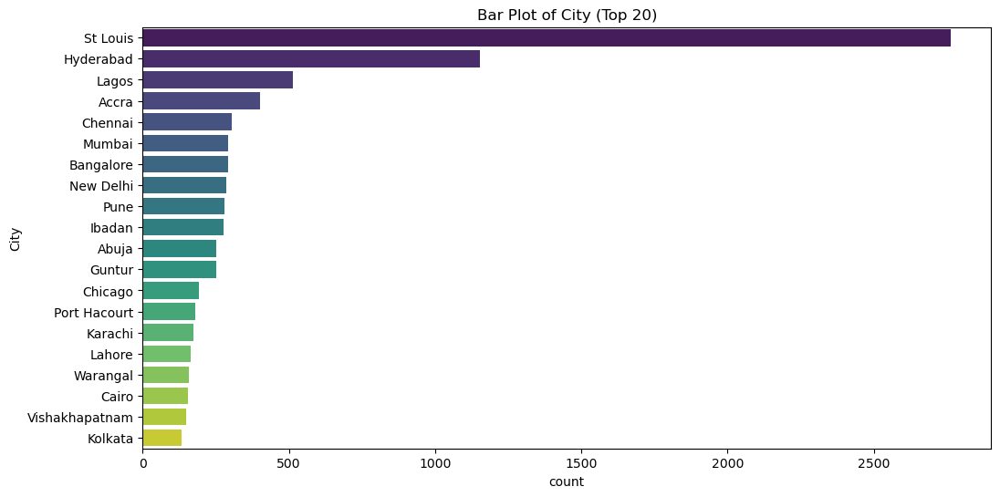

In [78]:
# Capitalize all values in the 'State' column
opportunities['City'] = opportunities['City'].str.title()

# Plot the bar plot with the top 20 states
plt.figure(figsize=(12, 6))
sns.countplot(y='City', data=opportunities, order=opportunities['City'].value_counts().index[:20], palette='viridis')
plt.title('Bar Plot of City (Top 20)')
plt.show()

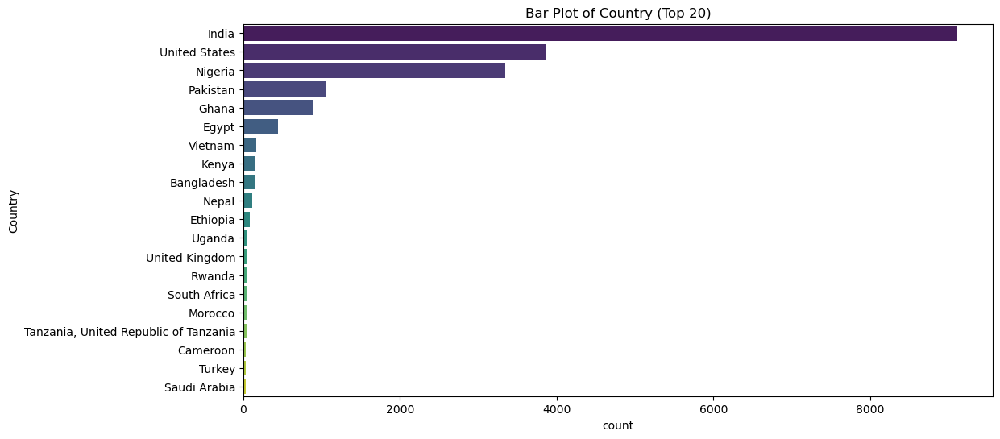

In [265]:
plt.figure(figsize=(12, 6))
sns.countplot(y='Country', data=opportunities, order=opportunities['Country'].value_counts().index[:20], palette='viridis')
plt.title('Bar Plot of Country (Top 20)')
plt.show()


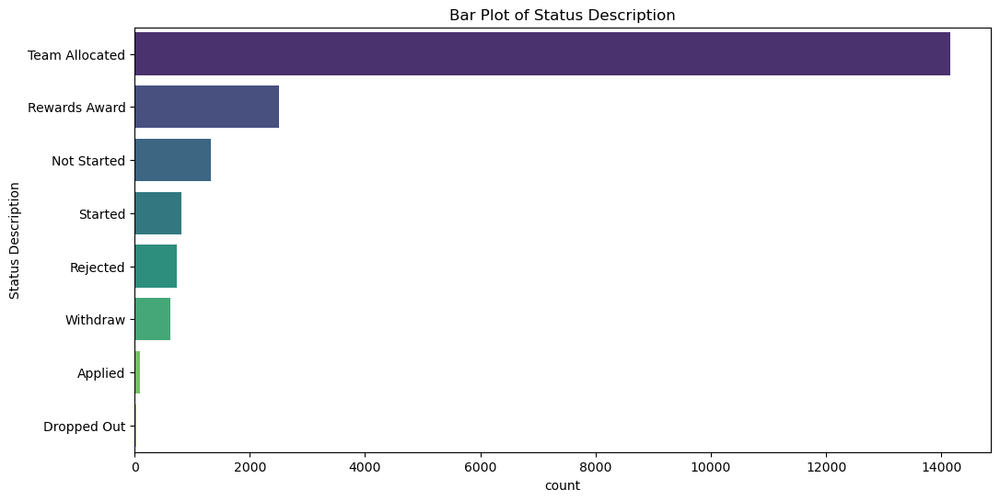

In [266]:
plt.figure(figsize=(12, 6))
sns.countplot(y='Status Description', data=opportunities, palette='viridis', order=opportunities['Status Description'].value_counts().index)
plt.title('Bar Plot of Status Description')
plt.show()


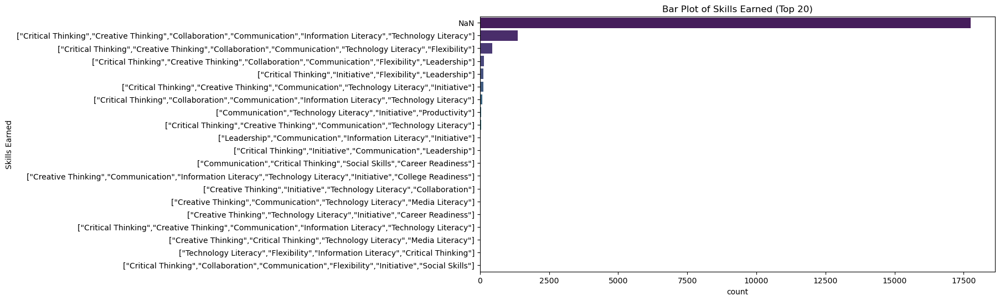

In [267]:
plt.figure(figsize=(12, 6))
sns.countplot(y='Skills Earned', data=opportunities, order=opportunities['Skills Earned'].value_counts().index[:20], palette='viridis')
plt.title('Bar Plot of Skills Earned (Top 20)')
plt.show()


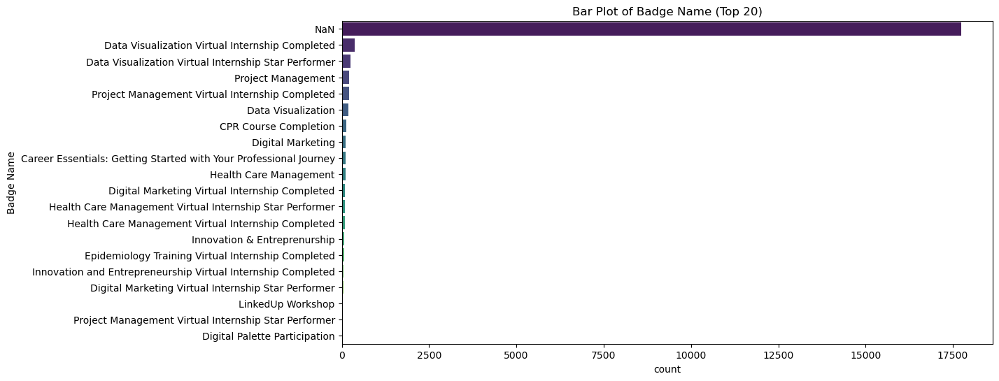

In [268]:
plt.figure(figsize=(12, 6))
sns.countplot(y='Badge Name', data=opportunities, order=opportunities['Badge Name'].value_counts().index[:20], palette='viridis')
plt.title('Bar Plot of Badge Name (Top 20)')
plt.show()


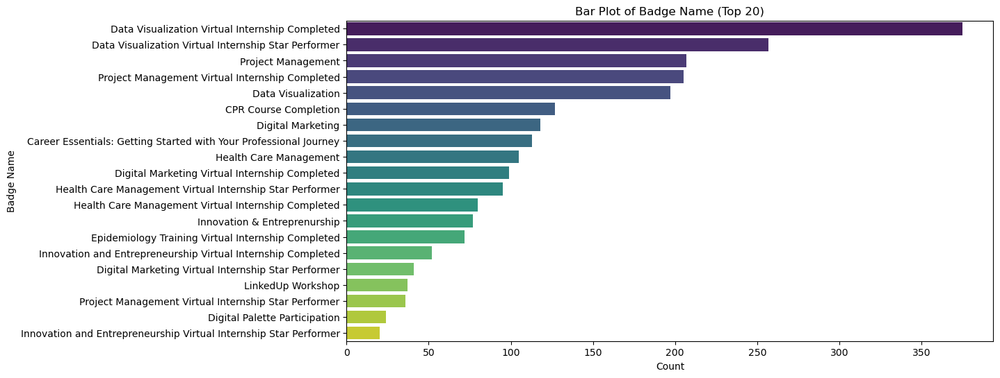

In [269]:
# Filter out rows where 'Badge Name' is NaN or the string 'NaN'
df_filtered_1 = opportunities[(opportunities['Badge Name'].notna()) & (opportunities['Badge Name'] != 'NaN')]

# Create the count plot for the top 20 Badge Names
plt.figure(figsize=(12, 6))
sns.countplot(y='Badge Name', data=df_filtered_1, order=df_filtered_1['Badge Name'].value_counts().index[:20], palette='viridis')
plt.title('Bar Plot of Badge Name (Top 20)')
plt.xlabel('Count')
plt.ylabel('Badge Name')
plt.show()


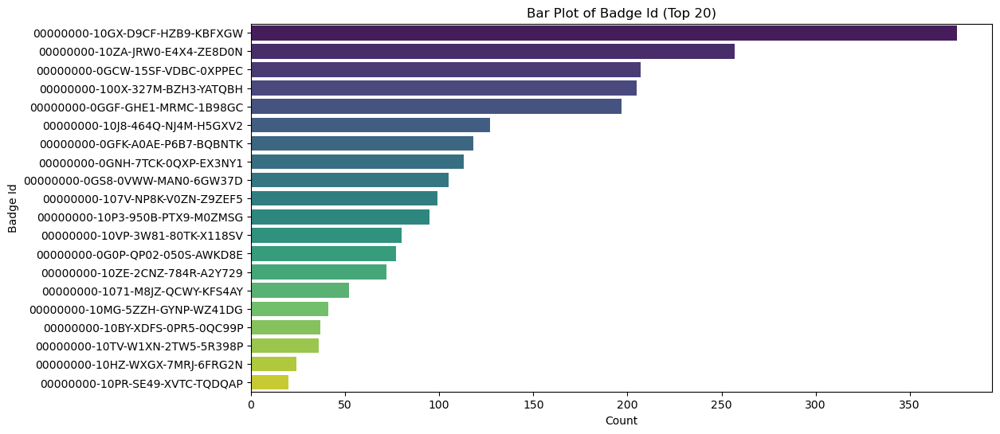

In [270]:

df_filtered = opportunities[(opportunities['Badge Id'].notna()) & (opportunities['Badge Id'] != 'NaN')]

# Create the count plot for the top 20 Badge Id
plt.figure(figsize=(12, 6))
sns.countplot(y='Badge Id', data=df_filtered, order=df_filtered['Badge Id'].value_counts().index[:20], palette='viridis')
plt.title('Bar Plot of Badge Id (Top 20)')
plt.xlabel('Count')
plt.ylabel('Badge Id')
plt.show()

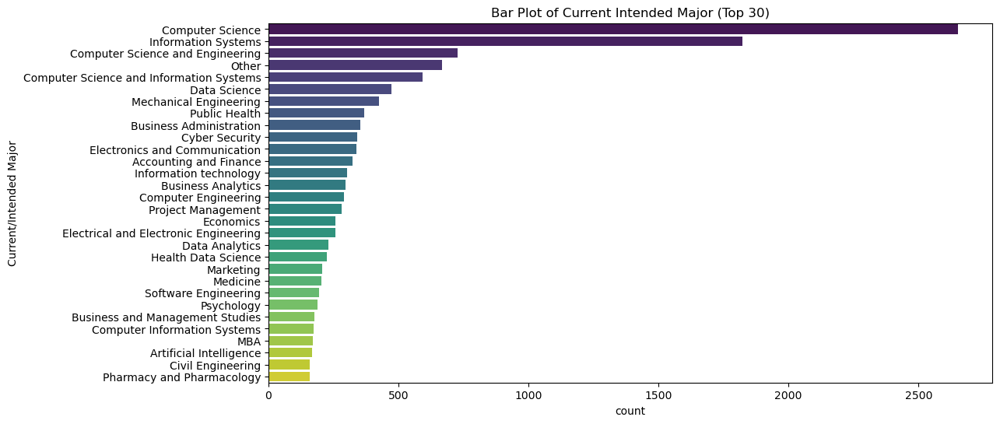

In [271]:
plt.figure(figsize=(12, 6))
sns.countplot(y='Current/Intended Major', data=opportunities, order=opportunities['Current/Intended Major'].value_counts().index[:30], palette='viridis')
plt.title('Bar Plot of Current Intended Major (Top 30)')
plt.show()


In [272]:
plt.figure(figsize=(12, 6))
sns.countplot(data=opportunities, x='Apply Date', order=opportunities['Apply Date'].value_counts().index[:30])  # Show top 30 dates
plt.xticks(rotation=90)
plt.title('Distribution of Apply Dates')
plt.show()

TypeError: Cannot compare Timestamp with datetime.date. Use ts == pd.Timestamp(date) or ts.date() == date instead.

<Figure size 1200x600 with 0 Axes>

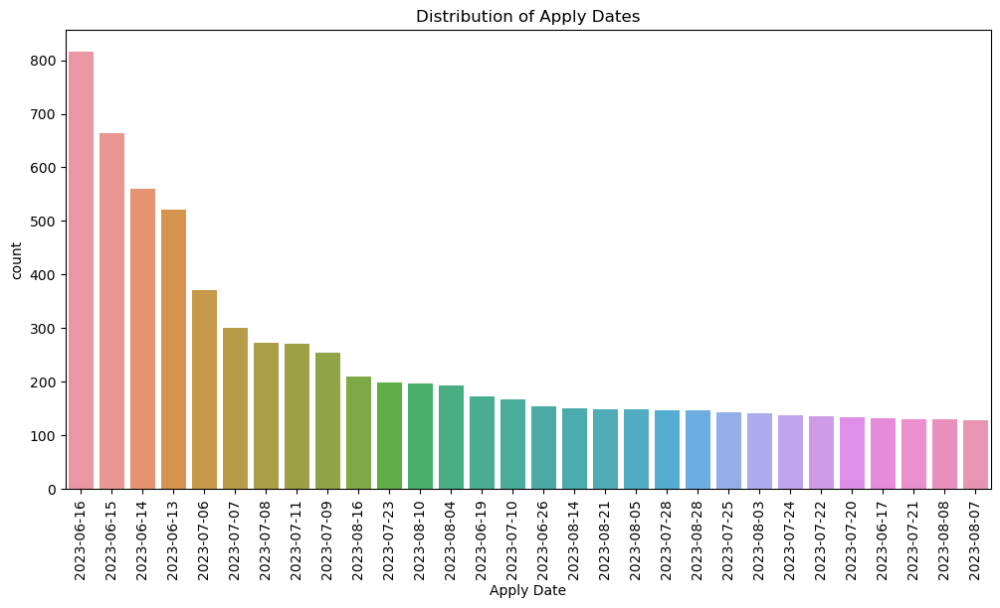

In [274]:
# Ensure 'Apply Date' is in datetime format
opportunities['Apply Date'] = pd.to_datetime(opportunities['Apply Date'], errors='coerce').dt.date

# Now, plot the top 30 dates
plt.figure(figsize=(12, 6))
sns.countplot(data=opportunities, 
              x='Apply Date', 
              order=opportunities['Apply Date'].value_counts().index[:30])  # Top 30 dates
plt.xticks(rotation=90)
plt.title('Distribution of Apply Dates')
plt.show()

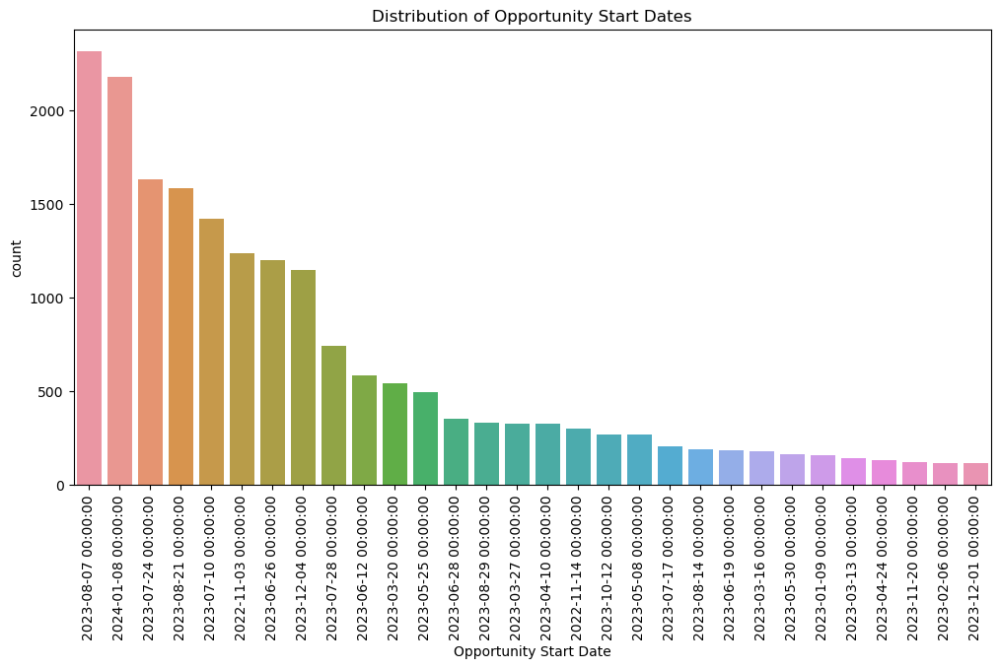

In [275]:
plt.figure(figsize=(12, 6))
sns.countplot(data=opportunities, x='Opportunity Start Date', order=opportunities['Opportunity Start Date'].value_counts().index[:30])
plt.xticks(rotation=90)
plt.title('Distribution of Opportunity Start Dates')
plt.show()


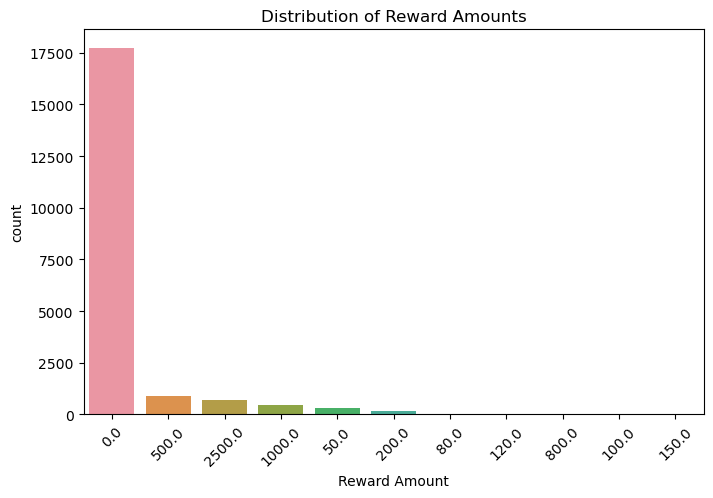

In [276]:
plt.figure(figsize=(8, 5))
sns.countplot(data=opportunities, x='Reward Amount', order=opportunities['Reward Amount'].value_counts().index)
plt.xticks(rotation=45)
plt.title('Distribution of Reward Amounts')
plt.show()


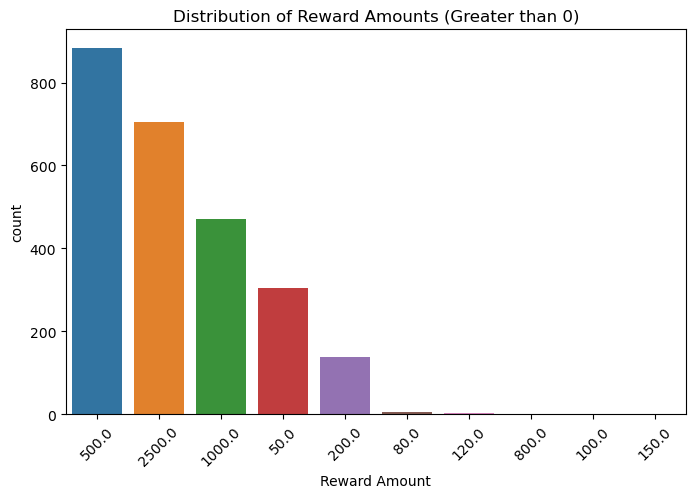

In [277]:
plt.figure(figsize=(8, 5))
filtered_df = opportunities[opportunities['Reward Amount'] > 0]  # Filter rows where Reward Amount > 0
sns.countplot(data=filtered_df, x='Reward Amount', order=filtered_df['Reward Amount'].value_counts().index)
plt.xticks(rotation=45)
plt.title('Distribution of Reward Amounts (Greater than 0)')
plt.show()


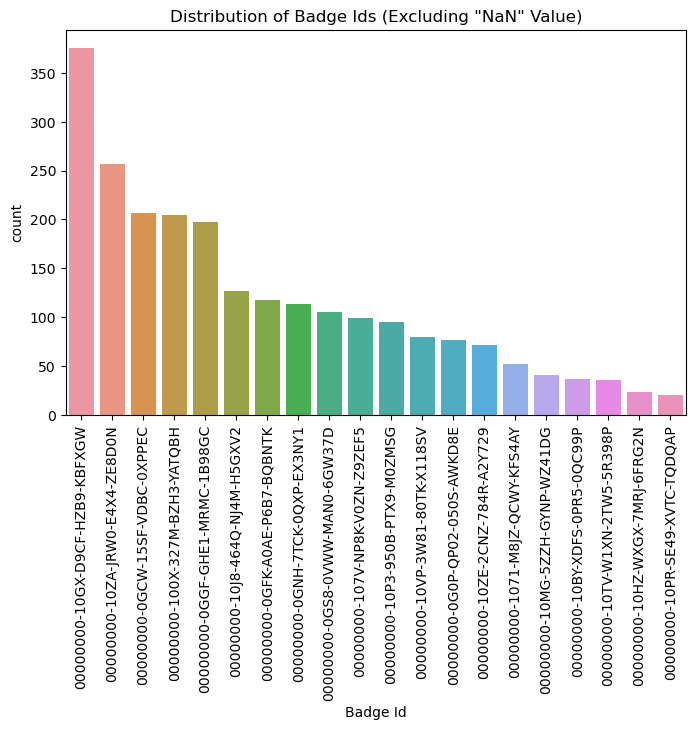

In [278]:
plt.figure(figsize=(8, 5))
filtered_df = opportunities[opportunities['Badge Id'] != 'NaN']  # Exclude 'NaN' if present as a string
sns.countplot(data=filtered_df, x='Badge Id', order=filtered_df['Badge Id'].value_counts().index[:20])  # Top 20 badges
plt.xticks(rotation=90)
plt.title('Distribution of Badge Ids (Excluding "NaN" Value)')
plt.show()


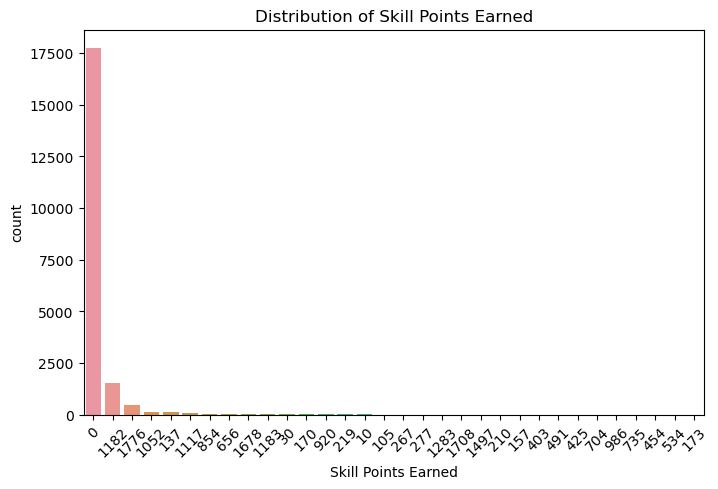

In [279]:
plt.figure(figsize=(8, 5))
sns.countplot(data=opportunities, x='Skill Points Earned', order=opportunities['Skill Points Earned'].value_counts().index)
plt.xticks(rotation=45)
plt.title('Distribution of Skill Points Earned')
plt.show()


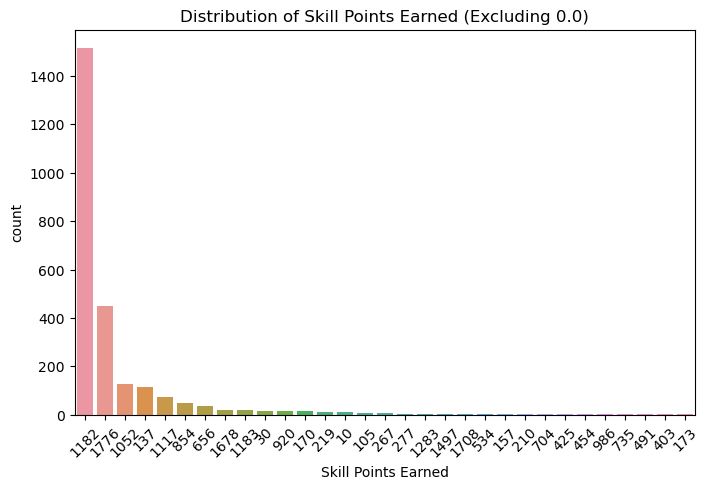

In [280]:
plt.figure(figsize=(8, 5))
filtered_df = opportunities[opportunities['Skill Points Earned'] != 0.0]  # Exclude 0.0 values
sns.countplot(data=filtered_df, x='Skill Points Earned', order=filtered_df['Skill Points Earned'].value_counts().index)
plt.xticks(rotation=45)
plt.title('Distribution of Skill Points Earned (Excluding 0.0)')
plt.show()


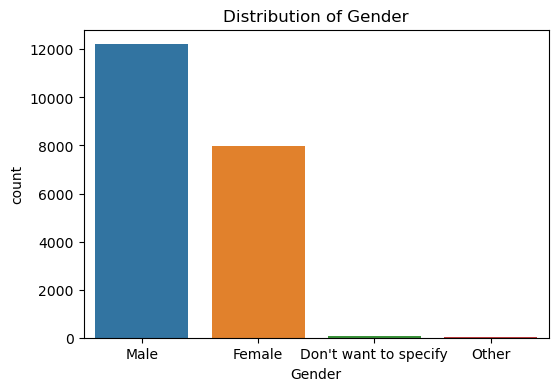

In [282]:
plt.figure(figsize=(6, 4))
sns.countplot(data=opportunities, x='Gender', order=opportunities['Gender'].value_counts().index)
plt.title('Distribution of Gender')
plt.show()

In [283]:
import ast

# Step 1: Drop rows where 'Skills Earned' is NaN
df_cleaned = opportunities.dropna(subset=['Skills Earned']).copy()

# Step 2: Convert the Skills Earned column values from strings to actual lists
def safe_literal_eval(x):
    try:
        return ast.literal_eval(x) if isinstance(x, str) else []
    except (ValueError, SyntaxError):
        return []

df_cleaned['Skills Earned'] = df_cleaned['Skills Earned'].apply(safe_literal_eval)

# Step 3: Flatten the list of skills
all_skills = df_cleaned['Skills Earned'].explode()

# Step 4: Count the occurrences of each skill
skill_counts = all_skills.value_counts()

# Display the result
print(skill_counts)


Skills Earned
Critical Thinking       2405
Communication           2338
Creative Thinking       2188
Technology Literacy     2176
Collaboration           2077
Information Literacy    1508
Flexibility              742
Initiative               360
Leadership               316
Productivity              37
Career Readiness          29
Media Literacy            25
Social Skills             21
College Readiness         14
Name: count, dtype: int64


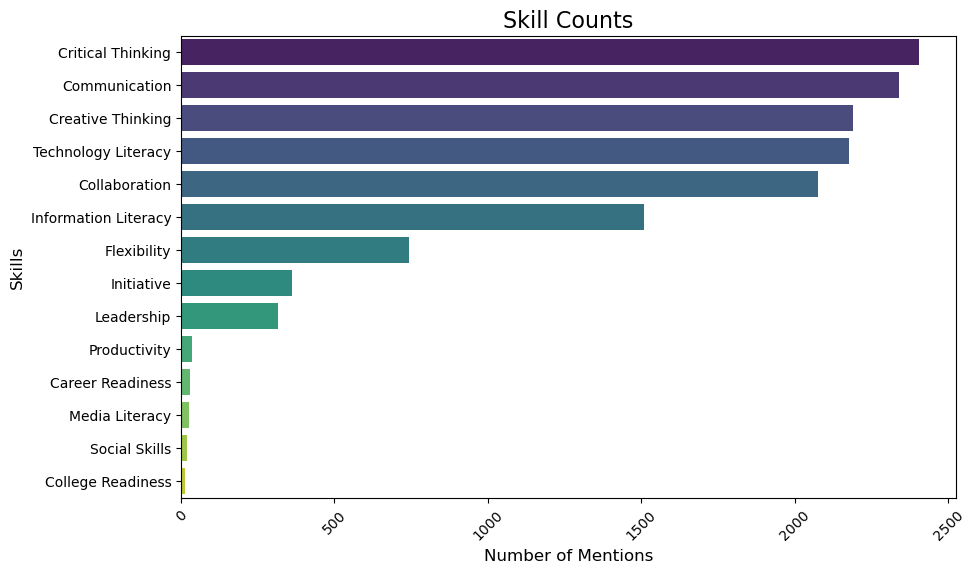

In [284]:
# Plot the skill counts
plt.figure(figsize=(10, 6))
sns.barplot(x=skill_counts.values, y=skill_counts.index, palette='viridis')
plt.title('Skill Counts', fontsize=16)
plt.xlabel('Number of Mentions', fontsize=12)
plt.ylabel('Skills', fontsize=12)
plt.xticks(rotation=45)
plt.show()

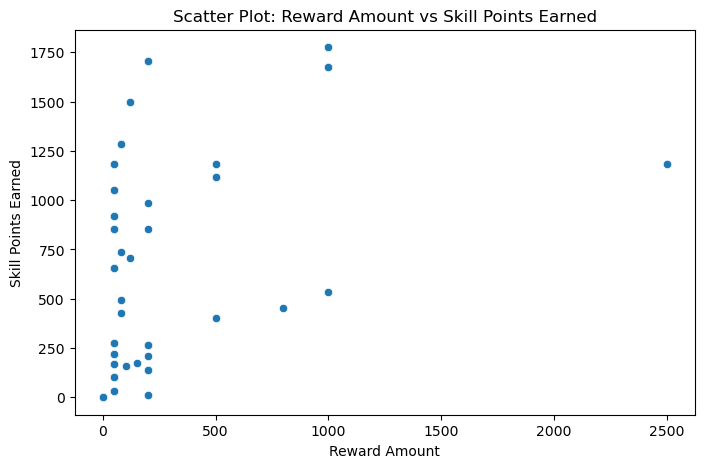

Pearson Correlation:
                      Reward Amount  Skill Points Earned
Reward Amount             1.000000             0.749423
Skill Points Earned       0.749423             1.000000


In [285]:
# Scatter Plot for Reward Amount vs Skill Points Earned
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8, 5))
sns.scatterplot(data=opportunities, x='Reward Amount', y='Skill Points Earned')
plt.title('Scatter Plot: Reward Amount vs Skill Points Earned')
plt.show()

# Pearson correlation
correlation = opportunities[['Reward Amount', 'Skill Points Earned']].corr(method='pearson')
print("Pearson Correlation:\n", correlation)

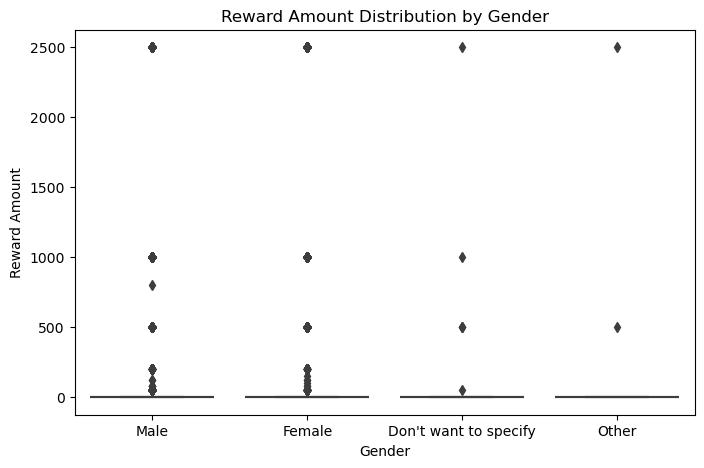

In [286]:
# Box Plot: Reward Amount by Gender
plt.figure(figsize=(8, 5))
sns.boxplot(data=opportunities, x='Gender', y='Reward Amount')
plt.title('Reward Amount Distribution by Gender')
plt.show()


Crosstab of Gender vs Status Description:
 Status Description     Applied  Dropped Out  Not Started  Rejected  \
Gender                                                               
Don't want to specify        0            0            5         0   
Female                      30           15          498       254   
Male                        59            9          815       471   
Other                        0            0            5         0   

Status Description     Rewards Award  Started  Team Allocated  Withdraw  
Gender                                                                   
Don't want to specify              6        5              38         9  
Female                          1070      357            5508       241  
Male                            1436      446            8601       370  
Other                              2        1               6         0  


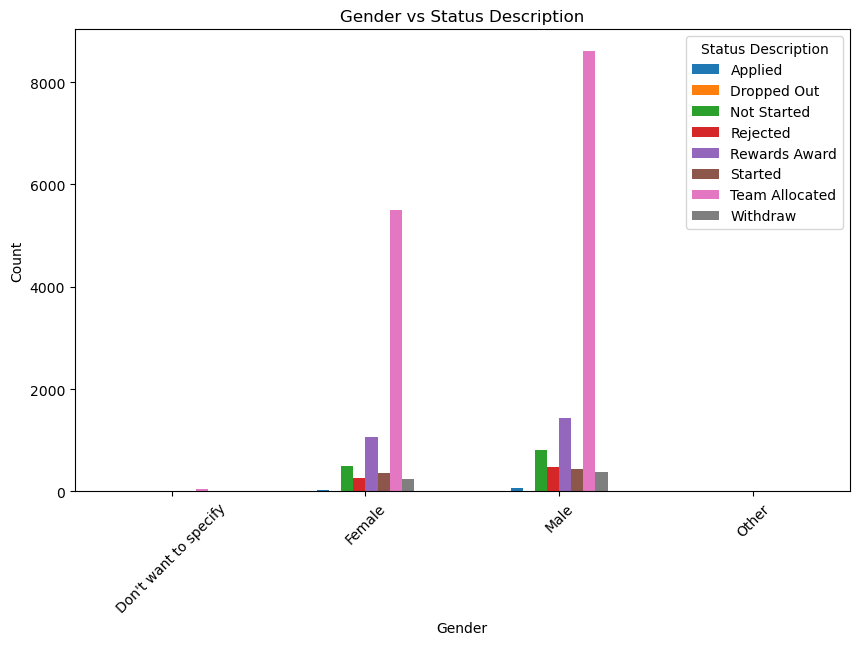

In [288]:
# Crosstab: Gender vs. Status Description
crosstab = pd.crosstab(opportunities['Gender'], opportunities['Status Description'])
print("Crosstab of Gender vs Status Description:\n", crosstab)

# Grouped Bar Plot for Gender vs Status Description
crosstab.plot(kind='bar', stacked=False, figsize=(10, 6))
plt.title('Gender vs Status Description')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()


Crosstab of Gender vs Status Description (Reward Amount > 0):
 Status Description     Rewards Award
Gender                              
Don't want to specify              6
Female                          1070
Male                            1436
Other                              2


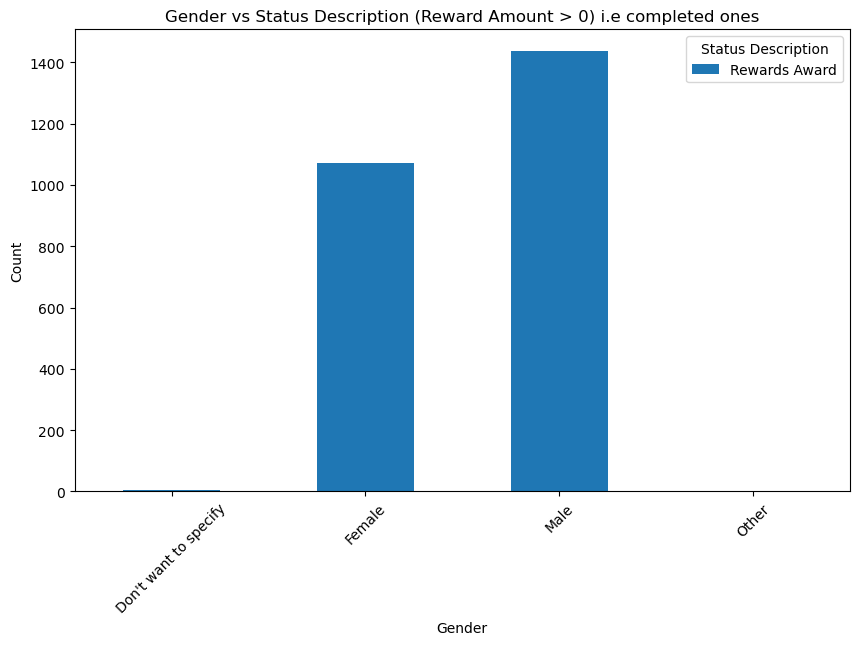

In [289]:
# Filter out rows where 'Reward Amount' is 0
filtered_df = opportunities[opportunities['Reward Amount'] > 0]

# Crosstab: Gender vs Status Description
crosstab = pd.crosstab(filtered_df['Gender'], filtered_df['Status Description'])
print("Crosstab of Gender vs Status Description (Reward Amount > 0):\n", crosstab)

# Grouped Bar Plot for Gender vs Status Description (Filtered Data)
crosstab.plot(kind='bar', stacked=False, figsize=(10, 6))
plt.title('Gender vs Status Description (Reward Amount > 0) i.e completed ones')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()


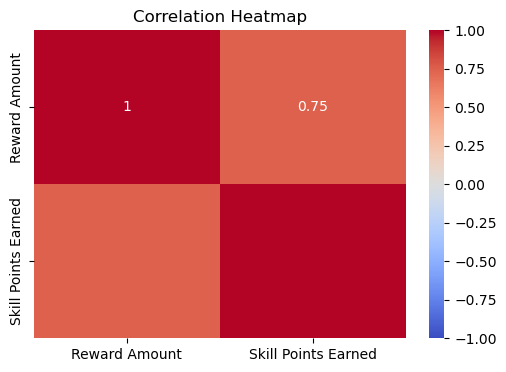

In [290]:
# Correlation heatmap for numerical columns
numerical_columns = ['Reward Amount', 'Skill Points Earned']
plt.figure(figsize=(6, 4))
sns.heatmap(opportunities[numerical_columns].corr(), annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Heatmap')
plt.show()


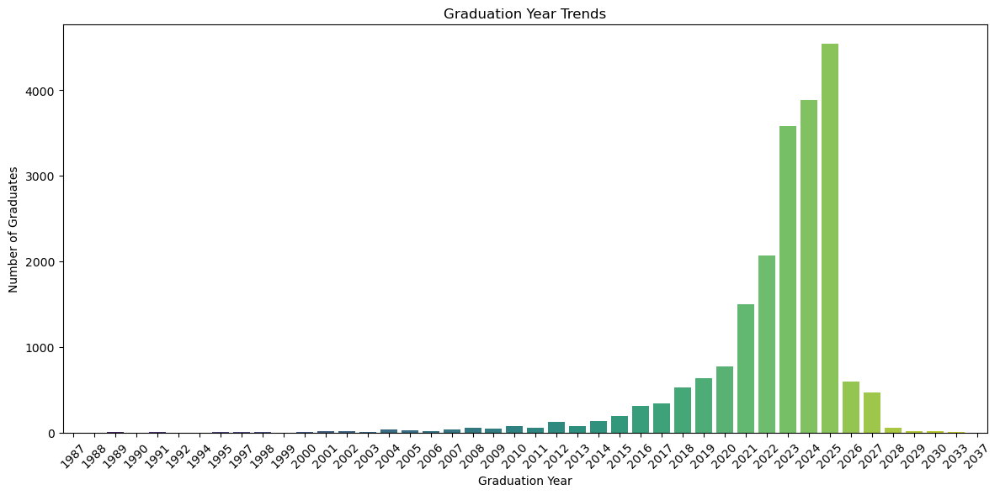

Graduation Year
1987       1
1988       1
1989       6
1990       1
1991       3
1992       1
1994       2
1995       4
1997       3
1998       4
1999       1
2000      11
2001      13
2002      21
2003       5
2004      37
2005      26
2006      18
2007      38
2008      60
2009      50
2010      72
2011      52
2012     127
2013      78
2014     131
2015     189
2016     307
2017     344
2018     528
2019     631
2020     773
2021    1501
2022    2063
2023    3577
2024    3885
2025    4536
2026     591
2027     471
2028      56
2029      18
2030      13
2033       7
2037       1
dtype: int64


In [291]:
# Step 1: Clean the 'Graduation Date(YYYY MM)' column and extract the year
opportunities['Graduation Year'] = pd.to_datetime(opportunities['Graduation Date(YYYY MM)'], errors='coerce').dt.year

# Step 2: Group by year and count the number of graduates
graduation_counts = opportunities.groupby('Graduation Year').size()

# Step 3: Plot the graduation trends
plt.figure(figsize=(12, 6))
sns.barplot(x=graduation_counts.index, y=graduation_counts.values, palette='viridis')
plt.title('Graduation Year Trends')
plt.xlabel('Graduation Year')
plt.ylabel('Number of Graduates')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Optional: Display the counts for each year
print(graduation_counts)

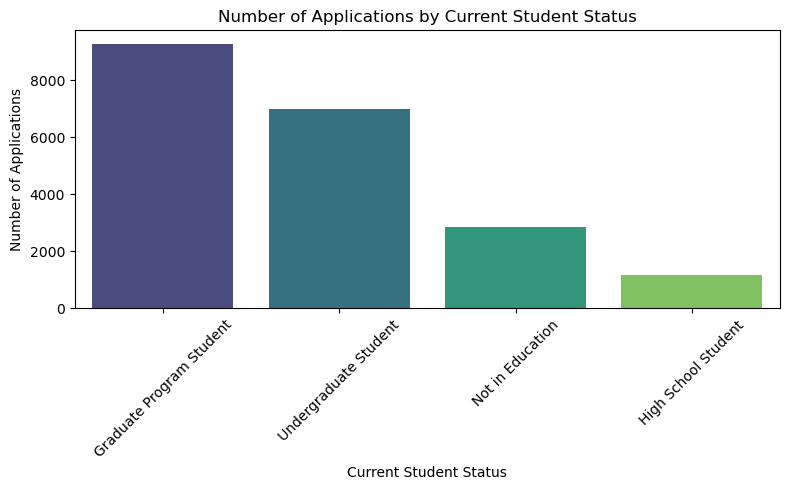

Current Student Status Counts:
Current Student Status
Graduate Program Student    9280
Undergraduate Student       6977
Not in Education            2850
High School Student         1150
Name: count, dtype: int64


In [292]:
status_counts = opportunities['Current Student Status'].value_counts()

# Plotting the distribution of applications by Current Student Status
plt.figure(figsize=(8, 5))
sns.barplot(x=status_counts.index, y=status_counts.values, palette='viridis')
plt.title('Number of Applications by Current Student Status')
plt.xlabel('Current Student Status')
plt.ylabel('Number of Applications')
plt.xticks(rotation=45)  # Rotate x-axis labels for readability
plt.tight_layout()
plt.show()

# Optional: Display the counts for each Current Student Status
print("Current Student Status Counts:")
print(status_counts)


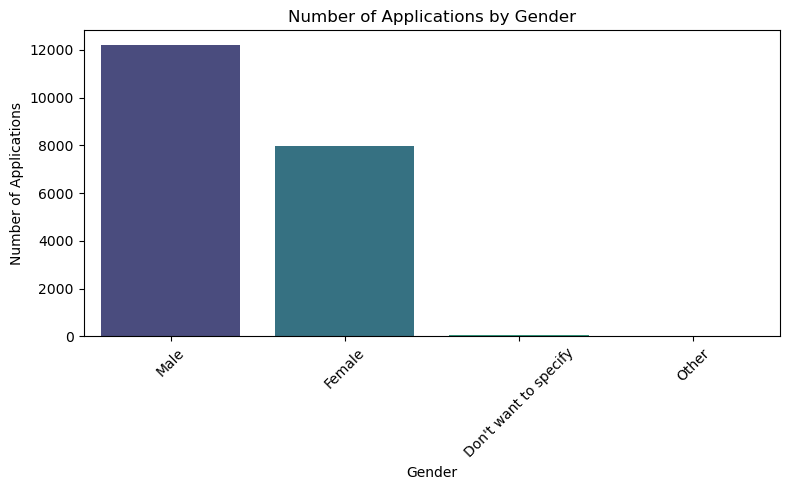

Gender
Male                     12207
Female                    7973
Don't want to specify       63
Other                       14
Name: count, dtype: int64


In [293]:
# Count applications by gender
gender_counts = opportunities['Gender'].value_counts()

# Plotting the distribution of applications by gender
plt.figure(figsize=(8, 5))
sns.barplot(x=gender_counts.index, y=gender_counts.values, palette='viridis')
plt.title('Number of Applications by Gender')
plt.xlabel('Gender')
plt.ylabel('Number of Applications')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Optional: Display the counts for each gender
print(gender_counts)


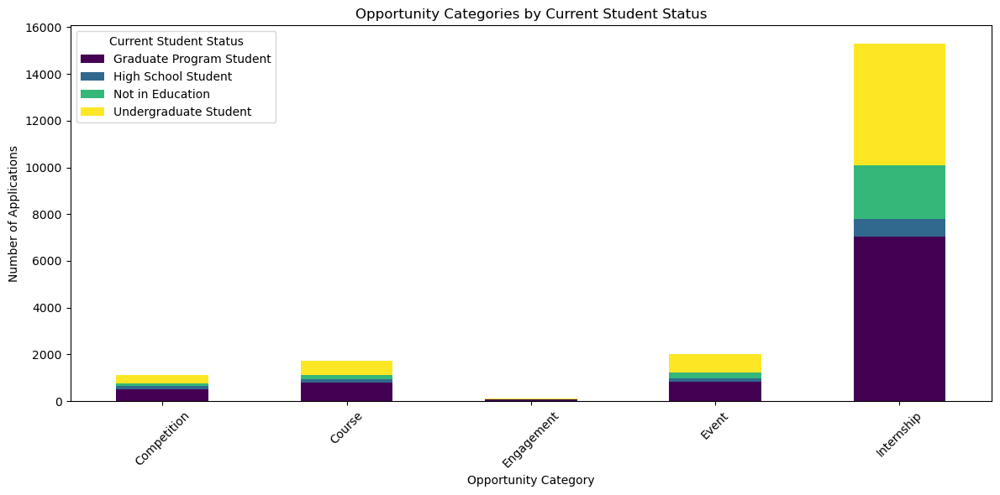

Current Student Status  Graduate Program Student  High School Student  \
Opportunity Category                                                    
Competition                                  525                  120   
Course                                       796                  138   
Engagement                                    84                    2   
Event                                        842                  138   
Internship                                  7033                  752   

Current Student Status  Not in Education  Undergraduate Student  
Opportunity Category                                             
Competition                          118                    356  
Course                               189                    605  
Engagement                             4                     14  
Event                                247                    773  
Internship                          2292                   5229  


In [294]:
# Create a crosstab of Current Student Status and Opportunity Category
category_student_status_crosstab = pd.crosstab(opportunities['Opportunity Category'], opportunities['Current Student Status'])

# Plotting a stacked bar chart
category_student_status_crosstab.plot(kind='bar', stacked=True, figsize=(12, 6), colormap='viridis')
plt.title('Opportunity Categories by Current Student Status')
plt.xlabel('Opportunity Category')
plt.ylabel('Number of Applications')
plt.xticks(rotation=45)
plt.legend(title='Current Student Status')
plt.tight_layout()
plt.show()

# Optional: Display the crosstab
print(category_student_status_crosstab)


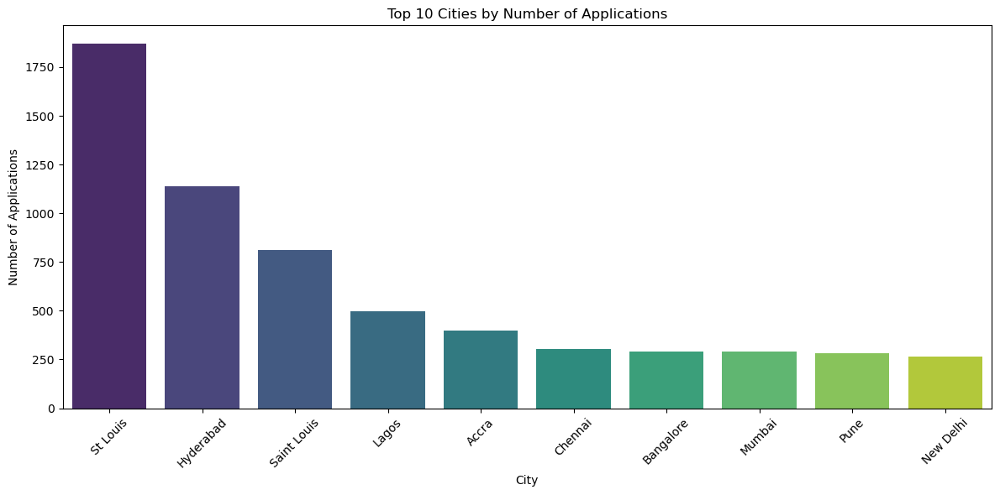

City
St Louis       1870
Hyderabad      1140
Saint Louis     812
Lagos           498
Accra           398
Chennai         302
Bangalore       291
Mumbai          290
Pune            280
New Delhi       266
Name: count, dtype: int64


In [295]:
# Count applications by city
city_counts = opportunities['City'].value_counts().nlargest(10)  # Top 10 cities

# Plotting the distribution of applications by city
plt.figure(figsize=(12, 6))
sns.barplot(x=city_counts.index, y=city_counts.values, palette='viridis')
plt.title('Top 10 Cities by Number of Applications')
plt.xlabel('City')
plt.ylabel('Number of Applications')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Optional: Display the counts for each city
print(city_counts)


C:\Users\vamsh\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\vamsh\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


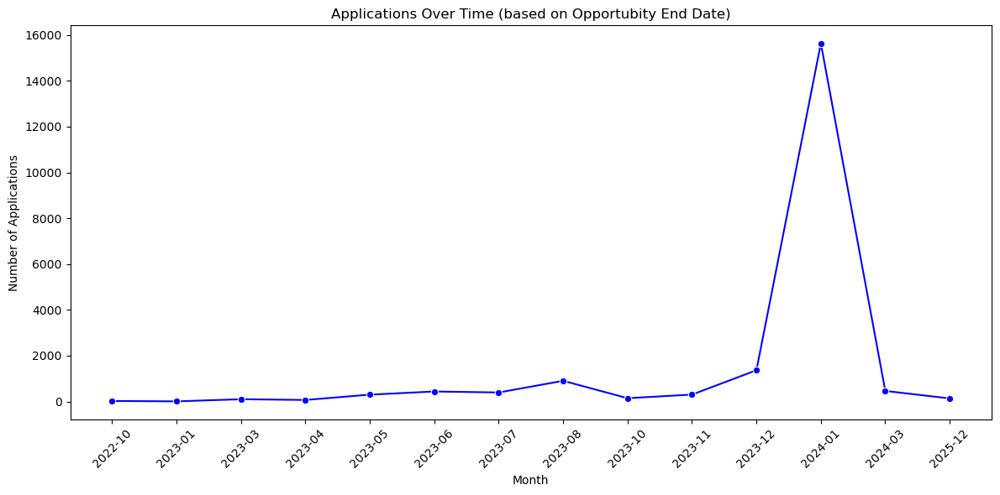

Apply Month
2022-10       22
2023-01        5
2023-03       98
2023-04       66
2023-05      298
2023-06      436
2023-07      393
2023-08      902
2023-10      143
2023-11      301
2023-12     1363
2024-01    15637
2024-03      460
2025-12      133
Freq: M, Name: count, dtype: int64


In [297]:
# Count applications by month (or year, depending on your data)
opportunities['Opportunity End Date'] = pd.to_datetime(opportunities['Opportunity End Date'], errors='coerce')
opportunities['Apply Month'] = opportunities['Opportunity End Date'].dt.to_period('M')  # Grouping by month

# Count applications by apply month
monthly_counts = opportunities['Apply Month'].value_counts().sort_index()

# Plotting the applications over time
plt.figure(figsize=(12, 6))
sns.lineplot(x=monthly_counts.index.astype(str), y=monthly_counts.values, marker='o', color='blue')
plt.title('Applications Over Time (based on Opportubity End Date)')
plt.xlabel('Month')
plt.ylabel('Number of Applications')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Optional: Display the monthly counts
print(monthly_counts)

C:\Users\vamsh\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\vamsh\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


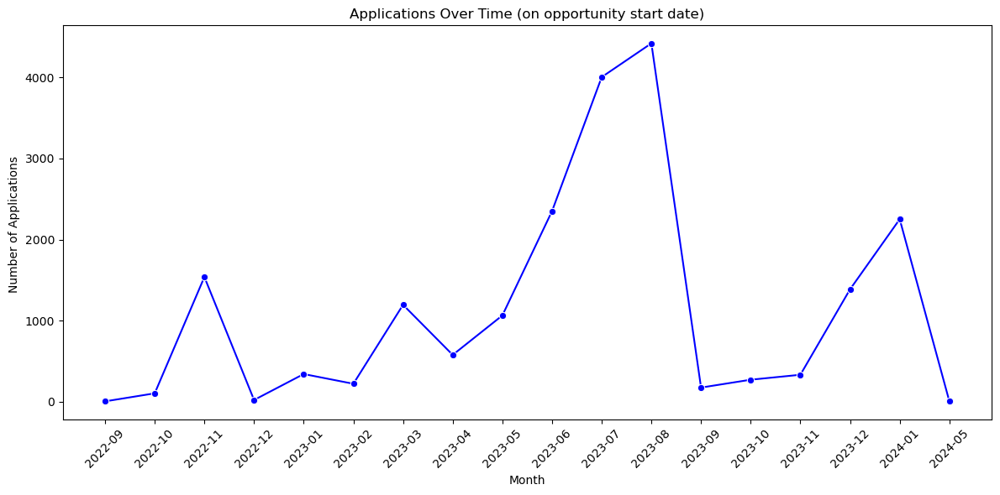

Apply Month
2022-09       4
2022-10     103
2022-11    1538
2022-12      21
2023-01     341
2023-02     221
2023-03    1195
2023-04     577
2023-05    1064
2023-06    2351
2023-07    4004
2023-08    4420
2023-09     174
2023-10     271
2023-11     332
2023-12    1386
2024-01    2251
2024-05       4
Freq: M, Name: count, dtype: int64


In [298]:
# Count applications by month (or year, depending on your data)
opportunities['Opportunity Start Date'] = pd.to_datetime(opportunities['Opportunity Start Date'], errors='coerce')
opportunities['Apply Month'] = opportunities['Opportunity Start Date'].dt.to_period('M')  # Grouping by month

# Count applications by apply month
monthly_counts = opportunities['Apply Month'].value_counts().sort_index()

# Plotting the applications over time
plt.figure(figsize=(12, 6))
sns.lineplot(x=monthly_counts.index.astype(str), y=monthly_counts.values, marker='o', color='blue')
plt.title('Applications Over Time (on opportunity start date)')
plt.xlabel('Month')
plt.ylabel('Number of Applications ')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Optional: Display the monthly counts
print(monthly_counts)


C:\Users\vamsh\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\vamsh\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


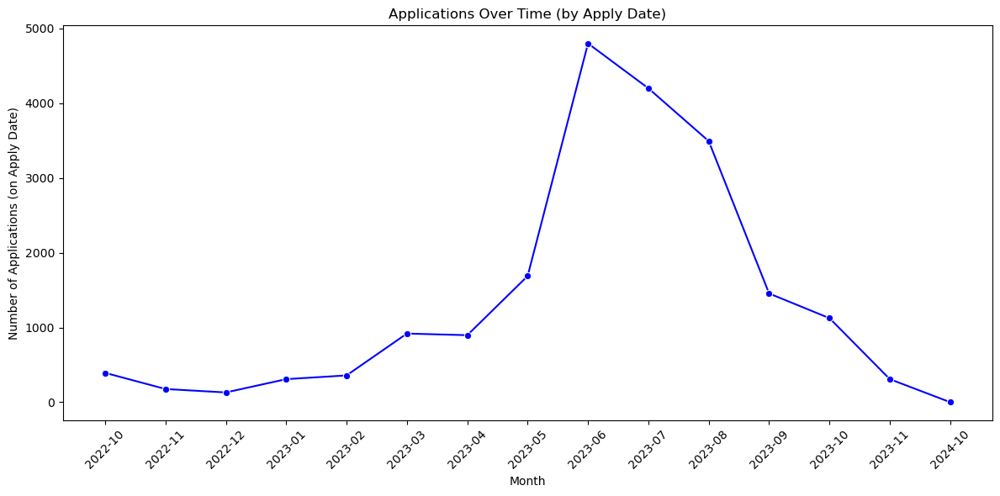

Apply Month
2022-10     393
2022-11     177
2022-12     131
2023-01     309
2023-02     359
2023-03     919
2023-04     897
2023-05    1689
2023-06    4800
2023-07    4200
2023-08    3493
2023-09    1455
2023-10    1125
2023-11     309
2024-10       1
Freq: M, Name: count, dtype: int64


In [299]:
# Convert the 'Apply Date' column to datetime format
opportunities['Apply Date'] = pd.to_datetime(opportunities['Apply Date'], errors='coerce')

# Group by month based on 'Apply Date'
opportunities['Apply Month'] = opportunities['Apply Date'].dt.to_period('M')  # Grouping by month

# Count applications by apply month
monthly_counts = opportunities['Apply Month'].value_counts().sort_index()

# Plotting the applications over time
plt.figure(figsize=(12, 6))
sns.lineplot(x=monthly_counts.index.astype(str), y=monthly_counts.values, marker='o', color='blue')
plt.title('Applications Over Time (by Apply Date)')
plt.xlabel('Month')
plt.ylabel('Number of Applications (on Apply Date)')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Optional: Display the monthly counts
print(monthly_counts)


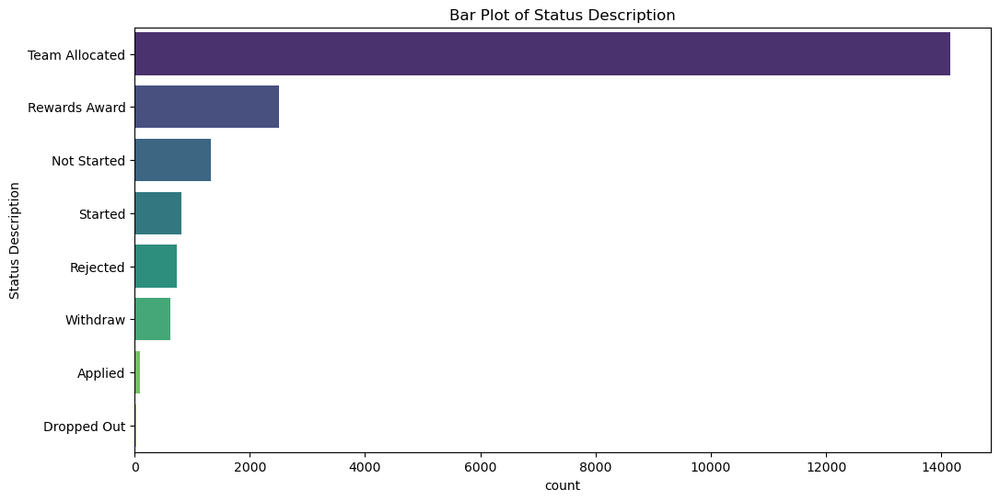


--- Status Description Counts ---
Status Description
Team Allocated    14153
Rewards Award      2514
Not Started        1323
Started             809
Rejected            725
Withdraw            620
Applied              89
Dropped Out          24
Name: count, dtype: int64


In [301]:
# Bar Plot of Status Description
plt.figure(figsize=(12, 6))
status_counts = opportunities['Status Description'].value_counts()

sns.countplot(
    y='Status Description', 
    data=opportunities, 
    palette='viridis', 
    order=status_counts.index
)
plt.title('Bar Plot of Status Description')
plt.show()

# Printing the counts in the console
print("\n--- Status Description Counts ---")
print(status_counts)

In [ ]:
Some preprocessing left

In [48]:
import re

# Step 1: Function to clean ZIP codes
def clean_zip(zip_code):
    zip_code = str(zip_code).strip()
    
    # Case 1: If it's a valid numeric code (including '0', '233'), keep as is
    if re.match(r'^\d+$', zip_code):
        return zip_code
    
    # Case 2: Extract the first 5 digits from ZIPs like "12345-6789"
    if re.match(r'^\d{5}-\d{4}$', zip_code):
        return zip_code[:5]
    
    # Case 3: Remove spaces for ZIPs like "609 102"
    if re.match(r'^\d{3}\s\d{3}$', zip_code):
        return zip_code.replace(' ', '')
    
    # Case 4: If it doesn't fit valid patterns, mark as 'Invalid'
    return 'Invalid'

# Apply the cleaning function to the 'Zip Code' column
opportunities['Zip Code'] = opportunities['Zip Code'].apply(clean_zip)

# Step 2: Replace 'Invalid' ZIP codes with the most frequent ZIP per city, then country
def impute_invalid_zip(row):
    if row['Zip Code'] == 'Invalid':
        # Get the most frequent valid ZIP for the city
        city_zip = opportunities[
            (opportunities['City'] == row['City']) & (opportunities['Zip Code'] != 'Invalid')
        ]['Zip Code'].mode()
        
        if not city_zip.empty:
            return city_zip[0]
        
        # If no valid ZIP for city, get the most frequent ZIP for the country
        country_zip = opportunities[
            (opportunities['Country'] == row['Country']) & (opportunities['Zip Code'] != 'Invalid')
        ]['Zip Code'].mode()
        
        if not country_zip.empty:
            return country_zip[0]
        
        # If no valid ZIP for country either, mark as 'Unknown'
        return 'Unknown'
    
    # If already valid, return the ZIP code
    return row['Zip Code']

# Apply the imputation function directly on the 'Zip Code' column
opportunities['Zip Code'] = opportunities.apply(impute_invalid_zip, axis=1)

# Display the cleaned data
print(opportunities[['Profile Id', 'City', 'Country', 'Zip Code']].head())


                             Profile Id       City      Country Zip Code
0  31ce84c2-2bd1-40ba-b2d8-f164fe125306      Dhaka   Bangladesh     1342
1  36814990-f854-4f76-8c63-91f27567d080   Amritsar  Afghanistan   123242
2  8154328c-f8fe-4bd1-af05-783e140f68b5      Satna        India   485001
3  a83abad6-db1e-44c4-a8f4-9e397e282d73  Hyderabad        India   500039
4  c2b8a15f-2ba3-41e4-a553-7ca68b0d4a54  Bangalore        India   560105


In [49]:
# Define a dictionary with variations to standardize
country_replacements = {
    'Iran Islamic Republic of Persian Gulf': 'Iran',
    'Iran  Islamic Republic of Persian Gulf': 'Iran',
    'Iran, Islamic Republic of Persian Gulf': 'Iran',
    'Congo, The Democratic Republic of the Congo':'Congo',
    'Congo The Democratic Republic of the Congo':'Congo',
    'Congo  The Democratic Republic of the Congo':'Congo'
}

# Replace the variations in the 'Countries' column
opportunities['Country'] = opportunities['Country'].replace(country_replacements)

# Confirm the replacements
print(opportunities['Country'].value_counts())

Country
India                 9109
United States         3856
Nigeria               3342
Pakistan              1051
Ghana                  889
                      ... 
Norway                   1
Guam                     1
Burkina Faso             1
Dominican Republic       1
Senegal                  1
Name: count, Length: 105, dtype: int64


In [50]:
   # Define the mapping for states
state_mapping = {
    'Abia': ['Abia', 'Abia State'],
    'Abuja': ['Abuja Capital Territory', 'Abuja', 'Abuja FCT', 'Federal Capital Territory', 'FCT', 'Federal capital territor'],
    'Adamawa': ['Adamawa', 'Adamawa State Nigeria'],
    'Addis Ababa':['Adis ababa'],
    'Akwa Ibom': ['Akwa Ibom', 'Akwa Ibom state','Akwaibom'],
    'Anambra State':['ANAMBRA'],
    'Andhra Pradesh': ['Andhara Pradesh','visakhapatanam','Vizag','GUNTUR', 'Andhra pradesh','Andhra pradhesh', 'Andhra p', 'Andhra Pradesh state', 'Andhrapradesh', 'Andra pradesh','AndhraPradesh','andra pradesh','AP'],
    'Ashanti': ['Ashanti region', 'Ashanti', 'Ashanti Re','Ashanti Region','ASHANTI'],
    'Borno': ['Borno', 'Borno State'],
    'Bagmati':['Bagmati Province','bagmati'], 
    'Banaadir':['Banadir'],
    'Bauchi':['Bauchi state'],
    'Borno':['borno','Borno State'],
    'Cross River': ['Cross River', 'Cross River State','Cross river'],
    'Cario':['CARIO','cario','Cario Governorate'],
    'Capital Territory':['Capital territory'],
    'Casablanca':['Casablanca Prefecture'],
    'Damietta': ['Damietta', 'dameitta','Dameitta'],
    'Delhi': ['Delhi','DELHI', 'Del', 'New dehi', 'New Delhi','West Delhi','Delhu'],
    'Delta': ['Delta', 'Delta State'],
    'Dhaka': ['Dhaka City', 'Dhaka Division', 'dhaka', 'Dhaka North'],
    'Eastern Region':['Eastern','EASTERN','Eastern region','EASTERN REGION'],
    'Edo': ['Edo', 'Edo State'],
    'Ekiti': ['EKITI', 'Ekiti State', 'Ekito','Ekiti state','Ekiti'],
    'Enugu': ['Enugu', 'Enugu state','Enugu State'],
    'FCT': ['FCT Capital'],  # Only for Pakistan
    'Fayioum':['Fayoum'],
    'Federal Capital Territory':['FCT','Fct Abuja','Federal capital territor','Federal Capital Territory'],
    'Greater Accra': ['Greater Accra', 'Greater Accra Region', 'Greater AccraRegion', 'Greater AccraRegion p', 'Accra','Accr','Ghana','Greater Accra region','Greater AccraRegion P','GreaterAccra'],
    'Gujarat': ['Gujarat', 'gujrat'],
    'Giza Governorate':['Giza','giza'],
    'Ha Noi':['Ha No'],
    'Ho Chi Minh':['Ho Chi Minh City','ho chi minh'],
    'Haryana': ['Haryana', 'Haryan', 'Haryans'],
    'Illinois': ['Illinois', 'Illiniois', 'illionis', 'IllINOIS','Ill'],
    'Imo': ['Imo', 'Imo state'],
    'Islamabad': ['Islamic Republic of Pakistan', 'Islamic','islamabad','Islamabad capital territory'],
    'Kaduna':['Kaduna State'],
    'Kampala': ['Kampala', 'Kampala city'],
    'Kano': ['Kano', 'Kano State'],
    'Kafr El shiek':['Kafrelshikh'],
    'Karnataka': ['Karnataka', 'Karnatak', 'Karanataka', 'Karnataka state'],
    'Katsina':['Katsina State'],
    'Kebbi State':['Kebbi Srate'],
    'Khyber Pakhtunkhwa': ['Khyber Pakuntunkhwa', 'Khyber Patun'],
    'Kigali': ['Kigali', 'Kigali city'],
    'Kogi': ['Kogi', 'Kogi state'],
    'Kwara': ['Kwara', 'Kwara state'],
    'Lagos': ['LA','Lagos city','Lagos', 'Lagos state','Lagos I','Lagos sta','Lagos state','LGOS','LG'],
    'Lusaka':['Lusaka Province'],
    'Madhya Pradesh': ['MADHYA PRADESH', 'Madhya Pradesh', 'M P', 'MP','madhyapradesh','Madya Pradesh'],
    'Madhesh Pradesh': ['Madhesh Pradesh', 'Madhesh Province'],
    'Maharashtra': ['Maharashtra', 'Maharashtr', 'Maharashtra', 'Maharasthra', 'maharastra', 'maharshtra', 'Mharashthra','MAHARASTRA','Maharshtra','Mahrashtra'],
    'Missouri': ['Missouri','Saint Louis', 'MISSOURI', 'Missouri state', 'Missiori', 'Missori', 'missori', 'Missour', 'missuori', 'Missoure', 'missou', 'MissouriMissouru', 'Saint Louis', 'Saint Louis City', 'St Louis','missori','Missouri','Missouri state','Missuori'],
    'Marrakesh Safi':['Marrakech safi'],
    'Nairobi':['Nairobi Municipality'],
    'Nassarawa': ['Nassarawa', 'Nasarawa', 'Nassarawa State'],
    'Niger': ['Niger', 'Niger state'],
    'Northern Region': ['Northern region', 'Northern R', 'Northern'],
    'North West Region':['Northwest','North west'],
    'Ogun': ['Ogun', 'Ogun Stat', 'Ogun State'],
    'Ondo': ['Ondo', 'Ondo state'],
    'Osun': ['Osun', 'Osun State'],
    'Oyo': ['OYO','Oyo', 'Oyo N', 'Oyo st', 'Oyo State'],
    'Pakistan': ['Pakistan', 'Pakistan k', 'Pak', 'Pakista', 'pakistan','Pakistan punjab'],
    'Plateau': ['Plateau', 'Plateau state', 'Plateau States','PLATEAU','Pleaute'],
    'Punjab': ['Province punjab', 'Pakistan Punjab', 'Punjab', 'PUNJAB', 'punjab'],  # Only for Pakistan
    'Puducherry': ['Pondicherry', 'Puducherry'],
    'Qalyubia':['Qalioubiah','Qalubia'],
    'Rajasthan':['Raj'],
    'Select':['Select State'],
    'Souss Massa':['Sousse'],
    'South east':['South East District'],
    'Northern Region':['Tamale'],
    'Rivers': ['Rivers', 'River State', 'Rivers State', 'RiversState','River state','rivers'],
    'Sokoto State': ['Sokoto', 'SOKOTO STATE','Sokoto Stste','Sokoto State'],
    'Tamil Nadu': ['Tamil Nadu', 'Tamil Nadu state', 'Tamilnadu'],
    'Telangana': ['TELANAGAN','TELANAGANA','Telangana', 'Tel', 'TELANGAN', 'TELANGANA', 'telangan', 'Telangana', 'Telangana state', 'Telegana', 'Telengana','telengana','telanngana','telangana','Telanagana','Hyderabad'],
    'Uttar Pradesh': ['Uttar Pradesh', 'UP', 'UTTAR PRADESH', 'Uttar Prades', 'up', 'uttar pradesh', 'up','Uttarpardesh','UttarPradesh','Utterpradesh'],
    'Uttarakhand': ['Uttarakhand', 'Uttrakhand','Uttrakhand'],
    'Upper East':['Upper East Region'],
    'Usa':['united states'],
    'Volta':['Volta region'],
    'West Bengal': ['West Bengal', 'WB', 'WestBengal','West Benagal'],
    'Western Area':['Western Area Urban'],
    'Western Region':['Western Re'],
}

# Function to standardize state names based on the country
def standardize_state(row):
    for key, variations in state_mapping.items():
        if row['State'] in variations:
            if row['Country'] == 'Pakistan' and key in ['FCT', 'Punjab']:
                return key
            return key
    return row['State']  # Return original if no match found

# Apply the function to standardize the 'State Name' column
opportunities['State'] = opportunities.apply(standardize_state, axis=1)

# Check the updated DataFrame
print(opportunities[['State', 'Country']])


                State        Country
0               Savar     Bangladesh
1              Punjab    Afghanistan
2      Madhya Pradesh          India
3           Telangana          India
4           Karnataka          India
...               ...            ...
20317   Uttar Pradesh          India
20318           Texas  United States
20319  Andhra Pradesh          India
20320        Missouri  United States
20321         Rangpur     Bangladesh

[20257 rows x 2 columns]


In [51]:

# Ensure 'Apply Date' is in datetime format
opportunities['Apply Date'] = pd.to_datetime(opportunities['Apply Date'], errors='coerce')

# Extract only the date part (remove the time)
opportunities['Apply Date'] = opportunities['Apply Date'].dt.date

# Verify the changes
print(opportunities['Apply Date'].head())


0    2022-10-03
1    2023-01-05
2    2022-10-04
3    2022-10-05
4    2022-10-05
Name: Apply Date, dtype: object


In [55]:
# Convert 'Graduation Date' to datetime
opportunities['Graduation Date(YYYY MM)'] = pd.to_datetime(opportunities['Graduation Date(YYYY MM)'], format='%Y-%m', errors='coerce')

# Extract the date and set day to the first of the month
opportunities['Graduation Date(YYYY MM)'] = opportunities['Graduation Date(YYYY MM)'].dt.to_period('M').dt.to_timestamp()

# Verify the changes
print(opportunities['Graduation Date(YYYY MM)'].head())


0   2023-06-01
1   2021-01-01
2   2023-04-01
3   2024-12-01
4   2022-06-01
Name: Graduation Date(YYYY MM), dtype: datetime64[ns]


In [52]:
print(opportunities['Graduation Date(YYYY MM)'].head)

<bound method NDFrame.head of 0        2023-06
1        2021-01
2        2023-04
3        2024-12
4        2022-06
          ...   
20317    2020-07
20318    2024-05
20319    2023-06
20320    2025-05
20321    2024-08
Name: Graduation Date(YYYY MM), Length: 20257, dtype: object>


In [56]:
#opportunities_cleaned=opportunities.tp_csv(r"C:\Users|vmsh\Downloads\Opportunities_cleaned",index=False)
opportunities.to_csv(r"C:\Users\vamsh\Downloads\Opportunities_cleaned.csv",index=False)

In [63]:
opportunities.columns

Index(['Profile Id', 'Opportunity Id', 'Opportunity Name',
       'Opportunity Category', 'Opportunity End Date', 'Gender', 'City',
       'State', 'Country', 'Zip Code', 'Graduation Date(YYYY MM)',
       'Current Student Status', 'Current/Intended Major',
       'Status Description', 'Apply Date', 'Opportunity Start Date',
       'Reward Amount', 'Badge Id', 'Badge Name', 'Skill Points Earned',
       'Skills Earned'],
      dtype='object')

In [302]:
from wordcloud import WordCloud

C:\Users\vamsh\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


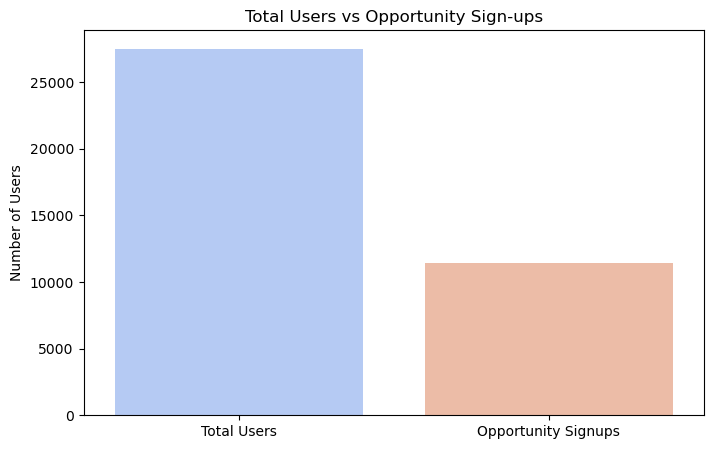

In [16]:
# Prepare data
total_users = userdata.shape[0]
unique_opportunity_signups = opportunities['Profile Id'].nunique()

# Bar plot
plt.figure(figsize=(8, 5))
sns.barplot(x=['Total Users', 'Opportunity Signups'], y=[total_users, unique_opportunity_signups], palette='coolwarm')
plt.title('Total Users vs Opportunity Sign-ups')
plt.ylabel('Number of Users')
plt.show()


Total Users: 27500
Opportunity Signups: 11435
Percentage of Users Signed Up: 41.58%


C:\Users\vamsh\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


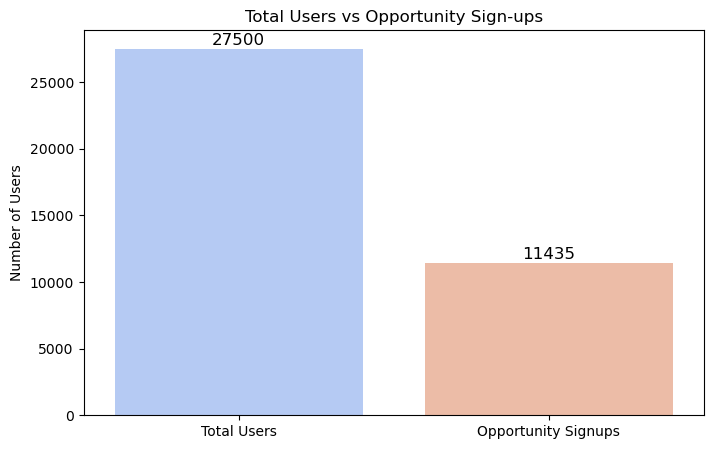

Percentage of users who signed up for opportunities: 41.58%


In [33]:
# Prepare data
total_users = userdata.shape[0]
unique_opportunity_signups = opportunities['Profile Id'].nunique()

# Print values
print(f"Total Users: {total_users}")
print(f"Opportunity Signups: {unique_opportunity_signups}")
print(f"Percentage of Users Signed Up: {(unique_opportunity_signups / total_users) * 100:.2f}%")

# Bar plot
plt.figure(figsize=(8, 5))
sns.barplot(x=['Total Users', 'Opportunity Signups'], 
            y=[total_users, unique_opportunity_signups], 
            palette='coolwarm')

# Add values above bars
for i, value in enumerate([total_users, unique_opportunity_signups]):
    plt.text(i, value + 50, str(value), ha='center', va='bottom', fontsize=12)

# Plot settings
plt.title('Total Users vs Opportunity Sign-ups')
plt.ylabel('Number of Users')
plt.show()


print(f"Percentage of users who signed up for opportunities: {signup_percentage:.2f}%")

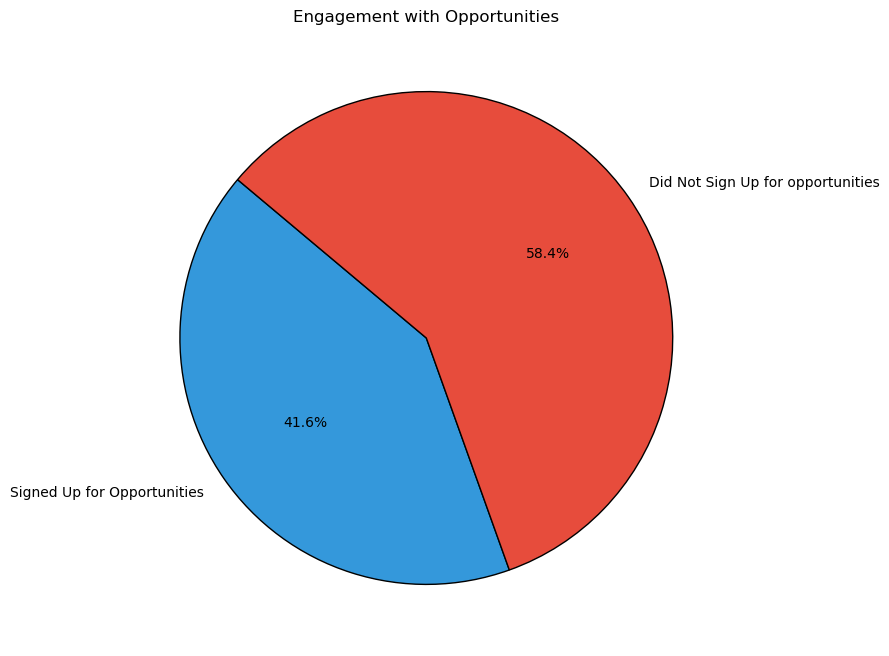

In [25]:
# Prepare data
labels = ['Signed Up for Opportunities', 'Did Not Sign Up for opportunities']
sizes = [unique_opportunity_signups, total_users - unique_opportunity_signups]
colors = ['#3498db', '#e74c3c']

# Plot Pie Chart
plt.figure(figsize=(8, 8))
plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%', startangle=140, wedgeprops={'edgecolor': 'black'})

plt.title('Engagement with Opportunities')
plt.show()


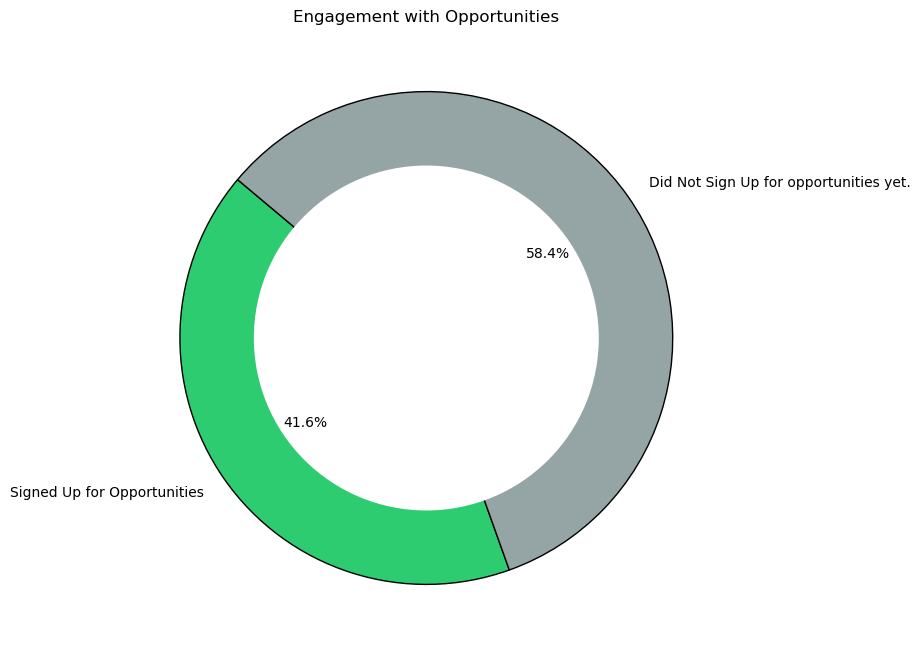

In [27]:
# Prepare data
labels = ['Signed Up for Opportunities', 'Did Not Sign Up for opportunities yet.']
sizes = [unique_opportunity_signups, total_users - unique_opportunity_signups]
colors = ['#2ecc71', '#95a5a6']

# Plot Donut Chart
plt.figure(figsize=(8, 8))
wedges, texts, autotexts = plt.pie(sizes, labels=labels, colors=colors, 
                                   autopct='%1.1f%%', startangle=140, wedgeprops={'edgecolor': 'black'})

# Draw a circle at the center to create a donut-like appearance
plt.gca().add_artist(plt.Circle((0, 0), 0.70, fc='white'))

plt.title('Engagement with Opportunities')
plt.show()


Percentage of users who signed up for opportunities: 41.58%


C:\Users\vamsh\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


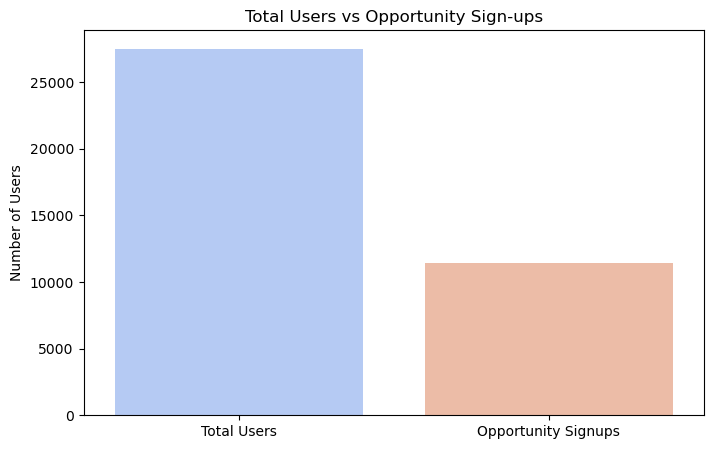

In [20]:
# Calculate total users and unique opportunity signups
total_users = userdata.shape[0]
unique_opportunity_signups = opportunities['Profile Id'].nunique()

# Calculate the percentage of users who signed up for opportunities
signup_percentage = (unique_opportunity_signups / total_users) * 100

print(f"Percentage of users who signed up for opportunities: {signup_percentage:.2f}%")

# Bar plot
plt.figure(figsize=(8, 5))
sns.barplot(x=['Total Users', 'Opportunity Signups'], y=[total_users, unique_opportunity_signups], palette='coolwarm')
plt.title('Total Users vs Opportunity Sign-ups')
plt.ylabel('Number of Users')
plt.show()


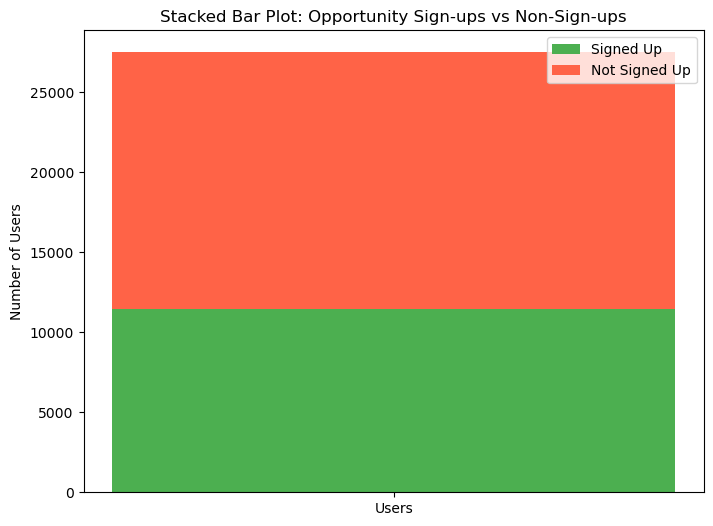

In [31]:
total_users = userdata.shape[0]
unique_opportunity_signups = opportunities['Profile Id'].nunique()


# Calculate number of users who did NOT sign up
not_signed_up = total_users - unique_opportunity_signups

# Data for stacked bar plot
data = pd.DataFrame({
    'Category': ['Signed Up', 'Not Signed Up'],
    'Count': [total_users, unique_opportunity_signups]
})

# Plot
# Create a single bar with the two stacked portions
fig, ax = plt.subplots(figsize=(8, 6))

# Plot 'Signed Up' part
ax.bar('Users', unique_opportunity_signups, label='Signed Up', color='#4CAF50')

# Plot 'Not Signed Up' part on top of 'Signed Up'
ax.bar('Users', not_signed_up, bottom=unique_opportunity_signups, label='Not Signed Up', color='#FF6347')

# Add legend, title, and labels
ax.set_title('Stacked Bar Plot: Opportunity Sign-ups vs Non-Sign-ups')
ax.set_ylabel('Number of Users')
ax.legend()

plt.show()

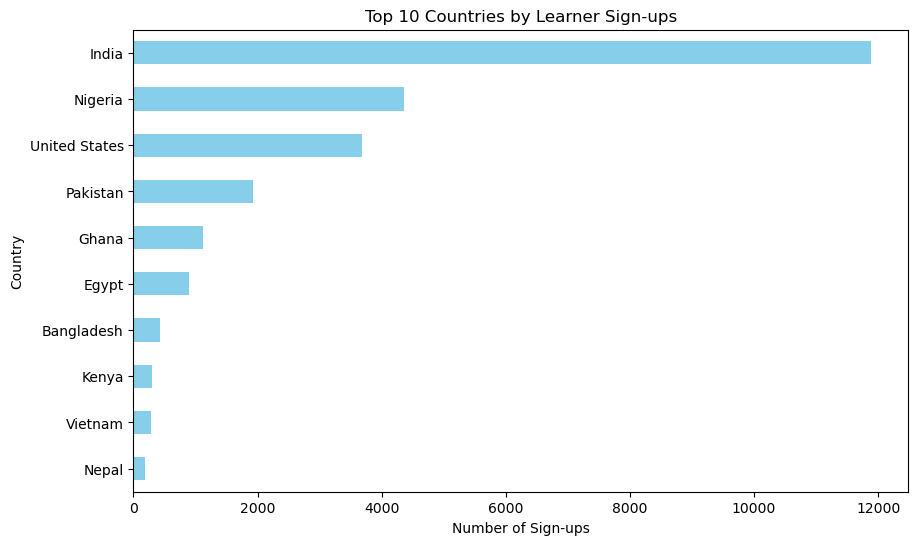

In [95]:
top_countries = userdata['Country'].value_counts().head(10)

plt.figure(figsize=(10, 6))
top_countries.plot(kind='barh', color='skyblue')
plt.title('Top 10 Countries by Learner Sign-ups')
plt.xlabel('Number of Sign-ups')
plt.gca().invert_yaxis()  # Invert y-axis for better readability
plt.show()



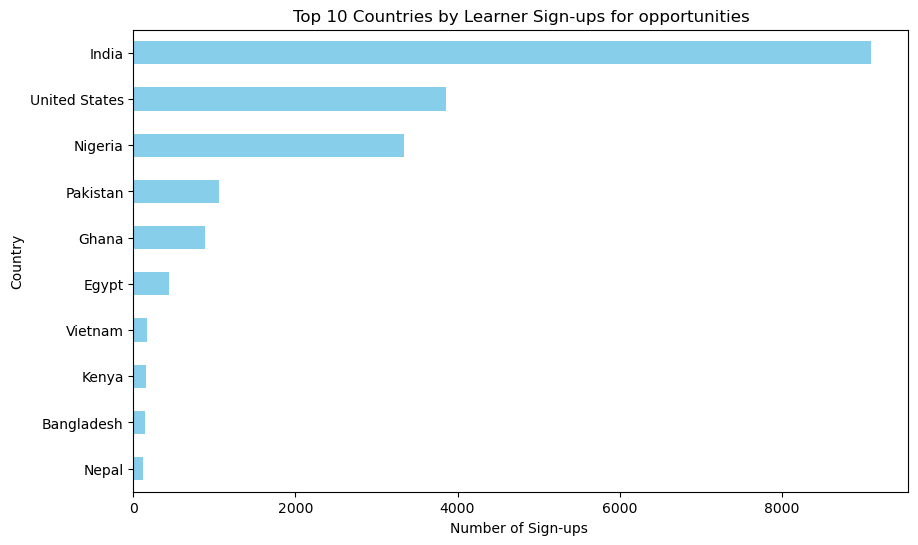

In [98]:
top_countries = opportunities['Country'].value_counts().head(10)

plt.figure(figsize=(10, 6))
top_countries.plot(kind='barh', color='skyblue')
plt.title('Top 10 Countries by Learner Sign-ups for opportunities')
plt.xlabel('Number of Sign-ups ')
plt.gca().invert_yaxis()  # Invert y-axis for better readability
plt.show()


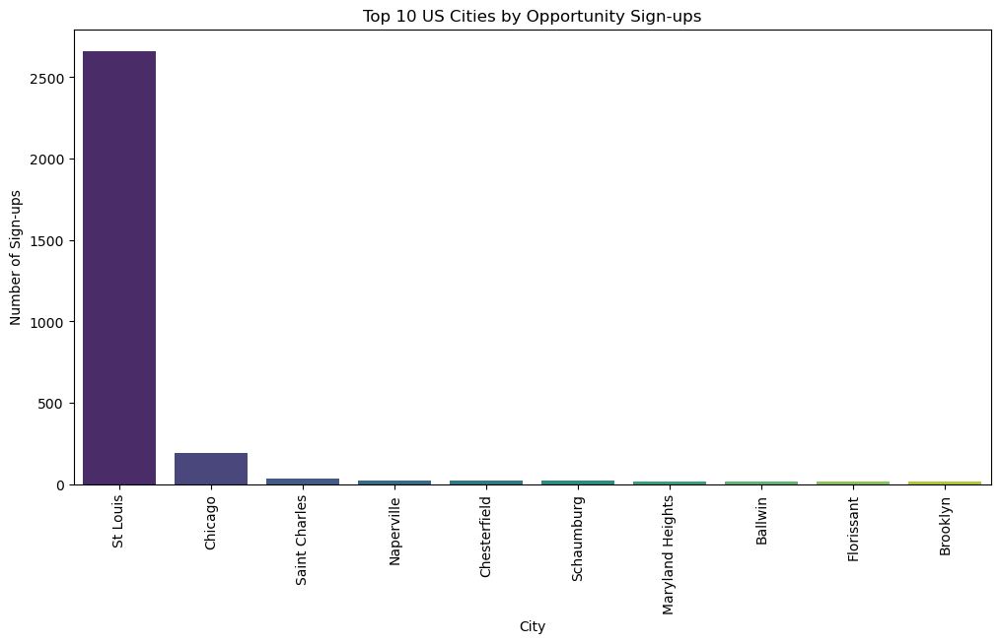

In [78]:
# Filter only opportunities related to users in the US
us_opportunities = opportunities[opportunities['Country'].str.lower() == 'united states']

# Count users by city
opportunity_city_counts = us_opportunities['City'].value_counts()

# Plot top 10 US cities by user count
plt.figure(figsize=(12, 6))
sns.barplot(x=opportunity_city_counts.head(10).index, 
            y=opportunity_city_counts.head(10).values, palette='viridis')
plt.xticks(rotation=90)
plt.title('Top 10 US Cities by Opportunity Sign-ups')
plt.ylabel('Number of Sign-ups')
plt.xlabel('City')
plt.show()


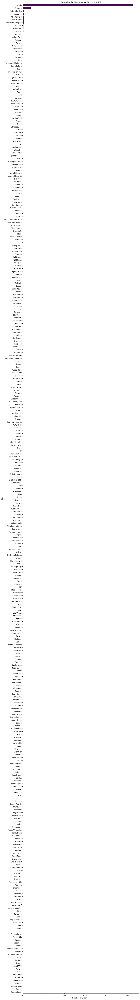

In [79]:
# Filter only opportunities related to users in the US
us_opportunities = opportunities[opportunities['Country'].str.lower() == 'united states']

# Count users by city
opportunity_city_counts = us_opportunities['City'].value_counts()

# Plot all US cities by user count (horizontal bar plot for better readability)
plt.figure(figsize=(12, len(opportunity_city_counts) * 0.3))  # Dynamic height adjustment
sns.barplot(y=opportunity_city_counts.index, 
            x=opportunity_city_counts.values, palette='viridis')

# Plot settings
plt.title('Opportunity Sign-ups by City in the US')
plt.xlabel('Number of Sign-ups')
plt.ylabel('City')
plt.show()


In [ ]:
Cities in the US Learners Have Signed Up From

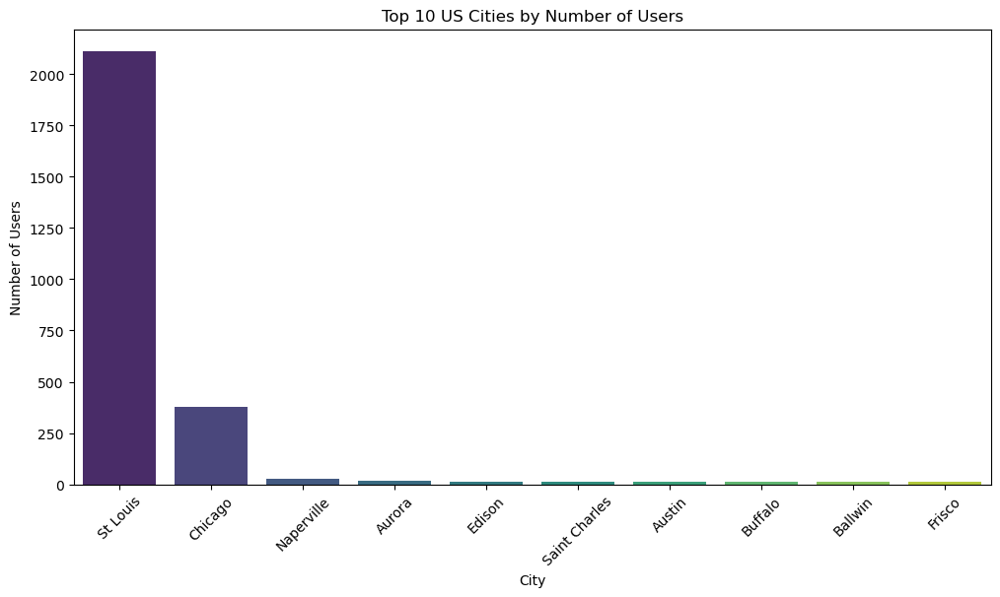

In [91]:
# Filter only users from the US
us_users = userdata[userdata['Country'].str.lower() == 'united states']

# Count users by city
city_counts = us_users['city'].value_counts()

# Plot top 10 US cities by user count
plt.figure(figsize=(12, 6))
sns.barplot(x=city_counts.head(10).index, y=city_counts.head(10).values, palette='viridis')
plt.xticks(rotation=45)
plt.title('Top 10 US Cities by Number of Users')
plt.ylabel('Number of Users')
plt.xlabel('City')
plt.show()


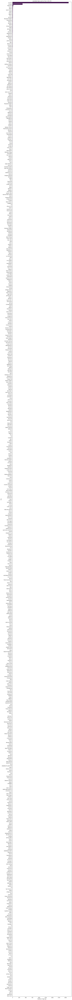

In [89]:
# Filter only userdata related to users in the US
us_userdata = userdata[userdata['Country'].str.lower() == 'united states']

# Count users by city
userdata_city_counts = us_userdata['city'].value_counts()

# Plot all US cities by user count (horizontal bar plot for better readability)
plt.figure(figsize=(12, len(userdata_city_counts) * 0.3))  # Dynamic height adjustment
sns.barplot(y=userdata_city_counts.index, 
            x=userdata_city_counts.values, palette='viridis')

# Plot settings
plt.title('userdata Sign-ups by City in the US')
plt.xlabel('Number of Sign-ups')
plt.ylabel('City')
plt.show()


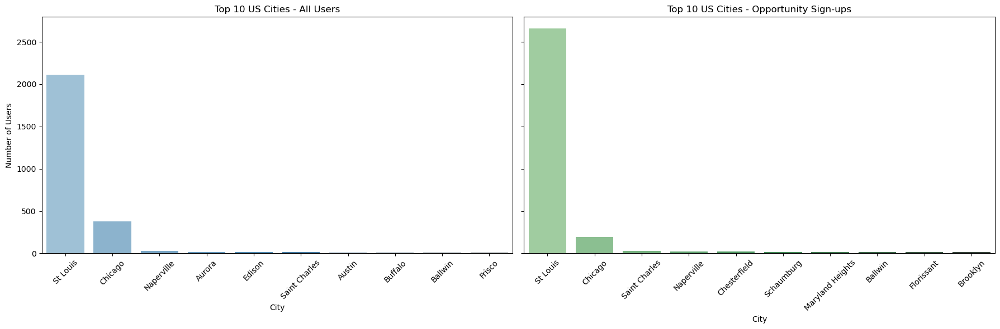

In [93]:
# Filter US users from both datasets
us_users = userdata[userdata['Country'].str.lower() == 'united states']
us_opportunities = opportunities[opportunities['Country'].str.lower() == 'united states']

# Count top 10 cities by number of users/sign-ups
user_city_counts = us_users['city'].value_counts().head(10)
opportunity_city_counts = us_opportunities['City'].value_counts().head(10)

# Create side-by-side subplots
fig, axes = plt.subplots(1, 2, figsize=(18, 6), sharey=True)

# Plot for Userdata
sns.barplot(x=user_city_counts.index, y=user_city_counts.values, ax=axes[0], palette='Blues_d')
axes[0].set_title('Top 10 US Cities - All Users')
axes[0].set_xlabel('City')
axes[0].set_ylabel('Number of Users')
axes[0].tick_params(axis='x', rotation=45)

# Plot for Opportunities dataset
sns.barplot(x=opportunity_city_counts.index, y=opportunity_city_counts.values, ax=axes[1], palette='Greens_d')
axes[1].set_title('Top 10 US Cities - Opportunity Sign-ups')
axes[1].set_xlabel('City')
axes[1].tick_params(axis='x', rotation=45)

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()


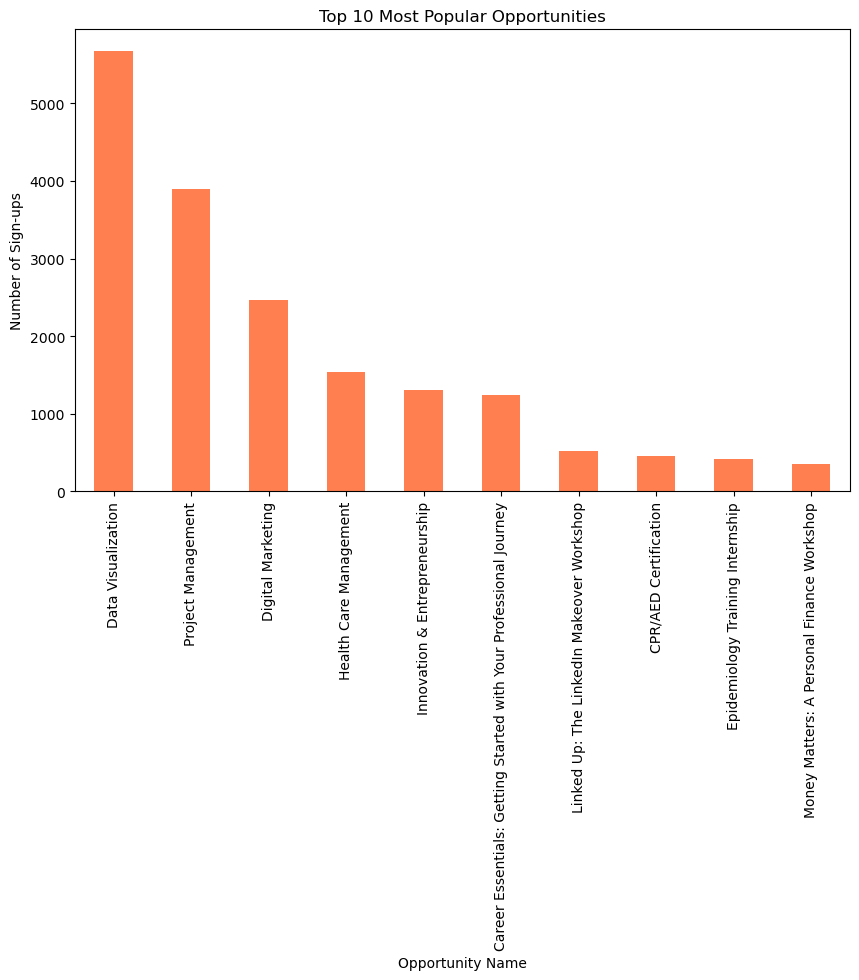

In [99]:
popular_opportunity = opportunities['Opportunity Name'].value_counts().head(10)

plt.figure(figsize=(10, 6))
popular_opportunity.plot(kind='bar', color='coral')
plt.title('Top 10 Most Popular Opportunities')
plt.ylabel('Number of Sign-ups')
plt.show()


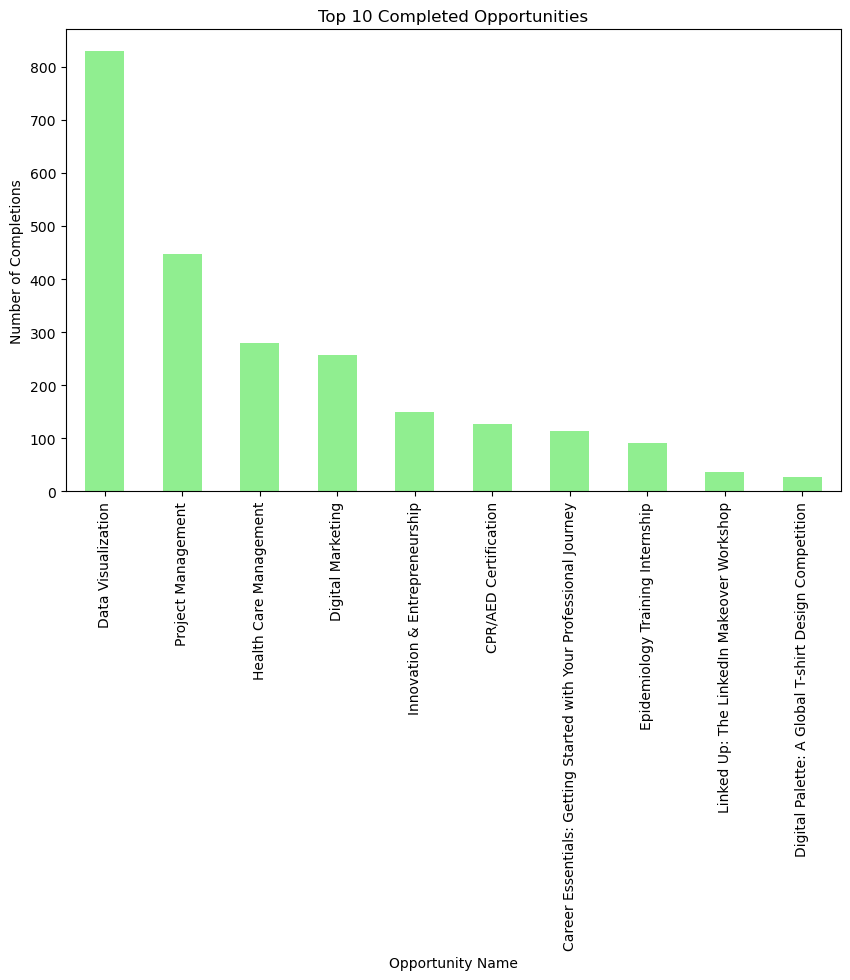

In [102]:
completed_opportunities = opportunities[opportunities['Status Description'] == 'Rewards Award']
most_popular_completed = completed_opportunities['Opportunity Name'].value_counts().head(10)

plt.figure(figsize=(10, 6))
most_popular_completed.plot(kind='bar', color='lightgreen')
plt.title('Top 10 Completed Opportunities')
plt.ylabel('Number of Completions')
plt.show()


In [101]:
opportunities['Status Description'].unique()

array(['Not Started', 'Rewards Award', 'Team Allocated', 'Started',
       'Withdraw', 'Dropped Out', 'Rejected', 'Applied'], dtype=object)

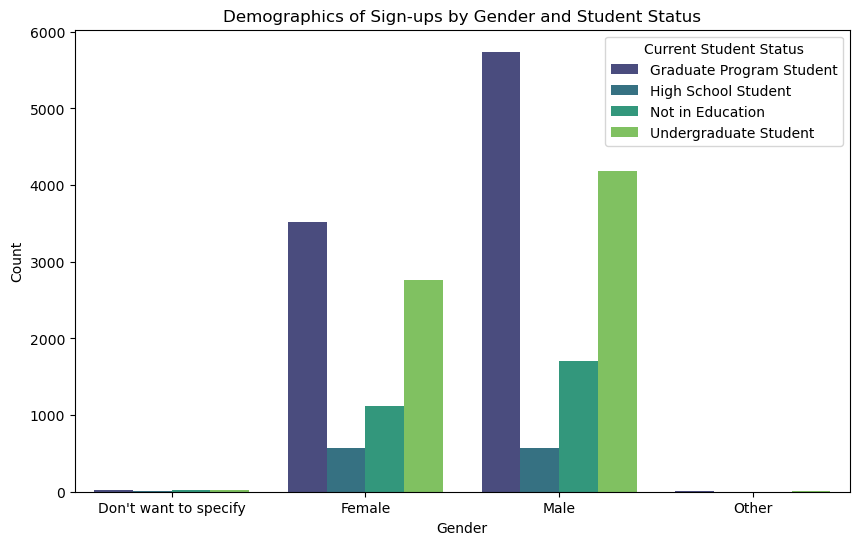

In [103]:
signups_demographics = opportunities.groupby(['Gender', 'Current Student Status']).size().reset_index(name='Count')

plt.figure(figsize=(10, 6))
sns.barplot(x='Gender', y='Count', hue='Current Student Status', data=signups_demographics, palette='viridis')
plt.title('Demographics of Sign-ups by Gender and Student Status')
plt.show()


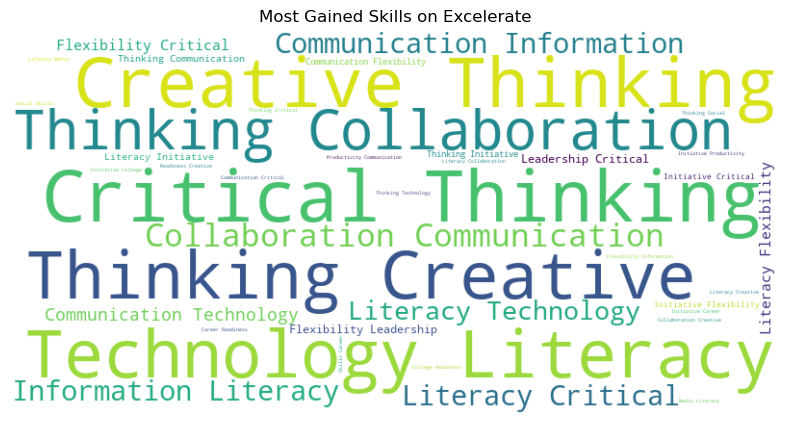

In [108]:
# Ensure all NaN values are excluded, including 'NaN' strings if present
skills_series = opportunities['Skills Earned'].dropna().astype(str)

# Filter out any 'nan' strings that might appear after conversion to string
skills_series = skills_series[skills_series.str.lower() != 'nan']

# Combine all valid skills into one string
skills = ' '.join(skills_series)

# Create the word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(skills)

# Plot the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Most Gained Skills on Excelerate')
plt.show()


In [ ]:
Preferred Sponsors

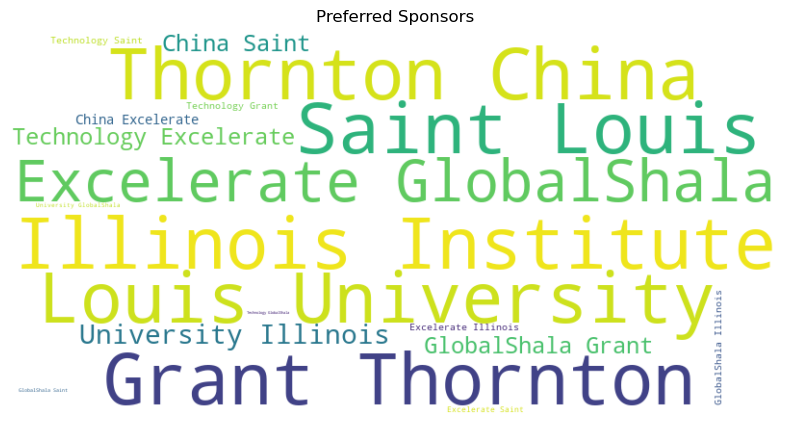

In [109]:
# Combine all sponsors into one string
sponsors = ' '.join(userdata['PreferredSponsors'].dropna().str.replace('[\[\]]', ''))  # Clean square brackets

# Create word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(sponsors)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Preferred Sponsors')
plt.show()


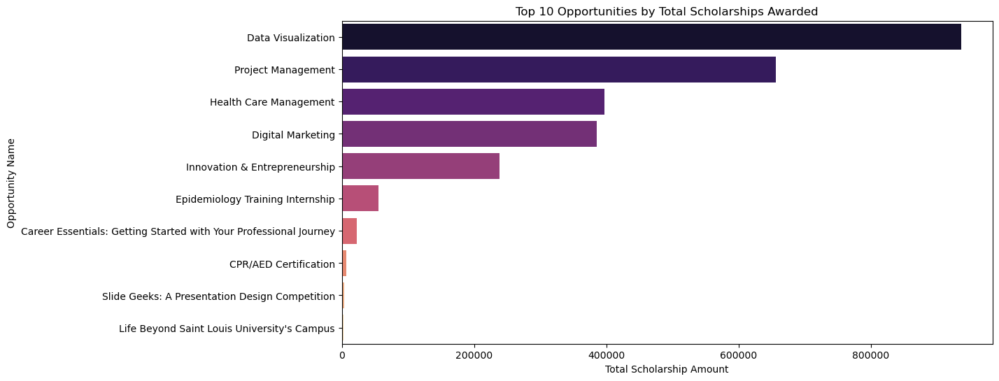

In [110]:
scholarship_awards = opportunities.groupby('Opportunity Name')['Reward Amount'].sum().reset_index()

plt.figure(figsize=(12, 6))
sns.barplot(x='Reward Amount', y='Opportunity Name', data=scholarship_awards.sort_values(by='Reward Amount', ascending=False).head(10), palette='magma')
plt.title('Top 10 Opportunities by Total Scholarships Awarded')
plt.xlabel('Total Scholarship Amount')
plt.show()


In [4]:
userdata.columns

Index(['PreferredSponsors', 'Gender', 'Country', 'Degree', 'Sign Up Date',
       'city', 'zip', 'isFromSocialMedia'],
      dtype='object')

In [8]:
userdata=pd.read_csv(r"C:\Users\vamsh\Downloads\UserData_cleaned.csv")
opportunities=pd.read_csv(r"C:\Users\vamsh\Downloads\Opportunities_cleaned.csv")

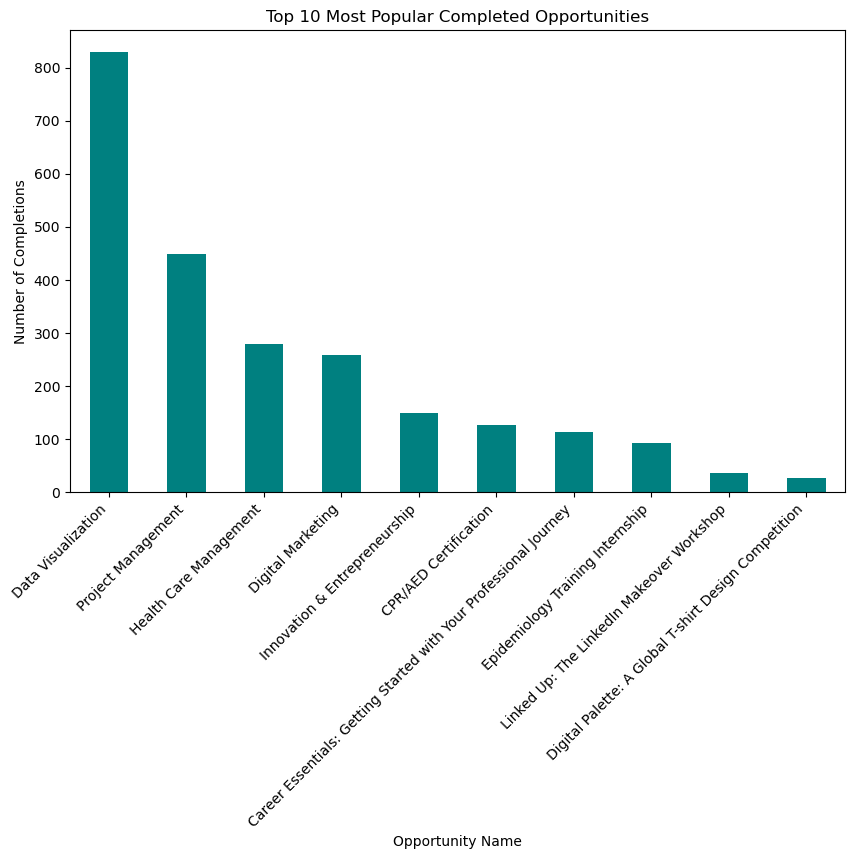

In [6]:
# Filter the opportunities that are marked as 'Completed'
completed_opportunities = opportunities[opportunities['Status Description'] == 'Rewards Award']

# Count the number of times each opportunity was completed
popular_completed_opportunities = completed_opportunities['Opportunity Name'].value_counts().head(10)

# Plot the Top 10 Completed Opportunities
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
popular_completed_opportunities.plot(kind='bar', color='teal')
plt.title('Top 10 Most Popular Completed Opportunities')
plt.ylabel('Number of Completions')
plt.xlabel('Opportunity Name')
plt.xticks(rotation=45, ha='right')
plt.show()


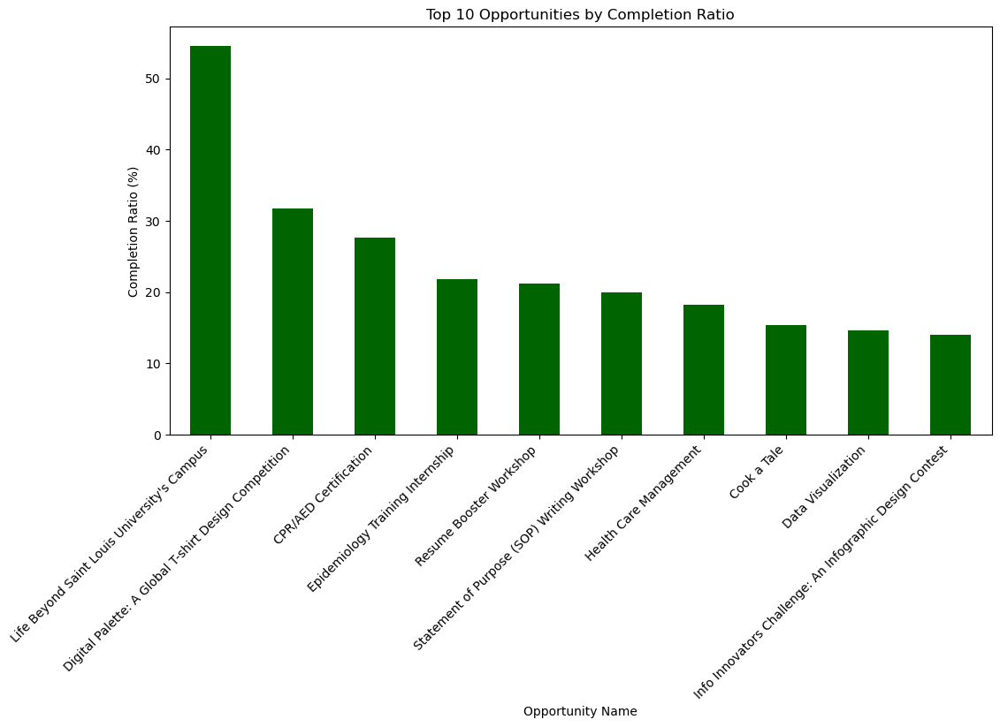

In [7]:
# Filter the completed opportunities
completed_opportunities = opportunities[opportunities['Status Description'] == 'Rewards Award']

# Count total sign-ups and completions for each opportunity
total_signups = opportunities['Opportunity Name'].value_counts()
completed_counts = completed_opportunities['Opportunity Name'].value_counts()

# Align the counts for opportunities (handle missing values)
completion_ratio = (completed_counts / total_signups) * 100
completion_ratio = completion_ratio.dropna().sort_values(ascending=False).head(10)

# Plot the Top 10 Opportunities by Completion Ratio
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
completion_ratio.plot(kind='bar', color='darkgreen')
plt.title('Top 10 Opportunities by Completion Ratio')
plt.ylabel('Completion Ratio (%)')
plt.xlabel('Opportunity Name')
plt.xticks(rotation=45, ha='right')
plt.show()


In [5]:
opportunities.columns

Index(['Profile Id', 'Opportunity Id', 'Opportunity Name',
       'Opportunity Category', 'Opportunity End Date', 'Gender', 'City',
       'State', 'Country', 'Zip Code', 'Graduation Date(YYYY MM)',
       'Current Student Status', 'Current/Intended Major',
       'Status Description', 'Apply Date', 'Opportunity Start Date',
       'Reward Amount', 'Badge Id', 'Badge Name', 'Skill Points Earned',
       'Skills Earned'],
      dtype='object')

In [9]:
import pandas as pd
import json

# Sample data including Gender and Country
data = opportunities[['Skills Earned', 'Skill Points Earned', 'Country', 'State', 'City', 'Status Description', 'Apply Date', 'Gender']]

df = pd.DataFrame(data)

# Function to flatten the skills
def flatten_skills(row):
    if pd.isna(row):
        return []
    else:
        return json.loads(row)

# Apply the function to flatten the skills
df['Flattened Skills'] = df['Skills Earned'].apply(flatten_skills)

# Explode the list into separate rows
exploded_df = df.explode('Flattened Skills')

# Remove NaN values (if any)
exploded_df = exploded_df[exploded_df['Flattened Skills'].notna()]

# Keep relevant columns in the exploded DataFrame
exploded_df = exploded_df[['Flattened Skills', 'Gender', 'Country']]
#print(exploded_df)
# Save the exploded DataFrame to CSV
exploded_df.to_csv(r"C:\Users\vamsh\Downloads\exploded_skills.csv", index=False)

print("Exploded DataFrame saved to exploded_skills.csv")



Exploded DataFrame saved to exploded_skills.csv


In [11]:
import pandas as pd
import json

# Sample data
df_cleaned = userdata.copy()

# Function to flatten the sponsors
def flatten_sponsors(row):
    if pd.isna(row):
        return []
    else:
        return json.loads(row)

# Apply the function
df_cleaned['Flattened Sponsors'] = df_cleaned['PreferredSponsors'].apply(flatten_sponsors)

# Explode the list into separate rows
exploded_sponsors_df = df_cleaned.explode('Flattened Sponsors')

# Remove NaN values
exploded_sponsors_df = exploded_sponsors_df[exploded_sponsors_df['Flattened Sponsors'].notna()]

# Keep relevant columns
exploded_sponsors_df = exploded_sponsors_df[['Flattened Sponsors']]

# Count occurrences of each sponsor
sponsor_counts = exploded_sponsors_df['Flattened Sponsors'].value_counts().reset_index()
sponsor_counts.columns = ['Sponsor', 'Count']

# Save to CSV for Google Data Studio
sponsor_counts.to_csv(r"C:\Users\vamsh\Downloads\top_sponsors.csv", index=False)


In [ ]:
import pandas as pd

# Load the data (assuming your DataFrame is named 'opportunities')
# Filter rows where Skill Points Earned > 0
scholarships_given = opportunities[opportunities['Skill Points Earned'] > 0]

# Count the number of scholarships awarded
total_scholarships = scholarships_given.shape[0]
print(f"Total Number of Scholarships Awarded: {total_scholarships}")
